In [36]:
import pandas as pd
import json
import os
from pandas.io.json import json_normalize 

In [40]:
os.chdir('/media/rober/HDD1/Git_Repo/yelp-graph-algorithms-master/')

In [41]:
# Check current working directory.
retval = os.getcwd()
print ("Current working directory %s" % retval)

Current working directory /media/rober/HDD1/Git_Repo/yelp-graph-algorithms-master


## Quick View on business.json dataset

In [48]:
# note that this json file contain multiple json objects, therefore it needs to decode it
with open('dataset/business.json') as f:data = [json.loads(line) for line in f]

In [50]:
df=pd.DataFrame.from_dict(data)

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192609 entries, 0 to 192608
Data columns (total 14 columns):
address         192609 non-null object
attributes      163773 non-null object
business_id     192609 non-null object
categories      192127 non-null object
city            192609 non-null object
hours           147779 non-null object
is_open         192609 non-null int64
latitude        192609 non-null float64
longitude       192609 non-null float64
name            192609 non-null object
postal_code     192609 non-null object
review_count    192609 non-null int64
stars           192609 non-null float64
state           192609 non-null object
dtypes: float64(3), int64(2), object(9)
memory usage: 20.6+ MB


In [52]:
df.head()

,address,attributes,business_id,categories,city,hours,is_open,latitude,longitude,name,postal_code,review_count,stars,state
0,2818 E Camino Acequia Drive,{'GoodForKids': 'False'},1SWheh84yJXfytovILXOAQ,"Golf, Active Life",Phoenix,None,0,33.522143,-112.018481,Arizona Biltmore Golf Club,85016,5,3.0,AZ
1,30 Eglinton Avenue W,"{'RestaurantsReservations': 'True', 'GoodForMe...",QXAEGFB4oINsVuTFxEYKFQ,"Specialty Food, Restaurants, Dim Sum, Imported...",Mississauga,"{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",1,43.605499,-79.652289,Emerald Chinese Restaurant,L5R 3E7,128,2.5,ON
2,"10110 Johnston Rd, Ste 15","{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...",gnKjwL_1w79qoiV3IC_xQQ,"Sushi Bars, Restaurants, Japanese",Charlotte,"{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",1,35.092564,-80.859132,Musashi Japanese Restaurant,28210,170,4.0,NC
3,"15655 W Roosevelt St, Ste 237",None,xvX2CttrVhyG2z1dFg_0xw,"Insurance, Financial Services",Goodyear,"{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",1,33.455613,-112.395596,Farmers Insurance - Paul Lorenz,85338,3,5.0,AZ
4,"4209 Stuart Andrew Blvd, Ste F","{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...",HhyxOkGAM07SRYtlQ4wMFQ,"Plumbing, Shopping, Local Services, Home Servi...",Charlotte,"{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",1,35.190012,-80.887223,Queen City Plumbing,28217,4,4.0,NC


In [121]:
short_list = df.loc[0:5,['categories']]

In [146]:
short_list

,categories
0,"Golf, Active Life"
1,"Specialty Food, Restaurants, Dim Sum, Imported..."
2,"Sushi Bars, Restaurants, Japanese"
3,"Insurance, Financial Services"
4,"Plumbing, Shopping, Local Services, Home Servi..."
5,"Shipping Centers, Couriers & Delivery Services..."


In [141]:
for f in short_list.values:
    print(f.item(0))

Golf, Active Life
Specialty Food, Restaurants, Dim Sum, Imported Food, Food, Chinese, Ethnic Food, Seafood
Sushi Bars, Restaurants, Japanese
Insurance, Financial Services
Plumbing, Shopping, Local Services, Home Services, Kitchen & Bath, Home & Garden, Water Heater Installation/Repair
Shipping Centers, Couriers & Delivery Services, Local Services, Printing Services


In [144]:
list=[]
for f in short_list.values:
    linha = f.item(0).split(", ")
    for item in linha:
        print(item)
        list.append(item)

Golf
Active Life
Specialty Food
Restaurants
Dim Sum
Imported Food
Food
Chinese
Ethnic Food
Seafood
Sushi Bars
Restaurants
Japanese
Insurance
Financial Services
Plumbing
Shopping
Local Services
Home Services
Kitchen & Bath
Home & Garden
Water Heater Installation/Repair
Shipping Centers
Couriers & Delivery Services
Local Services
Printing Services


In [145]:
len(list)

26

In [149]:
long_list = df.loc[:,['categories']]

In [158]:
big_list=[]
for f in long_list.values:    
    if f.item(0) is None: continue
    linha = f.item(0).split(", ")    
    for item in linha:
        print(item)
        big_list.append(item)

Golf
Active Life
Specialty Food
Restaurants
Dim Sum
Imported Food
Food
Chinese
Ethnic Food
Seafood
Sushi Bars
Restaurants
Japanese
Insurance
Financial Services
Plumbing
Shopping
Local Services
Home Services
Kitchen & Bath
Home & Garden
Water Heater Installation/Repair
Shipping Centers
Couriers & Delivery Services
Local Services
Printing Services
Beauty & Spas
Hair Salons
Hair Salons
Hair Stylists
Barbers
Men's Hair Salons
Cosmetics & Beauty Supply
Shopping
Beauty & Spas
Nail Salons
Beauty & Spas
Day Spas
Beauty & Spas
Nail Salons
Day Spas
Massage
Local Services
Professional Services
Computers
Shopping
Home Services
IT Services & Computer Repair
Internet Service Providers
Web Design
Restaurants
Breakfast & Brunch
Mexican
Tacos
Tex-Mex
Fast Food
Bars
Nightlife
Pubs
Barbers
Beauty & Spas
Irish Pub
Italian
Restaurants
Pizza
Chicken Wings
Bakeries
Food
Fitness & Instruction
Active Life
Yoga
Hair Stylists
Beauty & Spas
Hair Salons
Men's Hair Salons
Restaurants
Italian
Event Planning & Servic

Video/Film Production
Professional Services
Event Planning & Services
Photographers
Nutritionists
Sports Clubs
Fitness & Instruction
Active Life
Gyms
Trainers
Health & Medical
Boot Camps
Yoga
Food
Juice Bars & Smoothies
Gelato
Desserts
Event Planning & Services
Stadiums & Arenas
Music Venues
Nightlife
Hotels & Travel
Arts & Entertainment
Hotels
Contractors
Real Estate
Home Services
Property Management
Interior Design
Kitchen & Bath
Home Services
Contractors
Shopping
Cabinetry
Home & Garden
Office Cleaning
Professional Services
Home Services
Home Organization
Home Cleaning
Security Services
Professional Services
Tires
Automotive
Automotive
Auto Parts & Supplies
Mortgage Brokers
Real Estate
Professional Services
Advertising
Marketing
Real Estate Services
Home Services
Flowers & Gifts
Shopping
Gift Shops
Books
Mags
Music & Video
Bookstores
Laser Eye Surgery/Lasik
Optometrists
Health & Medical
Restaurants
Bakeries
Coffee & Tea
Sandwiches
Food
Patisserie/Cake Shop
Orthodontists
Health & Med

Museums
Fast Food
Restaurants
Chicken Wings
Halal
Burgers
Pizza
Wedding Planning
Venues & Event Spaces
Event Planning & Services
Eyelash Service
Cosmetics & Beauty Supply
Beauty & Spas
Permanent Makeup
Hair Salons
Shopping
Heating & Air Conditioning/HVAC
Home Services
Health & Medical
Orthodontists
Dentists
Optometrists
Obstetricians & Gynecologists
Hospitals
Health & Medical
Medical Centers
Drugstores
Urgent Care
Shopping
Pediatricians
Doctors
Veterinarians
Pets
Sandwiches
Wineries
Food
Beer
Wine & Spirits
Arts & Entertainment
American (New)
Restaurants
Ethiopian
Nightlife
Restaurants
Bars
Hookah Bars
Arts & Entertainment
Music Venues
Mortgage Brokers
Home Services
Real Estate
Nurseries & Gardening
Home & Garden
Home Decor
Florists
Flowers & Gifts
Shopping
Gift Shops
Wholesale Stores
Food
Coffee & Tea
Pan Asian
Restaurants
Sushi Bars
Japanese
Noodles
Nightlife
Bars
Food
Beer
Wine & Spirits
Sports Bars
Nightlife
Restaurants
Bars
American (Traditional)
Steakhouses
Restaurants
Diners
Aut

Hotels & Travel
Noodles
Taiwanese
Chinese
Restaurants
Beauty & Spas
Skin Care
Nail Salons
Eyelash Service
Pizza
Gluten-Free
Food
Restaurants
Car Rental
Hotels & Travel
Shopping
Florists
Event Planning & Services
Flowers & Gifts
Party & Event Planning
Automotive
Auto Parts & Supplies
Ice Cream & Frozen Yogurt
Burgers
Restaurants
Food
Food Delivery Services
Restaurants
Pizza
Food
American (Traditional)
Restaurants
Food
Desserts
Hungarian
Taiwanese
Food
Coffee & Tea
Cafes
Restaurants
Pizza
Health & Medical
Pharmacy
Shopping
Drugstores
Doctors
Health & Medical
Obstetricians & Gynecologists
Local Services
Shipping Centers
Interior Design
Shopping
Home Decor
Home & Garden
Local Services
Building Supplies
Fireplace Services
Contractors
Home Services
Nurseries & Gardening
Door Sales/Installation
Restaurants
Italian
Pizza
Chicken Wings
Auto Repair
Automotive
Shopping
Drugstores
Pharmacy
Health & Medical
Cannabis Clinics
Health & Medical
Pool & Hot Tub Service
Active Life
Swimming Pools
Pool Cle

Lounges
Bars
Restaurants
Nightlife
American (Traditional)
Chicken Wings
Pizza
Restaurants
Hawaiian
Restaurants
Professional Services
Wholesalers
Auto Parts & Supplies
Automotive
Pets
Pet Services
Pet Groomers
Cosmetics & Beauty Supply
Beauty & Spas
Skin Care
Shopping
Shutters
Home Decor
Home Services
Interior Design
Shopping
Contractors
Home & Garden
Shades & Blinds
Restaurants
Turkish
Local Services
Shoe Repair
Sewing & Alterations
Dentists
Health & Medical
Oral Surgeons
Orthodontists
Taxis
Airport Shuttles
Transportation
Limos
Party Bus Rentals
Event Planning & Services
Hotels & Travel
Food Delivery Services
Italian
Coffee & Tea
Restaurants
Food
Sandwiches
Pizza
Auto Parts & Supplies
Car Dealers
Automotive
Auto Repair
Body Shops
Restaurants
Breakfast & Brunch
Food
Ice Cream & Frozen Yogurt
Coffee & Tea
Restaurants
Food
Diners
Pizza
Cards & Stationery
Flowers & Gifts
Arts & Crafts
Gift Shops
Event Planning & Services
Shopping
Auto Parts & Supplies
Auto Repair
Tires
Oil Change Stations

Nightlife
Tiki Bars
Bars
Pizza
Chicken Wings
Italian
Food
Food Delivery Services
Restaurants
Beer
Wine & Spirits
Food
Restaurants
Sushi Bars
Japanese
Home Decor
Local Services
Furniture Reupholstery
Home & Garden
Antiques
Shopping
Furniture Stores
Italian
Restaurants
Breakfast & Brunch
American (Traditional)
Diners
Greek
Restaurants
Seafood
Restaurants
Thai
Chinese
Asian Fusion
Brewing Supplies
Propane
Grocery
Local Services
Food
Beer
Wine & Spirits
Shopping
Automotive
Auto Parts & Supplies
Auto Repair
Automotive
Acupuncture
Health & Medical
Traditional Chinese Medicine
Massage Therapy
Reflexology
Restaurants
Thai
Sushi Bars
Skin Care
Beauty & Spas
Hair Salons
Nail Salons
Country Clubs
Social Clubs
Nightlife
Tennis
Arts & Entertainment
Squash
Active Life
Doctors
Neurologist
Surgeons
Health & Medical
Hot Tub & Pool
Active Life
Furniture Stores
Shopping
Building Supplies
Grilling Equipment
Swimming Pools
Home & Garden
Outdoor Furniture Stores
Home Services
Grocery
Specialty Food
Food
Hea

Bagels
Coffee & Tea
Sandwiches
Bakeries
Food
Restaurants
Chinese
Hot Pot
Restaurants
Ramen
Japanese
Self Storage
Local Services
Movers
Home Services
Health & Medical
Massage Therapy
Acupuncture
Nutritionists
Venues & Event Spaces
Event Planning & Services
Shopping
Cooking Classes
Education
Cooking Schools
Arts & Crafts
Specialty Schools
Asian Fusion
Fast Food
Restaurants
Mexican
Food
Sushi Bars
American (New)
Poke
Barbers
Hair Salons
Beauty & Spas
Health & Medical
Massage Therapy
Beauty & Spas
Massage
Day Spas
Skin Care
Home Services
Solar Installation
Heating & Air Conditioning/HVAC
Contractors
Home Energy Auditors
Building Supplies
Nail Salons
Beauty & Spas
Nail Technicians
Restaurants
Thai
Vietnamese
Event Planning & Services
Party Bus Rentals
Party & Event Planning
Dance Clubs
Nightlife
Beauty & Spas
Hair Salons
Shopping
Ophthalmologists
Doctors
Optometrists
Health & Medical
Eyewear & Opticians
Cosmetic Dentists
General Dentistry
Health & Medical
Dentists
Tobacco Shops
Vape Shops
S

Rugs
Home Cleaning
Carpet Cleaning
Hair Salons
Blow Dry/Out Services
Beauty & Spas
Barbers
Food
Ice Cream & Frozen Yogurt
Shopping
Shoe Stores
Sporting Goods
Fashion
Restaurants
Greek
Apartments
Home Services
Real Estate
Desserts
Tea Rooms
Food
Juice Bars & Smoothies
Gelato
Bubble Tea
Beauty & Spas
Medical Spas
Doctors
Laser Hair Removal
Cosmetic Surgeons
Health & Medical
Hair Removal
Sandwiches
Soup
Restaurants
Breakfast & Brunch
Salad
Shopping
Local Services
Contractors
Handyman
Home Services
Home & Garden
Kitchen & Bath
Real Estate Agents
Home Services
Real Estate Services
Real Estate
Souvenir Shops
Women's Clothing
Gift Shops
Sporting Goods
Accessories
Shopping
Men's Clothing
Flowers & Gifts
Sports Wear
Fashion
Sandwiches
Food
Restaurants
Fast Food
Seafood
Middle Eastern
Restaurants
Ice Cream & Frozen Yogurt
Specialty Food
Chocolatiers & Shops
Food
Desserts
Home Decor
Kitchen & Bath
Shopping
Furniture Stores
Home & Garden
Nightlife
Restaurants
Italian
Bars
Event Planning & Services

American (New)
Coffee & Tea
Donuts
Restaurants
Food
Breakfast & Brunch
Gyms
Interval Training Gyms
Trainers
Fitness & Instruction
Boot Camps
Active Life
Boot Camps
Fitness & Instruction
Health & Medical
Trainers
Active Life
Boxing
Yoga
Weight Loss Centers
Massage Therapy
Cardio Classes
Gyms
Spray Tanning
Hair Removal
Tanning
Nail Salons
Beauty & Spas
Health & Medical
Counseling & Mental Health
Hypnosis/Hypnotherapy
Weight Loss Centers
Burgers
Restaurants
Breakfast & Brunch
American (Traditional)
Pet Stores
Pet Training
Pet Services
Pets
Pet Groomers
Food
Coffee & Tea
Donuts
Automotive
Auto Parts & Supplies
Food
Ethnic Food
Specialty Food
Hospitals
Health & Medical
Computers
Shopping
Home Network Installation
Professional Services
Web Design
Home Services
Local Services
IT Services & Computer Repair
Telecommunications
Vegan
Specialty Food
Gluten-Free
Breakfast & Brunch
Food
Bakeries
Restaurants
Cafes
Restaurants
American (Traditional)
Coffee & Tea
Food
Auto Repair
Automotive
Body Shops


American (Traditional)
Food
Nightlife
Restaurants
Nightlife
Breweries
Food
Bars
Beer Gardens
Beer Bar
Restaurants
Chicken Wings
Food
Grocery
Bars
Nightlife
Cocktail Bars
Dance Clubs
Halal
Food
Patisserie/Cake Shop
Caterers
Event Planning & Services
Indian
Restaurants
Vegetarian
Beauty & Spas
Skin Care
Hair Salons
Threading Services
Nail Salons
Hair Removal
Makeup Artists
Shopping
Discount Store
Dance Clubs
Nightlife
Automotive
Gas Stations
Specialty Food
Food
Synagogues
Religious Organizations
Fences & Gates
Home Services
Property Management
Home Services
Apartments
Real Estate
Water Purification Services
Plumbing
Water Heater Installation/Repair
Heating & Air Conditioning/HVAC
Home Services
Auto Detailing
Automotive
Car Wash
Burgers
Restaurants
Tattoo
Beauty & Spas
Nightlife
Dance Clubs
Home Services
Plumbing
Local Services
Buffets
Chinese
Restaurants
Transportation
Hotels & Travel
Shopping
Art Galleries
Arts & Entertainment
Heating & Air Conditioning/HVAC
Contractors
Home Services
Ap

Physical Therapy
Health & Medical
Medical Centers
Health & Medical
Doctors
Internal Medicine
Shopping
Office Equipment
Real Estate
Home Services
Apartments
Active Life
Brazilian Jiu-jitsu
Fitness & Instruction
Martial Arts
Italian
Steakhouses
Restaurants
Irish
Restaurants
Pubs
Food
Beer
Wine & Spirits
Nightlife
Bars
Asian Fusion
Food
Chinese
Fast Food
Gluten-Free
Restaurants
Child Care & Day Care
Local Services
Elementary Schools
Preschools
Education
Coffee & Tea
Food
Bakeries
Formal Wear
Women's Clothing
Shopping
Bridal
Fashion
Tires
Automotive
Auto Repair
Auto Parts & Supplies
Wheel & Rim Repair
Restaurants
Hotels
Hotels & Travel
Event Planning & Services
Car Dealers
Automotive
Body Shops
Auto Repair
Music Venues
Arts & Entertainment
Nightlife
General Dentistry
Health & Medical
Dentists
Beauty & Spas
Massage
Skin Care
Mediterranean
Nightlife
Bars
Restaurants
Wine Bars
Canadian (New)
French
Asian Fusion
Pubs
Nightlife
Bars
American (Traditional)
Sports Bars
Restaurants
Carpet Cleaning

Sports Medicine
Health & Medical
Orthopedists
Beauty & Spas
Massage Therapy
Medical Centers
Acupuncture
Health & Medical
Massage
Coffee & Tea
Food
Burgers
Fast Food
Restaurants
Shopping
Books
Mags
Music & Video
Toy Stores
Hobby Shops
Comic Books
Bars
Italian
Wine Bars
Restaurants
Salad
Nightlife
Books
Mags
Music & Video
Bookstores
Educational Services
Education
Shopping
Libraries
Public Services & Government
Restaurants
Pizza
Home Services
Plumbing
Kitchen & Bath
Home & Garden
Building Supplies
Shopping
Performing Arts
Arts & Entertainment
Shopping
Sporting Goods
Bikes
Professional Services
Web Design
Graphic Design
Marketing
Music Venues
Nightlife
American (Traditional)
Dive Bars
Beer
Wine & Spirits
Arts & Entertainment
Bars
Food
Restaurants
Auto Parts & Supplies
Grocery
Local Services
Dry Cleaning & Laundry
Automotive
Car Wash
Propane
Food
Laundry Services
Gas Stations
Shopping
Sporting Goods
Nightlife
Pubs
Casinos
Arts & Entertainment
Food
Bars
Beer
Wine & Spirits
Shopping
Antiques


Mobile Phones
Sports Bars
Nightlife
Breakfast & Brunch
American (Traditional)
Restaurants
Bars
Beauty & Spas
Day Spas
Skin Care
Medical Spas
Health & Medical
Women's Clothing
Shopping
Accessories
Fashion
Shoe Stores
Radiologists
Doctors
Diagnostic Services
Diagnostic Imaging
Health & Medical
Men's Clothing
Bespoke Clothing
Fashion
Formal Wear
Shoe Stores
Clothing Rental
Shopping
American (New)
Restaurants
Restaurants
Barbeque
International Grocery
Grocery
Specialty Food
Food
Ethnic Food
Beauty & Spas
Hair Salons
Beauty & Spas
Acupuncture
Massage Therapy
Physical Therapy
Massage
Health & Medical
Auto Insurance
Financial Services
Life Insurance
Home & Rental Insurance
Insurance
Shopping
Drugstores
Event Planning & Services
Venues & Event Spaces
Food
Shaved Ice
Ice Cream & Frozen Yogurt
Desserts
Packing Services
Local Services
Home Services
Shipping Centers
Mailbox Centers
Notaries
Auto Repair
Automotive
Food
Mexican
Ice Cream & Frozen Yogurt
Specialty Food
Candy Stores
Restaurants
Ice Cr

Fashion
Auto Repair
Shopping
Tires
Department Stores
Automotive
Shopping
Bespoke Clothing
Plus Size Fashion
Fashion
Formal Wear
Men's Clothing
Doctors
Gastroenterologist
Health & Medical
Family Practice
Pediatricians
Fitness & Instruction
Amateur Sports Teams
Gyms
Trainers
Active Life
Martial Arts
Cupcakes
Juice Bars & Smoothies
Food
Ice Cream & Frozen Yogurt
Custom Cakes
American (New)
Restaurants
Barbeque
Nurseries & Gardening
Home Services
Home & Garden
Tree Services
Shopping
Landscaping
Pets
Gardeners
Home Cleaning
Home Services
Carpet Cleaning
Office Cleaning
Window Washing
Local Services
Home Cleaning
Professional Services
Home Services
Mortgage Brokers
Real Estate
Banks & Credit Unions
Home Services
Financial Services
Body Shops
Auto Repair
Automotive
Orthodontists
Health & Medical
Dentists
Medical Centers
Physical Therapy
Health & Medical
Family Practice
Doctors
Beauty & Spas
Waxing
Nail Salons
Hair Removal
Skin Care
Men's Hair Salons
Hair Salons
Beauty & Spas
Makeup Artists
Ha

Pet Services
Home & Garden
Arts & Crafts
Home Decor
Shopping
Art Supplies
Fabric Stores
Restaurants
Desserts
Bakeries
Food
Jewelry
Shopping
Auto Parts & Supplies
Arts & Entertainment
Race Tracks
Automotive
Auto Repair
Pizza
Restaurants
Cocktail Bars
Bars
Lounges
Nightlife
Chinese
Restaurants
Asian Fusion
Chiropractors
Doctors
Health & Medical
Home Services
Professional Services
Home Organization
Home Cleaning
Office Cleaning
Car Wash
Auto Detailing
Automotive
Pool Halls
Nightlife
Bars
Active Life
Public Services & Government
Community Centers
Swimming Pools
Tennis
Local Services
Grout Services
Tiling
Pressure Washers
Home Services
Professional Services
Carpet Cleaning
Office Cleaning
Home Cleaning
Damage Restoration
Food
Coffee & Tea
Home Services
Sandwiches
American (Traditional)
Nightlife
Bars
Greek
Breakfast & Brunch
Restaurants
Day Spas
Beauty & Spas
Hair Salons
Nail Salons
Hair Extensions
Windows Installation
Kitchen & Bath
Home & Garden
Door Sales/Installation
Home Services
Shopp

Breakfast & Brunch
Diners
Restaurants
American (Traditional)
Chinese
Restaurants
Asian Fusion
Shopping
Jewelry
Active Life
Trainers
Fitness & Instruction
Gyms
Beauty & Spas
Tattoo
Piercing
Fast Food
Burgers
Restaurants
Motorcycle Repair
Bike Rentals
Automotive
Active Life
Motorcycle Dealers
Restaurants
Burgers
Health & Medical
Active Life
Yoga
Physical Therapy
Pilates
Fitness & Instruction
Home Services
Garage Door Services
Real Estate
Real Estate Agents
Home Services
Auto Repair
Automotive
Body Shops
Windshield Installation & Repair
Real Estate Services
Professional Services
Real Estate
Home Services
Real Estate Agents
Bars
American (New)
Restaurants
Nightlife
Lounges
Cocktail Bars
Burgers
American (Traditional)
Bars
Nightlife
Pubs
Steakhouses
Sports Bars
Restaurants
Event Planning & Services
Food Trucks
Food
Caterers
Street Vendors
Mexican
Restaurants
Nail Salons
Hair Extensions
Beauty & Spas
Hair Stylists
Hair Salons
Barbers
Pet Stores
Pets
Livestock Feed & Supply
Veterinarians
Shop

Food
Fast Food
Latin American
Restaurants
Mexican
Shopping
Bridal
Dentists
Health & Medical
Oral Surgeons
General Dentistry
Cosmetic Dentists
Home Services
University Housing
Real Estate
Restaurants
American (New)
Canadian (New)
Pizza
Ice Cream & Frozen Yogurt
Food
Fast Food
Burgers
Restaurants
Sandwiches
Restaurants
Coffee & Tea
Food
Singaporean
Body Shops
Automotive
Local Services
Flooring
Appliances & Repair
Home Services
American (Traditional)
Restaurants
Breakfast & Brunch
American (New)
Burgers
Apartments
Real Estate
Home Services
Men's Clothing
Shopping
Fashion
Women's Clothing
Chiropractors
Doctors
Health & Medical
Neurologist
Martial Arts
Trainers
Active Life
Gyms
Fitness & Instruction
Muay Thai
Coffee & Tea
Restaurants
Cafes
Food
Noodles
Japanese
Ramen
Restaurants
Bespoke Clothing
Fashion
Shopping
Formal Wear
Men's Clothing
Health & Medical
Chiropractors
Diagnostic Services
Diagnostic Imaging
Medical Centers
Health & Medical
American (Traditional)
Restaurants
American (New)
R

Fast Food
Chicken Shop
Canadian (New)
French
Restaurants
Tapas Bars
Movers
Home Services
Restaurants
Caribbean
American (Traditional)
Beer
Wine & Spirits
Restaurants
Food
Coffee & Tea
Food
Waxing
Nail Salons
Beauty & Spas
Hair Removal
Eyelash Service
Hair Salons
Beauty & Spas
Hair Extensions
Tobacco Shops
Shopping
Cosmetic Dentists
Dentists
Health & Medical
General Dentistry
Coffee & Tea
Food
Desserts
Coffee & Tea
Bakeries
Food
Transportation
Hotels & Travel
Limos
Arts & Entertainment
Art Galleries
Home & Garden
Shopping
Furniture Stores
Home Decor
Mexican
Restaurants
Appliances & Repair
Hardware Stores
Home & Garden
Local Services
Shopping
Garage Door Services
Building Supplies
Home Services
Landscape Architects
Landscaping
Tree Services
Home Services
Hair Salons
Sports Bars
Beauty & Spas
Barbers
Men's Hair Salons
Nightlife
Bars
Active Life
Bowling
Restaurants
Fast Food
Sandwiches
Restaurants
Mexican
Convenience Stores
Food
Car Rental
Hotels & Travel
Furniture Stores
Home & Garden
Sho

Farms
Specialty Food
Cheese Shops
Nurseries & Gardening
Food
Shopping
Women's Clothing
Accessories
Fashion
Plus Size Fashion
Fish & Chips
Restaurants
Seafood
Solar Installation
Gutter Services
Shades & Blinds
Contractors
Home Services
Insulation Installation
Roofing
Windows Installation
Local Services
IT Services & Computer Repair
Seafood
Seafood Markets
Restaurants
Specialty Food
Food
American (Traditional)
Bars
Nightlife
Restaurants
Pubs
Automotive
Auto Repair
Asian Fusion
Chinese
Restaurants
Pizza
Restaurants
Skin Care
Beauty & Spas
Hair Removal
Hair Salons
Men's Hair Salons
Nail Salons
Blow Dry/Out Services
Waxing
Hair Extensions
Health & Medical
Massage Therapy
Sports Clubs
Gyms
Yoga
Trainers
Active Life
Fitness & Instruction
Ice Cream & Frozen Yogurt
Food
Hair Salons
Barbers
Beauty & Spas
Home Services
Apartments
Real Estate
Restaurants
Caribbean
Canadian (New)
Women's Clothing
Shopping
Fashion
Formal Wear
Accessories
Nightlife
Karaoke
Music Venues
Arts & Entertainment
Bars
Delis

Beauty & Spas
Nail Salons
Nightlife
Food
Burgers
Restaurants
Pubs
Bars
Beer
Wine & Spirits
American (Traditional)
Burgers
Ice Cream & Frozen Yogurt
Food
Fast Food
Restaurants
Coffee & Tea
Breakfast & Brunch
Restaurants
Mediterranean
Food
Diners
Sandwiches
Specialty Food
Middle Eastern
Ethnic Food
Sports Bars
Bars
Nightlife
Restaurants
American (New)
Tobacco Shops
Shopping
Shopping
Jewelry
Comfort Food
Cocktail Bars
Restaurants
Seafood
Canadian (New)
Nightlife
Breakfast & Brunch
Gastropubs
Bars
Real Estate
Apartments
Home Services
Burgers
Breakfast & Brunch
Mediterranean
Restaurants
Auto Insurance
Insurance
Home & Rental Insurance
Financial Services
Restaurants
Burgers
Fast Food
Shoe Stores
Fashion
Shopping
Barbers
Caribbean
Beauty & Spas
Hair Salons
Dominican
Restaurants
Motorcycle Repair
Sporting Goods
Bikes
Automotive
Boating
Motorcycle Dealers
Shopping
Active Life
Nail Salons
Beauty & Spas
Lactation Services
Medical Centers
Health & Medical
Home Health Care
Prenatal/Perinatal Care
P

Beauty & Spas
Burgers
Restaurants
American (New)
Food
Ice Cream & Frozen Yogurt
Antiques
Shopping
Pets
Pet Services
Veterinarians
Pet Sitting
Buffets
Mongolian
Sushi Bars
Restaurants
Chinese
Health & Medical
Shopping
Delis
Pharmacy
Restaurants
Flowers & Gifts
Grocery
Florists
Food
Sandwiches
Mattresses
Furniture Stores
Home & Garden
Rugs
Home Decor
Shopping
Wine Bars
Nightlife
Bars
Seafood
Pizza
American (Traditional)
Italian
Restaurants
Hot Dogs
Restaurants
Reflexology
Yoga
Active Life
Health & Medical
Fitness & Instruction
American (Traditional)
Barbeque
Restaurants
Coffee & Tea
Food
Restaurants
Japanese
Automotive
Auto Repair
Body Shops
Restaurants
Salad
Pizza
American (Traditional)
Local Services
Bikes
Shopping
Bike Rentals
Active Life
Sporting Goods
Bike Repair/Maintenance
Mountain Biking
Educational Services
Education
Preschools
Elementary Schools
Middle Schools & High Schools
Nail Salons
Waxing
Eyelash Service
Beauty & Spas
Skin Care
Hair Removal
Pets
Pet Services
Pet Stores
Res

Active Life
Home Services
Apartments
Event Planning & Services
Hotels
Hotels & Travel
Real Estate
Venues & Event Spaces
Automotive
Car Dealers
Car Buyers
Used Car Dealers
Grocery
Delis
Specialty Food
Food
Meat Shops
Restaurants
Grocery
Food
Automotive
Auto Repair
Restaurants
Italian
Pizza
Waxing
Nail Salons
Beauty & Spas
Hair Salons
Hair Removal
Local Services
Self Storage
Home Services
Movers
Shopping
Wedding Planning
Art Supplies
Home Decor
Home & Garden
Arts & Crafts
Event Planning & Services
Hobby Shops
Fabric Stores
Coffee & Tea
Cafes
Indian
Food
Restaurants
Nutritionists
Weight Loss Centers
Health & Medical
Chinese
Restaurants
Public Services & Government
Active Life
Parks
Bike Repair/Maintenance
Shopping
Bikes
Sporting Goods
Local Services
Thai
Restaurants
Vietnamese
Auto Insurance
Financial Services
Home & Rental Insurance
Insurance
Caribbean
Restaurants
Burgers
Breakfast & Brunch
Diners
Restaurants
Caterers
Chicken Wings
Italian
Event Planning & Services
Restaurants
Mediterran

Restaurants
Watch Repair
Battery Stores
Watches
Local Services
Shopping
Home Services
Pool Cleaners
Pool & Hot Tub Service
Car Wash
Automotive
Auto Detailing
Oil Change Stations
Beauty & Spas
Tanning
Educational Services
Child Care & Day Care
Local Services
Education
Middle Schools & High Schools
Tutoring Centers
Private Tutors
Test Preparation
Elementary Schools
Food
Donuts
Coffee & Tea
Food
Health Markets
Specialty Food
Organic Stores
Grocery
Day Spas
Beauty & Spas
Skin Care
Massage
Beauty & Spas
Tattoo
Piercing
Arts & Entertainment
Music Venues
Nightlife
Desserts
Food
Ice Cream & Frozen Yogurt
Gelato
Obstetricians & Gynecologists
Doctors
Health & Medical
Beauty & Spas
Adult Entertainment
Nightlife
Restaurants
Steakhouses
Burgers
Halal
Indian
Bars
Burgers
Nightlife
Sports Bars
Wigs
Beer Bar
Chicken Wings
Restaurants
Shopping
Eyebrow Services
Permanent Makeup
Makeup Artists
Eyelash Service
Tattoo
Hair Removal
Skin Care
Beauty & Spas
Shopping
Home & Garden
Home Decor
Furniture Stores
R

Bakeries
Food
Desserts
Specialty Food
Food
Food Delivery Services
Health Markets
Shopping
Home Services
Mobile Phones
Mobile Phone Accessories
Internet Service Providers
Local Services
Professional Services
IT Services & Computer Repair
Telecommunications
Rock Climbing
Shopping
Hiking
Outdoor Gear
Active Life
Rafting/Kayaking
Climbing
Sporting Goods
Event Planning & Services
Wedding Planning
Venues & Event Spaces
Caterers
Beauty & Spas
Spray Tanning
Tanning
Skin Care
Tanning Beds
Shopping Centers
Beer
Wine & Spirits
Food
Shopping
Auto Repair
Tires
Automotive
Oil Change Stations
Urologists
Doctors
Health & Medical
Bars
Nightlife
Restaurants
American (Traditional)
Sports Bars
American (New)
Chicken Wings
Car Dealers
Auto Parts & Supplies
Hotels & Travel
Auto Repair
Body Shops
Car Wash
Car Rental
Automotive
Used
Vintage & Consignment
Fashion
Shopping
Event Planning & Services
Wedding Planning
Venues & Event Spaces
Restaurants
Delis
Sandwiches
Diners
Salad
Pizza
Restaurants
Steakhouses
Ame

Active Life
Grocery
Restaurants
Food
Mexican
Laser Hair Removal
Waxing
Day Spas
Beauty & Spas
Cosmetics & Beauty Supply
Hair Removal
Skin Care
Shopping
Restaurants
Mediterranean
American (Traditional)
Food
Beer
Wine & Spirits
Nightlife
Restaurants
Bars
Breakfast & Brunch
Arts & Entertainment
Hotels
Hotels & Travel
Resorts
Casinos
Event Planning & Services
Beauty & Spas
Day Spas
Massage
Nail Salons
Skin Care
Restaurants
Breakfast & Brunch
Diners
American (New)
Burgers
American (Traditional)
Chiropractors
Health & Medical
Medical Centers
Health & Medical
Drugstores
Shopping
Tapas/Small Plates
American (New)
Restaurants
French
Shopping
Bridal
Home Services
Movers
Beauty & Spas
Nail Salons
Hot Dogs
Food
Convenience Stores
Gas Stations
Automotive
Fast Food
Restaurants
Food
Gas Stations
Convenience Stores
Automotive
Food
Vegetarian
Food Delivery Services
Restaurants
Vegan
Food
Cafes
Coffee & Tea
Restaurants
Home & Garden
Shopping
Furniture Stores
Mattresses
Seafood
French
American (New)
Rest

Yoga
Hydrotherapy
Fitness & Instruction
Reflexology
Breakfast & Brunch
Diners
Restaurants
American (Traditional)
DJs
Event Planning & Services
Wedding Planning
Health & Medical
Diagnostic Services
Diagnostic Imaging
Obstetricians & Gynecologists
Doctors
Burgers
Fast Food
Restaurants
Hotels & Travel
Wedding Planning
Venues & Event Spaces
Event Planning & Services
Party & Event Planning
Hotels
Laser Hair Removal
Hair Removal
Beauty & Spas
Health & Medical
Skin Care
Medical Spas
Tires
Oil Change Stations
Auto Repair
Automotive
Home Services
Appliances & Repair
Local Services
Home & Garden
Shopping
Antiques
Lighting Fixtures & Equipment
Home Decor
Lawyers
Wills
Trusts
& Probates
Personal Injury Law
Professional Services
Estate Planning Law
Bankruptcy Law
Seafood
Steakhouses
Restaurants
Plumbing
Home Services
Contractors
Plumbing
Hardware Stores
Contractors
Shopping
Home & Garden
Home Services
Heating & Air Conditioning/HVAC
Automotive
Car Dealers
Auto Repair
Body Shops
Tea Rooms
Food
Auto 

Pharmacy
Optometrists
Shopping
Eyewear & Opticians
Health & Medical
Hot Dogs
Fast Food
Burgers
Restaurants
Windshield Installation & Repair
Automotive
Auto Glass Services
Shopping
Drugstores
Automotive
Public Services & Government
Departments of Motor Vehicles
Lounges
Nightlife
Bars
Event Planning & Services
Venues & Event Spaces
Carpenters
Plumbing
Painters
Handyman
Electricians
Home Services
Beauty & Spas
Piercing
Tattoo
Bars
Karaoke
Nightlife
Pubs
Weight Loss Centers
Urgent Care
Family Practice
Doctors
Health & Medical
Medical Centers
Diagnostic Services
Internal Medicine
Permanent Makeup
Hair Removal
Beauty & Spas
Eyelash Service
Skin Care
Restaurants
Sushi Bars
Poke
Japanese
Food
Beauty & Spas
Hair Salons
Cafes
Restaurants
Italian
Automotive
Car Wash
Auto Detailing
Mobile Phones
Shopping
Local Services
Telecommunications
IT Services & Computer Repair
Mobile Phone Accessories
Session Photography
Photographers
Event Photography
Event Planning & Services
Arts & Crafts
Shopping
Sporti

Restaurants
Building Supplies
Home Services
Shopping
Fashion
Department Stores
Oil Change Stations
Auto Repair
Tires
Automotive
Plumbing
Home Services
Water Heater Installation/Repair
Restaurants
Tex-Mex
Mexican
American (New)
Burgers
Restaurants
American (Traditional)
Sandwiches
Restaurants
Italian
Cosmetology Schools
Education
Specialty Schools
Real Estate
Real Estate Services
Home Services
Beauty & Spas
Nail Salons
Restaurants
Mexican
Nail Salons
Beauty & Spas
Auto Detailing
RV Repair
Trailer Repair
RV Dealers
Automotive
Home Decor
Shopping
Home & Garden
Furniture Stores
Automotive
Gas Stations
Tutoring Centers
Specialty Schools
Education
Shopping
Women's Clothing
Fashion
Men's Clothing
Children's Clothing
Pet Groomers
Pet Stores
Pet Training
Pet Services
Pets
Dog Walkers
Formal Wear
Clothing Rental
Men's Clothing
Shoe Stores
Bespoke Clothing
Shopping
Fashion
Hair Removal
Beauty & Spas
Day Spas
Nail Salons
Food
Bakeries
Cafes
Sandwiches
Coffee & Tea
Restaurants
Breakfast & Brunch
Be

Shopping
Wine Bars
Restaurants
Bars
Food
Tobacco Shops
American (New)
Pubs
Nightlife
Breweries
Landscape Architects
Fences & Gates
Home Services
Contractors
Men's Clothing
Women's Clothing
Children's Clothing
Used
Vintage & Consignment
Fashion
Shopping
Medical Centers
Urgent Care
Home Health Care
Health & Medical
Discount Store
Furniture Stores
Fashion
Department Stores
Home & Garden
Shopping
Home Decor
Cafes
Restaurants
Food
Coffee & Tea
Coffee Roasteries
Portuguese
Restaurants
Barbeque
Food
Ice Cream & Frozen Yogurt
Home Services
Real Estate
Mortgage Brokers
Desserts
Korean
Bakeries
Restaurants
Food
Middle Eastern
Restaurants
Fast Food
Burgers
Halal
Fast Food
Restaurants
Ice Cream & Frozen Yogurt
Food
Restaurants
American (New)
Asian Fusion
Restaurants
Chinese
Coffee & Tea
Food
Taiwanese
Hot Pot
Cafes
Sewing & Alterations
Local Services
Hotels & Travel
Car Rental
Body Shops
Automotive
Towing
Auto Repair
Cosmetic Dentists
Dentists
Health & Medical
General Dentistry
Orthodontists
Hair 

Bars
Parks
Public Services & Government
Active Life
Landmarks & Historical Buildings
Radio Stations
Mass Media
Transportation
Hotels & Travel
Airlines
Breakfast & Brunch
Cafes
Event Planning & Services
Restaurants
Caterers
Gastropubs
Dive Bars
Bars
Shopping
Wine Bars
Nightlife
Pubs
Restaurants
Antiques
Hair Salons
Beauty & Spas
Banks & Credit Unions
Home Services
Mortgage Brokers
Automotive
Real Estate
Auto Loan Providers
Financial Services
Investing
Customized Merchandise
Photography Stores & Services
Shopping
Souvenir Shops
Fast Food
Burgers
Restaurants
Food
Coffee & Tea
Home Services
Property Management
Apartments
Real Estate
Home Services
Fences & Gates
Contractors
Electricians
Home Services
Piercing
Tattoo
Beauty & Spas
Food
Coffee & Tea
Restaurants
Bars
Music Venues
American (New)
Venues & Event Spaces
Nightlife
Caterers
Arts & Entertainment
Event Planning & Services
Italian
Pubs
Party & Event Planning
Salad
Bars
Pubs
Irish Pub
Nightlife
Restaurants
Sandwiches
Amusement Parks
Act

Shopping
Accessories
Women's Clothing
Sandwiches
Tacos
Italian
Beer
Wine & Spirits
Mexican
Bars
Nightlife
Restaurants
Food
Pizza
Home Services
Musical Instrument Services
Local Services
Movers
Piano Services
Decks & Railing
Hardware Stores
Shopping
Building Supplies
Home & Garden
Home Services
Restaurants
Caribbean
Specialty Food
Food
Indian
Life Coach
Business Consulting
Career Counseling
Professional Services
Home Services
Home & Garden
Shopping
Carpeting
Furniture Stores
Interior Design
Mediterranean
Restaurants
Moroccan
Restaurants
Pizza
Automotive
Auto Glass Services
Local Flavor
Restaurants
Specialty Food
Hawaiian
Ethnic Food
Asian Fusion
Poke
Food
Sushi Bars
Japanese
Restaurants
Automotive
Auto Repair
Party Supplies
Party & Event Planning
Event Planning & Services
Balloon Services
Women's Clothing
Shopping
Fashion
Accessories
Bridal
Home Services
Flooring
Masonry/Concrete
Restaurants
Vegan
Grocery
Food
Vegetarian
Coffee & Tea
Restaurants
Diners
Breakfast & Brunch
American (Tradi

Restaurants
Southern
Fast Food
Shopping
Coffee & Tea
Tea Rooms
Food
Barbers
Beauty & Spas
Sushi Bars
Food
Food Trucks
Restaurants
Food
Beer
Wine & Spirits
Hotels & Travel
American (New)
Gas Stations
Restaurants
Convenience Stores
Food
Automotive
Specialty Food
Sushi Bars
Nightlife
Bars
Restaurants
Food
Beauty & Spas
Barbers
Professional Services
Marketing
Pets
Pet Sitting
Pet Services
Dog Walkers
Financial Advising
Financial Services
Business Consulting
Life Coach
Professional Services
Bubble Tea
Food
Hobby Shops
Shopping
Pawn Shops
Jewelry
Shopping
Guns & Ammo
Education
Specialty Schools
Nail Salons
Beauty & Spas
Cosmetology Schools
Hair Salons
Grocery
Food
Shopping
Active Life
Pets
Outdoor Gear
Horseback Riding
Pet Stores
Sporting Goods
Pet Sitting
Pets
Pet Transportation
Pet Services
Dog Walkers
Auto Repair
Automotive
Shopping
Fashion
Department Stores
Outlet Stores
Sporting Goods
Shopping
Restaurants
Pizza
Food
Ice Cream & Frozen Yogurt
Antiques
Shopping
Jewelry
Spray Tanning
Beaut

Coffee & Tea
Wholesale Stores
Event Planning & Services
Candy Stores
Specialty Food
Dentists
General Dentistry
Cosmetic Dentists
Health & Medical
Beauty & Spas
Nail Salons
Women's Clothing
Arts & Crafts
Accessories
Fashion
Shopping
Restaurants
Canadian (New)
Breakfast & Brunch
Restaurants
Fast Food
Sandwiches
Restaurants
Portuguese
Argentine
Steakhouses
Guns & Ammo
Shopping
Mexican
Restaurants
Fast Food
Food
Coffee & Tea
Bakeries
Restaurants
Grocery
Food
Videos & Video Game Rental
Shopping
Books
Mags
Music & Video
Video Game Stores
Pets
Veterinarians
Restaurants
Greek
Electricians
Shopping
Electronics
Shades & Blinds
Home Theatre Installation
Security Systems
Home Services
Graphic Design
Advertising
Utilities
Professional Services
Print Media
Local Services
Shipping Centers
Printing Services
Mass Media
Home Services
Restaurants
Lounges
Fondue
Bars
Cocktail Bars
Nightlife
Education
Preschools
Elementary Schools
Local Services
Child Care & Day Care
Beauty & Spas
Hair Salons
Chinese
Resta

Real Estate
Real Estate Services
Home Services
Real Estate Agents
Barbers
Beauty & Spas
Mexican
Restaurants
Hotels & Travel
Event Planning & Services
Hotels
British
Sandwiches
American (New)
American (Traditional)
Restaurants
Breakfast & Brunch
Specialty Food
Candy Stores
Food
Bakeries
Grocery
Delis
Food
Sandwiches
Restaurants
Italian
Event Planning & Services
Caterers
Shopping
Health & Medical
Education
Adult Education
Lactation Services
Baby Gear & Furniture
Doulas
Midwives
Food
Coffee & Tea
Nightlife
Internet Cafes
Coffeeshops
Nail Salons
Beauty & Spas
Active Life
Amateur Sports Teams
Event Planning & Services
Party & Event Planning
Arcades
Arts & Entertainment
Amusement Parks
Laser Tag
Venues & Event Spaces
Thai
Tea Rooms
Singaporean
Restaurants
Soup
Vietnamese
Food
Restaurants
Pizza
Breakfast & Brunch
Food
Shopping
Pharmacy
Drugstores
Health & Medical
Nail Salons
Hair Removal
Hair Salons
Hair Extensions
Waxing
Beauty & Spas
Education
Educational Services
Bookstores
Books
Mags
Musi

Beauty & Spas
Massage
Restaurants
Vietnamese
Restaurants
Seafood
Chinese
Soup
Tires
Automotive
Oil Change Stations
Auto Repair
Restaurants
Fast Food
Chinese
Specialty Schools
Barre Classes
Dance Schools
Gyms
Pilates
Pole Dancing Classes
Education
Dance Clubs
Fitness & Instruction
Weight Loss Centers
Health & Medical
Arts & Entertainment
Nightlife
Professional Services
Active Life
Dance Studios
Yoga
Restaurants
Chinese
Fast Food
Nightlife
Beer
Wine & Spirits
Food
Tacos
Tex-Mex
Soup
Mexican
Restaurants
Seafood
Home Services
Interior Design
Kitchen & Bath
Cabinetry
Furniture Stores
Home Decor
Home & Garden
Shopping
Door Sales/Installation
American (New)
Breakfast & Brunch
Sandwiches
Nightlife
Burgers
Bars
Restaurants
American (Traditional)
Salad
Health & Medical
Doctors
Hearing Aid Providers
Cosmetic Surgeons
Ear Nose & Throat
Audiologist
Allergists
Restaurants
Food
Pizza
American (Traditional)
Fast Food
Restaurants
Greek
Nail Salons
Beauty & Spas
Plumbing
Painters
Home Services
Electrici

Glass & Mirrors
Italian
Restaurants
Seafood
Shopping
Head Shops
Tobacco Shops
Art Galleries
Arts & Entertainment
Cafes
Sushi Bars
Restaurants
Creperies
Ice Cream & Frozen Yogurt
Juice Bars & Smoothies
Coffee & Tea
Food
Breakfast & Brunch
Local Services
Post Offices
Shipping Centers
Public Services & Government
Fitness & Instruction
Self-defense Classes
Active Life
Local Services
Sports Clubs
Community Service/Non-Profit
Martial Arts
Flowers & Gifts
Shopping
Gift Shops
Children's Clothing
Toy Stores
Fashion
Middle Schools & High Schools
Education
Restaurants
American (Traditional)
Nightlife
Sports Bars
Bars
Home Services
Apartments
Real Estate
Mexican
Restaurants
Coffee & Tea
Food
Restaurants
Breakfast & Brunch
Vegetarian
American (New)
Karaoke
Restaurants
Nightlife
Bars
American (Traditional)
Automotive
Body Shops
Mobile Dent Repair
Oncologist
Health & Medical
Doctors
Fashion
Sports Wear
Sporting Goods
Shopping
Specialty Schools
Scuba Diving
Education
Active Life
Diving
Coffee & Tea
Fo

Automotive
Web Design
Professional Services
Marketing
Home Services
Keys & Locksmiths
Chinese
Seafood
Dim Sum
Soup
Town Car Service
Asian Fusion
Limos
Local Services
Restaurants
Transportation
Hotels & Travel
Beauty & Spas
Szechuan
Thai
Day Spas
Septic Services
Beauty & Spas
Hair Salons
Cosmetics & Beauty Supply
Shopping
Beauty & Spas
Hot Pot
Restaurants
Chinese
Nightlife
Diners
Restaurants
Bars
Home & Garden
Shopping
Furniture Stores
Food
Restaurants
Sandwiches
Delis
Vegan
Desserts
Cosmetic Dentists
Health & Medical
General Dentistry
Oral Surgeons
Dentists
Auto Repair
Body Shops
Automotive
Real Estate
Apartments
Home Services
Asian Fusion
Indian
Pakistani
Restaurants
Signmaking
Local Services
Shipping Centers
Professional Services
Printing Services
Shopping
Comic Books
Hobby Shops
Toy Stores
Books
Mags
Music & Video
Nightlife
Arcades
Restaurants
Cafes
Lounges
Bars
Arts & Entertainment
Martial Arts
Boot Camps
Fitness & Instruction
Trainers
Taekwondo
Active Life
Professional Services
La

Roofing
Home Services
Real Estate Agents
Real Estate Services
Home Services
Real Estate
Property Management
Pet Services
Health & Medical
Pet Stores
Hospitals
Veterinarians
Pets
Pet Groomers
Pet Sitting
Pet Boarding
Automotive
Auto Repair
Carpeting
Carpet Cleaning
Professional Services
Local Services
Home Services
Restaurants
Shopping
Indian
Arts & Crafts
Pakistani
Middle Eastern
Day Spas
Laser Hair Removal
Beauty & Spas
Hair Removal
Sporting Goods
Party Equipment Rentals
Home Services
Machine & Tool Rental
Building Supplies
Local Services
Event Planning & Services
Party Supplies
Shopping
Pet Services
Pets
Veterinarians
Threading Services
Beauty & Spas
Shopping
Eyelash Service
Cosmetics & Beauty Supply
Hair Removal
Local Services
Sewing & Alterations
Waxing
Hair Removal
Nail Salons
Beauty & Spas
Eyelash Service
Skin Care
Self Storage
Shopping
Packing Supplies
Automotive
Local Services
Truck Rental
Organic Stores
Food
Grocery
Cocktail Bars
Event Planning & Services
Restaurants
American 

Event Planning & Services
Shopping
Local Services
Packing Supplies
Self Storage
Dry Cleaning & Laundry
Local Services
Sewing & Alterations
Women's Clothing
Bridal
Fashion
Shopping
Formal Wear
Body Shops
Auto Glass Services
Automotive
Auto Detailing
Threading Services
Skin Care
Hair Removal
Beauty & Spas
Waxing
Laboratory Testing
Obstetricians & Gynecologists
Medical Centers
Doctors
Health & Medical
Diagnostic Services
Event Planning & Services
Hotels & Travel
Hotels
Real Estate Services
Real Estate
Real Estate Agents
Home Services
Shopping
Antiques
Windshield Installation & Repair
Automotive
Auto Glass Services
Cocktail Bars
Bars
Nightlife
Food
Beer
Wine & Spirits
Child Care & Day Care
Local Services
Home & Garden
Furniture Stores
Shopping
Thrift Stores
Home Decor
Burgers
Restaurants
Fast Food
Makeup Artists
Hair Salons
Cosmetics & Beauty Supply
Blow Dry/Out Services
Hair Extensions
Hair Stylists
Wigs
Beauty & Spas
Hair Loss Centers
Shopping
Education
Middle Schools & High Schools
Elem

Restaurants
Restaurants
Pizza
Italian
Restaurants
Japanese
Asian Fusion
Bars
Cocktail Bars
Nightlife
Pizza
Restaurants
Fast Food
Makeup Artists
Eyelash Service
Beauty & Spas
Day Spas
Hair Removal
Waxing
Bars
Irish
Restaurants
Beer
Wine & Spirits
Nightlife
Irish Pub
Pubs
Salad
Fish & Chips
Food
Bars
Food
Shopping
Coffee & Tea
Nightlife
Bookstores
Books
Mags
Music & Video
Wine Bars
Pizza
Italian
Restaurants
Bars
Salad
Sandwiches
Nightlife
Shopping
Electronics
Office Equipment
Computers
Mobile Phones
Home Services
Home Cleaning
Shopping
Jewelry
Drugstores
Health & Medical
Shopping
Pharmacy
Veterinarians
Pet Sitting
Pet Services
Pet Boarding
Pet Groomers
Pets
Restaurants
Chinese
Burgers
Restaurants
Fast Food
Massage
Health & Medical
Chiropractors
Physical Therapy
Beauty & Spas
Massage Therapy
Arts & Entertainment
Tattoo
Beauty & Spas
Art Galleries
Shopping
Shopping
Restaurants
Sushi Bars
Day Spas
Beauty & Spas
Nail Salons
Doctors
Psychiatrists
Health & Medical
Food
Restaurants
Chinese
Bake

Beauty & Spas
Hair Removal
Makeup Artists
Real Estate
Home Services
Real Estate Agents
Vacation Rental Agents
Tours
Travel Services
Hotels & Travel
Tanning
Skin Care
Spray Tanning
Beauty & Spas
Eyelash Service
Day Spas
Professional Services
Restaurants
Italian
Middle Eastern
Kosher
Restaurants
Religious Organizations
Churches
Bars
Pubs
Nightlife
Health & Medical
Rehabilitation Center
Physical Therapy
Retirement Homes
Restaurants
Tex-Mex
Mexican
Fast Food
Sandwiches
Restaurants
Fast Food
Sandwiches
Restaurants
Framing
Arts & Crafts
Shopping
Doctors
Health & Medical
Family Practice
Pubs
Bars
Restaurants
Nightlife
American (New)
Restaurants
Mexican
Mattresses
Shopping
Fashion
Outlet Stores
Appliances
Department Stores
Local Services
Home & Garden
Appliances & Repair
Children's Clothing
Restaurants
Italian
Pizza
Italian
Modern European
Restaurants
Food
Coffee & Tea
Cafes
Bars
Wine Bars
Restaurants
Nightlife
Beer
Wine & Spirits
Tapas/Small Plates
Sandwiches
Cocktail Bars
Caribbean
Nightlife

Acupuncture
Fertility
Naturopathic/Holistic
Reiki
Health & Medical
Active Life
Education
Swimming Lessons/Schools
Fitness & Instruction
Specialty Schools
Shopping
Tobacco Shops
Auto Repair
Automotive
Auto Parts & Supplies
Glass & Mirrors
Shopping
Kitchen & Bath
Windows Installation
Home Services
Home & Garden
Health & Medical
Medical Spas
Beauty & Spas
Restaurants
Nightlife
Bars
Sushi Bars
Beer Bar
Korean
Japanese
Dentists
General Dentistry
Health & Medical
Parks
Mountain Biking
Active Life
Beer
Wine & Spirits
Food
Restaurants
Nightlife
Bars
Gastropubs
American (New)
Lounges
Belgian
Health & Medical
Psychologists
Psychiatrists
Doctors
Counseling & Mental Health
Neurologist
Real Estate
Home Services
Estate Liquidation
Venues & Event Spaces
Event Planning & Services
Coffee & Tea
Restaurants
Cafes
Food
Pizza
Restaurants
Health & Medical
General Dentistry
Dentists
Nail Salons
Beauty & Spas
Restaurants
Italian
Pizza
Sandwiches
Endodontists
Dentists
Health & Medical
Dental Hygienists
Cosmeti

Gyms
Boot Camps
Active Life
Interval Training Gyms
Fitness & Instruction
Pubs
Beer
Wine & Spirits
Bars
Food
Golf
Restaurants
Active Life
Nightlife
Venues & Event Spaces
Event Planning & Services
American (Traditional)
Salvadoran
Latin American
Restaurants
Soul Food
Mexican
Barbers
Hair Salons
Men's Hair Salons
Beauty & Spas
Restaurants
Vietnamese
Comfort Food
Food
Local Flavor
Breakfast & Brunch
Restaurants
Event Planning & Services
Coffee & Tea
American (New)
Venues & Event Spaces
Canadian (New)
Cafes
Fast Food
Restaurants
Hair Salons
Beauty & Spas
Nightlife
Restaurants
Coffee & Tea
Food
Lounges
Cafes
Bars
Restaurants
Chinese
Korean
Restaurants
Peruvian
Restaurants
Latin American
Seafood
Japanese
Sushi Bars
Restaurants
Shopping
Tobacco Shops
Vape Shops
Ice Cream & Frozen Yogurt
Food
Shaved Ice
Piercing
Beauty & Spas
Tattoo
Event Planning & Services
Food
Caterers
Restaurants
Mexican
Beauty & Spas
Hair Salons
Skin Care
Day Spas
Automotive
Gas Stations
Local Services
Dry Cleaning & Laund

Burgers
Food
Restaurants
Event Planning & Services
Caterers
Food Trucks
Automotive
Parking
Shopping
Vape Shops
Pet Groomers
Pet Sitting
Pets
Pet Services
Gastropubs
Restaurants
Food
Chinese
Ethnic Food
Restaurants
Specialty Food
Physical Therapy
Health Coach
Massage Therapy
Health & Medical
Occupational Therapy
Home Decor
Grilling Equipment
Shopping
Home & Garden
Home Services
Furniture Stores
Fireplace Services
Outdoor Furniture Stores
Appliances
Heating & Air Conditioning/HVAC
American (Traditional)
Beer
Wine & Spirits
Food
Restaurants
Music Venues
Arts & Entertainment
Irish Pub
Bars
Nightlife
Gastropubs
Obstetricians & Gynecologists
Health & Medical
Doctors
Family Practice
Chiropractors
Chicken Wings
Restaurants
Pizza
Buffets
Cheese Shops
Food
Specialty Food
Local Services
Contractors
Home Cleaning
Damage Restoration
Carpet Cleaning
Home Services
Home Inspectors
Party & Event Planning
Sports Clubs
Active Life
Team Building Activities
Recreation Centers
Arts & Entertainment
Event Pla

Skin Care
Beauty & Spas
Waxing
Permanent Makeup
Hair Removal
Financial Services
Banks & Credit Unions
Smokehouse
Food
Food Trucks
Sandwiches
Restaurants
Barbeque
Medical Centers
Health & Medical
Obstetricians & Gynecologists
Doctors
Shopping
Adult
Lingerie
Fashion
Tours
Public Services & Government
Transportation
Public Transportation
Hotels & Travel
Landmarks & Historical Buildings
Bars
Nightlife
Pubs
Home Services
Apartments
Real Estate
Personal Chefs
Event Planning & Services
Food Delivery Services
Caterers
Food
Chiropractors
Health & Medical
Fashion
Shoe Stores
Shopping
Accessories
Real Estate Agents
Real Estate
Home Services
Property Management
Real Estate Services
Automotive
Auto Repair
Tires
Oil Change Stations
Men's Clothing
Shopping
Accessories
Fashion
Formal Wear
Bespoke Clothing
Antiques
Shopping
Restaurants
Vegetarian
Seafood
Mexican
Home Services
Real Estate Agents
Real Estate
Real Estate Services
Interior Design
Home Services
Home & Garden
Shopping
Furniture Stores
Auto R

Optometrists
Cosmetic Surgeons
Health & Medical
Doctors
Plastic Surgeons
Beauty & Spas
Ophthalmologists
Sandwiches
Restaurants
Salad
American (Traditional)
Southern
Barbeque
Food
Meat Shops
Specialty Food
Fashion
Shopping
Men's Clothing
Automotive
Oil Change Stations
Transmission Repair
Auto Repair
Auto Glass Services
Internal Medicine
Health & Medical
Doctors
Food
Convenience Stores
Automotive
Gas Stations
Event Planning & Services
Shopping
Discount Store
Party Supplies
Home Services
Contractors
Family Practice
Doctors
Health & Medical
Urgent Care
Nightlife
Food
Coffee & Tea
Tea Rooms
Restaurants
Bubble Tea
Chinese
Auto Repair
Automotive
Public Services & Government
Shipping Centers
Post Offices
Local Services
Brasseries
Breakfast & Brunch
Nightlife
French
Bars
Cocktail Bars
Restaurants
Trainers
Active Life
Fitness & Instruction
Gyms
Apartments
Real Estate
Home Services
Personal Injury Law
General Litigation
Lawyers
Real Estate Law
Professional Services
Restaurants
Food Delivery Servi

Lighting Fixtures & Equipment
Food
Bakeries
Desserts
Home Services
Apartments
Real Estate
Event Planning & Services
Hotels & Travel
Hotels
Boat Dealers
Motorcycle Dealers
ATV Rentals/Tours
Active Life
RV Repair
Boat Repair
Motorcycle Repair
Automotive
Professional Services
Body Shops
Restaurants
Sandwiches
Waxing
Hair Salons
Day Spas
Nail Salons
Beauty & Spas
Eyebrow Services
Hair Removal
Chinese
Restaurants
Active Life
Gyms
Trainers
Fitness & Instruction
Salad
Food
Italian
Food Delivery Services
Pizza
Restaurants
Auto Repair
Automotive
Car Dealers
Used Car Dealers
Tobacco Shops
Shopping
Shopping
Home Theatre Installation
Electronics
Home Services
Home Network Installation
Home Automation
Active Life
Fitness & Instruction
Yoga
Home Services
Home Organization
Home Cleaning
Auto Repair
Automotive
Auto Parts & Supplies
Transmission Repair
Caribbean
Restaurants
Education
Local Services
Child Care & Day Care
Preschools
Jewelry
Electronics
Shopping
Pawn Shops
Lounges
Bars
Nightlife
Shopping


Lebanese
Restaurants
New Mexican Cuisine
Restaurants
Mexican
Tacos
Professional Services
Tax Services
Financial Advising
Financial Services
Accountants
Food
Juice Bars & Smoothies
Food
Sandwiches
Restaurants
Bakeries
Cuban
Tattoo
Beauty & Spas
Elementary Schools
Preschools
Education
Desserts
Restaurants
Fast Food
Food
Burgers
Ice Cream & Frozen Yogurt
Professional Services
Hotels
Travel Services
Airports
Hotels & Travel
Translation Services
Nightlife
Airport Lounges
Event Planning & Services
Bars
Lounges
Massage
Beauty & Spas
Tanning
Nail Salons
Food
Food Trucks
Local Flavor
Bars
Cocktail Bars
Lounges
Nightlife
Active Life
Day Spas
Massage
Massage Therapy
Health & Medical
Yoga
Fitness & Instruction
Beauty & Spas
Pilates
Reiki
Hair Removal
Medical Spas
Health & Medical
Skin Care
Beauty & Spas
Waxing
Laser Hair Removal
Day Spas
Restaurants
Sandwiches
Fast Food
Food
Ice Cream & Frozen Yogurt
Japanese
Grocery
Specialty Food
Cheese Shops
Restaurants
Food
Korean
Delis
Sandwiches
Restaurants


Convenience Stores
Automotive
Shopping
Outlet Stores
Food
Seafood
Restaurants
Desserts
Bistros
Restaurants
French
Food
Patisserie/Cake Shop
Hot Dogs
Food
Fast Food
Specialty Food
Restaurants
Desserts
Grocery
Bakeries
Food
Convenience Stores
Beauty & Spas
Hair Removal
Nail Salons
Waxing
Beauty & Spas
Piercing
Tattoo
Nightlife
Bars
Restaurants
Sports Bars
Burgers
Canadian (New)
American (Traditional)
Fashion
Shopping
Women's Clothing
Used
Vintage & Consignment
Nurseries & Gardening
Home & Garden
Shopping
Korean
Restaurants
Japanese
Steakhouses
Sushi Bars
Restaurants
Restaurants
Mediterranean
Seafood
American (New)
Bars
Steakhouses
Nightlife
Health & Medical
Acupuncture
Chiropractors
Women's Clothing
Men's Clothing
Fashion
Shopping
Burgers
American (Traditional)
Fast Food
Restaurants
Active Life
Child Care & Day Care
Local Services
Education
Summer Camps
Preschools
Shopping
Fashion
Women's Clothing
Threading Services
Nail Salons
Waxing
Beauty & Spas
Hair Removal
Accessories
Beauty & Spas


Bars
Nightlife
Chicken Wings
Italian
Sandwiches
Doctors
Obstetricians & Gynecologists
Medical Centers
Health & Medical
Parking
Automotive
Food
Gas Stations
Convenience Stores
Automotive
Shopping
Fashion
Shoe Stores
Vegan
Vegetarian
Restaurants
Breakfast & Brunch
Restaurants
Salad
Wine Bars
Pizza
Nightlife
Italian
Bars
Health & Medical
Chiropractors
Restaurants
Pubs
Steakhouses
Nightlife
Bars
Beauty & Spas
Hair Salons
Shopping
Bridal
Restaurants
Fast Food
Pilates
Fitness & Instruction
Active Life
Chiropractors
Health & Medical
Massage Therapy
Specialty Schools
Education
Flight Instruction
Food
Tea Rooms
Restaurants
Desserts
Sandwiches
Golf
Bars
Active Life
Restaurants
American (Traditional)
Nightlife
Florists
Home & Garden
Home Decor
Shopping
Flowers & Gifts
Day Spas
Gyms
Hair Salons
Active Life
Fitness & Instruction
Beauty & Spas
Education
Local Services
Elementary Schools
Child Care & Day Care
Preschools
Summer Camps
Active Life
Home Services
Professional Services
Commercial Real Esta

Food
Car Dealers
Automotive
Auto Parts & Supplies
Auto Repair
Antiques
Shopping
Shopping
Sports Clubs
Counseling & Mental Health
Bookstores
Active Life
Religious Organizations
Books
Mags
Music & Video
Churches
Health & Medical
Women's Clothing
Shopping
Fashion
American (New)
Restaurants
Nightlife
Bars
Mexican
Restaurants
Tex-Mex
Eyewear & Opticians
Shopping
Restaurants
Middle Eastern
Pet Sitting
Dog Walkers
Pets
Pet Services
American (Traditional)
Cafes
Restaurants
Sushi Bars
Japanese
Restaurants
Chicken Wings
Italian
Restaurants
Pizza
Beauty & Spas
Medical Spas
Plastic Surgeons
Health & Medical
Doctors
Cosmetic Surgeons
Used
Vintage & Consignment
Fashion
Accessories
Shopping
Men's Clothing
Women's Clothing
Chinese
Restaurants
Middle Schools & High Schools
Elementary Schools
Education
Restaurants
Fast Food
Poutineries
Specialty Food
Canadian (New)
Food
Eyelash Service
Makeup Artists
Hair Salons
Hair Stylists
Beauty & Spas
Hotels & Travel
Event Planning & Services
Hotels
Mattresses
Shop

Sandwiches
Restaurants
Pizza
Food
Restaurants
Fast Food
Burgers
Coffee & Tea
Local Services
Carpet Cleaning
Laundry Services
Dry Cleaning & Laundry
Couriers & Delivery Services
Local Services
Shipping Centers
Adult Entertainment
Strip Clubs
Bars
Nightlife
Restaurants
Chinese
Restaurants
Mexican
Departments of Motor Vehicles
Automotive
Public Services & Government
Local Services
Notaries
Registration Services
Automotive
Food
Convenience Stores
Gas Stations
Gas Stations
Restaurants
Thai
Vietnamese
Soup
Restaurants
Breakfast & Brunch
Coffee & Tea
Bagels
Food
Bakeries
Salad
Sandwiches
Restaurants
Pizza
Contractors
Pool Cleaners
Home Services
Mediterranean
Restaurants
Greek
Burgers
Restaurants
Fast Food
Truck Rental
Automotive
Local Services
Self Storage
Fast Food
Food
Burgers
Restaurants
Coffee & Tea
Home Services
Plumbing
Bars
Nightlife
Bakeries
Food
Restaurants
Sandwiches
Chinese
Restaurants
Cards & Stationery
Arts & Crafts
Art Supplies
Office Equipment
Shopping
Event Planning & Services

Coffee & Tea
Restaurants
Bakeries
Food
Persian/Iranian
Fast Food
Coffee & Tea
Bakeries
Food
French
Restaurants
Pest Control
Local Services
Tobacco Shops
Shopping
Vape Shops
Beauty & Spas
Nail Salons
Hair Removal
Hair Salons
Accountants
Professional Services
Sports Clubs
Gyms
Fitness & Instruction
Active Life
Chinese
Restaurants
Professional Services
Event Planning & Services
Video/Film Production
Photographers
Mexican
Restaurants
Buffets
Sandwiches
Burgers
Restaurants
Salad
Delis
Breakfast & Brunch
Flooring
Home Services
Local Services
Home Cleaning
Carpet Cleaning
Convenience Stores
Fashion
Food
Department Stores
Shopping
Salad
Japanese
Restaurants
Sushi Bars
Soup
Professional Services
Accountants
Arts & Entertainment
Cinema
Venues & Event Spaces
Event Planning & Services
Dry Cleaning & Laundry
Local Services
Laundry Services
Arts & Entertainment
Cinema
Shopping
Home & Garden
Home Decor
Shopping
Contractors
Hot Tub & Pool
Home Services
Home & Garden
Health & Medical
Optometrists
Vacat

Toy Stores
Sporting Goods
Pool & Hot Tub Service
Pool & Billiards
Vegetarian
Fast Food
Burgers
Salad
Restaurants
Family Practice
Pharmacy
Medical Centers
Health & Medical
Doctors
Walk-in Clinics
Health & Medical
Weight Loss Centers
Knitting Supplies
Shopping
Arts & Crafts
Hobby Shops
Beauty & Spas
Nail Salons
Beauty & Spas
Shopping
Cosmetics & Beauty Supply
Public Services & Government
Delis
Bagels
Restaurants
Food
Nightlife
Restaurants
Sports Bars
Casinos
Steakhouses
Bars
Arts & Entertainment
American (New)
Restaurants
Beauty & Spas
Eyelash Service
Professional Services
Shredding Services
Arts & Entertainment
Nightlife
Music Venues
Bars
Cocktail Bars
Flowers & Gifts
Cards & Stationery
Toy Stores
Art Supplies
Shopping
Arts & Crafts
Event Planning & Services
Hobby Shops
Medical Spas
Health & Medical
Dermatologists
Doctors
Beauty & Spas
Eyelash Service
Hair Salons
Hair Removal
Beauty & Spas
Traffic Ticketing Law
Professional Services
Criminal Defense Law
DUI Law
Lawyers
Community Service

Home & Garden
Hair Salons
Beauty & Spas
Car Rental
Hotels & Travel
Restaurants
Steakhouses
Shopping
Mobile Phones
Active Life
Sporting Goods
Mountain Biking
Shopping
Bike Rentals
Bikes
Gyms
Spin Classes
Trainers
Active Life
Fitness & Instruction
Food
Food Trucks
Transportation
Hotels & Travel
Health & Medical
Medical Transportation
Taxis
Airport Shuttles
Trainers
Boot Camps
Active Life
Gyms
Fitness & Instruction
Parks
Active Life
Sledding
Hiking
Auto Detailing
Windshield Installation & Repair
Auto Repair
Automotive
Auto Parts & Supplies
Auto Customization
Donuts
Food
Arts & Entertainment
Performing Arts
Pets
Oncologist
Acupuncture
Veterinarians
Doctors
Health & Medical
Home Services
Professional Services
Internet Service Providers
Ice Cream & Frozen Yogurt
Food
Arts & Entertainment
Museums
Nightlife
Bars
Pizza
Restaurants
Italian
Real Estate Agents
Home Services
Real Estate Services
Real Estate
Restaurants
Canadian (New)
Food
Restaurants
Chinese
Bakeries
Beauty & Spas
Skin Care
Tattoo 

Peruvian
Specialty Food
Chinese
Ethnic Food
Breakfast & Brunch
Burgers
Restaurants
Musicians
Officiants
Event Planning & Services
DJs
Dance Clubs
Photo Booth Rentals
Nightlife
Makeup Artists
Shopping
Cosmetics & Beauty Supply
Beauty & Spas
Real Estate
Estate Liquidation
Real Estate Services
Home Services
Hotels
Event Planning & Services
Hotels & Travel
Real Estate
Local Services
Books
Mags
Music & Video
IT Services & Computer Repair
Comic Books
Electronics Repair
Shopping
Video Game Stores
Music & DVDs
Estate Liquidation
Mobile Phone Repair
Home Services
Hotels & Travel
Taxis
Beer
Wine & Spirits
Transportation
Food
Food Delivery Services
Food
Donuts
Juice Bars & Smoothies
Coffee & Tea
Massage Therapy
Health & Medical
Professional Services
Chiropractors
Sports Medicine
Doctors
Fashion
Accessories
Shopping
Women's Clothing
Nightlife
Beer Bar
Cocktail Bars
Pubs
Sports Bars
Bars
Restaurants
Nightlife
Sports Bars
American (Traditional)
Bars
Chicken Wings
Restaurants
Nightlife
Sports Bars
Am

Home Services
Shopping
Mattresses
Home & Garden
Asian Fusion
American (Traditional)
Restaurants
Restaurants
Chinese
Insurance
Financial Services
Auto Insurance
Home & Rental Insurance
Delis
Sandwiches
Salad
Restaurants
Hair Extensions
Beauty & Spas
Blow Dry/Out Services
Hair Salons
Food
Bakeries
Departments of Motor Vehicles
Automotive
Public Services & Government
Day Spas
Beauty & Spas
Event Planning & Services
Playgrounds
Parks
Active Life
Basketball Courts
Pizza
Fast Food
Restaurants
Mediterranean
Middle Eastern
Arabian
Lebanese
Gelato
Food
Restaurants
Mexican
Restaurants
Chinese
Vietnamese
Thai
Italian
Restaurants
Shopping
Sandwiches
Coffee & Tea
Local Flavor
Food
Event Planning & Services
Wedding Planning
Venues & Event Spaces
Restaurants
Food Stands
Women's Clothing
Men's Clothing
Accessories
Fashion
Shopping
Fashion
Shopping
Women's Clothing
Men's Clothing
Radiologists
Doctors
Health & Medical
Diagnostic Services
Diagnostic Imaging
Pets
Pet Services
Emergency Pet Hospital
Veteri

Food
Beauty & Spas
Health & Medical
Medical Spas
Sushi Bars
Restaurants
Japanese
Smokehouse
Food
Restaurants
Barbeque
Arts & Entertainment
Food
Wineries
Coffee & Tea
Restaurants
Food
Italian
Japanese
Cafes
Ramen
Restaurants
Sushi Bars
Parks
Active Life
Health & Medical
Dentists
General Dentistry
Shopping
Party & Event Planning
Party Supplies
Home & Garden
Party Equipment Rentals
Event Planning & Services
Post Offices
Public Services & Government
Hotels & Travel
Hotels
Event Planning & Services
Food
Zoos
Beer
Wine & Spirits
Active Life
American (New)
Restaurants
Seafood
Nightlife
American (Traditional)
Music Venues
Arts & Entertainment
Yoga
Day Spas
Massage
Beauty & Spas
Active Life
Health & Medical
Massage Therapy
Fitness & Instruction
Car Dealers
Automotive
Auto Parts & Supplies
Auto Repair
Body Shops
Shoe Repair
Local Services
Food
Bubble Tea
Greek
Restaurants
Mediterranean
Indian
Halal
Buffets
Vegan
Restaurants
Gluten-Free
Restaurants
Sandwiches
Men's Clothing
Accessories
Shoe Store

Comfort Food
Bed & Breakfast
Diners
Sewing & Alterations
Shopping
Local Services
Specialty Food
Candy Stores
Food
Day Spas
Nail Salons
Beauty & Spas
Pediatric Dentists
Cosmetic Dentists
Health & Medical
Dentists
General Dentistry
Health & Medical
Chiropractors
Acupuncture
Damage Restoration
Contractors
Home Services
Restaurants
American (New)
Poke
Restaurants
Vegan
Acai Bowls
Juice Bars & Smoothies
Food
Gluten-Free
Candy Stores
Gift Shops
Shopping
Food
Chocolatiers & Shops
Flowers & Gifts
Specialty Food
Food
Automotive
Gas Stations
Convenience Stores
Kitchen & Bath
Home & Garden
Shopping
Building Supplies
Home Services
Hardware Stores
Shopping
Hobby Shops
Electronics Repair
Local Services
Personal Shopping
Electronics
Tobacco Shops
Vape Shops
Japanese
Restaurants
Sushi Bars
Restaurants
Japanese
Pest Control
Home Services
Local Services
Skin Care
Nail Salons
Property Management
Real Estate
Beauty & Spas
Hair Salons
Home Services
Professional Services
Public Services & Government
Courtho

Arts & Entertainment
Beer
Wine & Spirits
Food
Restaurants
Fast Food
Pizza
Restaurants
Food
Restaurants
British
Tea Rooms
Breakfast & Brunch
Hair Removal
Beauty & Spas
Waxing
Nail Salons
Hair Salons
Beauty & Spas
Barbers
Noodles
Chinese
Restaurants
Seafood
Dim Sum
Jewelry
Men's Clothing
Fashion
Beauty & Spas
Shoe Stores
Cosmetics & Beauty Supply
Shopping
Women's Clothing
Department Stores
Nightlife
Pizza
Italian
Restaurants
Bars
Diners
Wine Bars
Fashion
Shopping
Swimwear
Shoe Stores
Lingerie
Arts & Entertainment
Nightlife
Bars
Social Clubs
Hookah Bars
Food
Cafes
Greek
Restaurants
Beauty & Spas
Waxing
Hair Removal
Nail Salons
Day Spas
Property Management
Real Estate
Real Estate Agents
Home Services
Real Estate Services
Restaurants
Caribbean
Shopping
Fashion
Department Stores
Home Services
Home Cleaning
Office Cleaning
Professional Services
Hardware Stores
Home & Garden
Shopping
Insurance
Financial Services
Real Estate
Home Services
Apartments
Fish & Chips
Restaurants
Arts & Entertainment

Trainers
Golf
Active Life
Food
Specialty Food
Chocolatiers & Shops
Restaurants
Coffee & Tea
American (New)
Breakfast & Brunch
Shopping
Tobacco Shops
Home Services
Real Estate Services
Real Estate
Organic Stores
Specialty Food
Shopping
Health Markets
Vitamins & Supplements
Grocery
Food
Home Services
Painters
Home Services
Real Estate
Real Estate Agents
Accessories
Department Stores
Shopping
Fashion
Women's Clothing
Gas Stations
Auto Repair
Car Wash
Automotive
Education
Elementary Schools
Middle Schools & High Schools
Shopping
Sporting Goods
Outdoor Gear
Shopping
Public Services & Government
Post Offices
Drugstores
Cajun/Creole
Restaurants
Shopping
Fashion
Lingerie
Restaurants
Mexican
American (New)
Specialty Food
Food
Cafes
Restaurants
Juice Bars & Smoothies
Middle Eastern
Lebanese
Restaurants
Discount Store
Shopping
Education
Fitness & Instruction
Climbing
Active Life
Chinese
Restaurants
Oil Change Stations
Automotive
Home Services
Contractors
Pool & Hot Tub Service
Oil Change Stations

Pest Control
Local Services
Thai
Restaurants
Food
RV Parks
Hotels & Travel
Campgrounds
Shopping
Shoe Stores
Women's Clothing
Men's Clothing
Fashion
Restaurants
American (New)
Sports Bars
American (Traditional)
Bars
Nightlife
Breakfast & Brunch
Contractors
Windows Installation
Door Sales/Installation
Building Supplies
Home Services
Financial Services
Banks & Credit Unions
Coffee & Tea
Beer
Wine & Spirits
Food
Restaurants
Salad
Cafes
Sandwiches
Pets
Veterinarians
Car Rental
Hotels & Travel
Automotive
Cafes
Sandwiches
Restaurants
Coffee & Tea
Food
Desserts
Bakeries
Men's Clothing
Outlet Stores
Fashion
Shopping
Accessories
Women's Clothing
Shopping
Public Markets
Mexican
Restaurants
Hair Salons
Beauty & Spas
Cosmetics & Beauty Supply
Shopping
Hair Stylists
Restaurants
Mexican
Tacos
Mexican
Restaurants
Restaurants
Food
Filipino
Fast Food
Chicken Wings
Restaurants
Pizza
Burgers
Sandwiches
Restaurants
Salad
Food
Food Delivery Services
Italian
Trainers
Fitness & Instruction
Gyms
Home Services


Pest Control
Food
Grocery
Doctors
Dermatologists
Health & Medical
Juice Bars & Smoothies
Local Services
Community Service/Non-Profit
Food
Food
Restaurants
Indian
Electronics Repair
Local Services
Hair Removal
Skin Care
Beauty & Spas
Nail Salons
Hotels & Travel
Hotels
Event Planning & Services
Beauty & Spas
Hair Salons
Home Automation
Security Systems
Internet Service Providers
Home Services
Television Service Providers
Professional Services
Automotive
Oil Change Stations
Auto Repair
Tires
Health & Medical
Skin Care
Massage Therapy
Beauty & Spas
Massage
Restaurants
Bars
Nightlife
Delis
Fast Food
Sandwiches
Restaurants
Restaurants
Pizza
Fitness & Instruction
Yoga
Active Life
Tai Chi
Hookah Bars
Strip Clubs
Striptease Dancers
Nightlife
Adult Entertainment
Bars
Car Wash
Automotive
Auto Detailing
Food
Coffee & Tea
Restaurants
Restaurants
American (Traditional)
Lounges
Bars
Nightlife
Restaurants
Mexican
Cosmetics & Beauty Supply
Shopping
Beauty & Spas
Convenience Stores
Grocery
Food
Makeup A

Grocery
Beer
Wine & Spirits
Food
Florists
Restaurants
Chinese
Landscape Architects
Home Services
Home & Garden
Shopping
Gardeners
Landscaping
Tree Services
IT Services & Computer Repair
Mobile Phone Repair
Electronics Repair
Local Services
Sushi Bars
Japanese
Restaurants
Nail Salons
Day Spas
Eyelash Service
Beauty & Spas
Skin Care
Doctors
Shopping
Ophthalmologists
Optometrists
Health & Medical
Eyewear & Opticians
Shopping
Used
Vintage & Consignment
Books
Mags
Music & Video
Fashion
Bookstores
Sandwiches
Fast Food
Restaurants
Food
Chocolatiers & Shops
Restaurants
Cafes
American (New)
Breakfast & Brunch
Sandwiches
Coffee & Tea
Specialty Food
French
American (Traditional)
Beauty & Spas
Nail Salons
Hot Tub & Pool
Hardware Stores
Pool Cleaners
Shopping
Home & Garden
Home Services
Pool & Hot Tub Service
Seafood
Food
Restaurants
Beer
Wine & Spirits
Restaurants
Vietnamese
Dog Walkers
Pet Services
Pet Sitting
Pets
Seafood
Thai
Restaurants
Flooring
Home Services
Massage
Health & Medical
Skin Care

Pets
Animal Shelters
Shopping
Jewelry
Jewelry Repair
Local Services
Food
Coffee & Tea
Juice Bars & Smoothies
Restaurants
Seafood
Rafting/Kayaking
Active Life
Fishing
Boating
Health & Medical
Pathologists
Doctors
Restaurants
Food
Buffets
General Dentistry
Endodontists
Health & Medical
Oral Surgeons
Dentists
Orthodontists
Cosmetic Dentists
Nightlife
Bars
Tapas/Small Plates
Restaurants
Cajun/Creole
Cocktail Bars
French
Restaurants
Professional Services
Employment Agencies
Pet Stores
Pets
Pet Services
Pet Groomers
Internet Service Providers
Professional Services
Home Services
Speech Therapists
Occupational Therapy
Health & Medical
Pets
Pet Groomers
Pet Services
Pet Stores
Pet Training
Health & Medical
Doctors
Pediatricians
Shopping
Beauty & Spas
Drugstores
Cosmetics & Beauty Supply
Food
Convenience Stores
Real Estate
Real Estate Services
Home Services
Doctors
Family Practice
Health & Medical
Pool & Hot Tub Service
Contractors
Home Services
Shopping
Pool Cleaners
Hot Tub & Pool
Home & Garde

Fitness & Instruction
Massage
Beauty & Spas
Active Life
Home Cleaning
Home Services
Bike Rentals
Bikes
Shopping
Active Life
Sporting Goods
Active Life
Shopping
Kids Activities
Musical Instruments & Teachers
Restaurants
Taiwanese
Automotive
Motorcycle Repair
Auto Repair
Body Shops
Restaurants
Mexican
Shopping
Henna Artists
Event Planning & Services
Cosmetics & Beauty Supply
Tattoo
Beauty & Spas
Skin Care
Health & Medical
Trainers
Massage Therapy
Active Life
Beauty & Spas
Day Spas
Colonics
Fitness & Instruction
Oil Change Stations
Auto Repair
Tires
Automotive
Auto Parts & Supplies
Shopping
Shoe Stores
Fashion
Shopping
Convenience Stores
Drugstores
Photography Stores & Services
Food
Cosmetics & Beauty Supply
Beauty & Spas
Nightlife
Gyms
Education
Martial Arts
Specialty Schools
Yoga
Trainers
Fitness & Instruction
Active Life
Apartments
Real Estate
Home Services
Medical Centers
Walk-in Clinics
Radiologists
Health & Medical
Doctors
Convenience Stores
Restaurants
Delis
Breakfast & Brunch
Food

Shopping
Fashion
Thrift Stores
Used
Vintage & Consignment
Tea Rooms
Food
Coffee & Tea
Skilled Nursing
Health & Medical
Occupational Therapy
Speech Therapists
Physical Therapy
Rehabilitation Center
Specialty Food
Food
Grocery
Food
Restaurants
Shopping
Art Galleries
Arts & Entertainment
Cafes
Nightlife
Dance Clubs
Bars
Beer
Wine & Spirits
Food
Real Estate Agents
Real Estate
Home Services
Financial Services
Investing
Real Estate Services
Pizza
Restaurants
Ice Cream & Frozen Yogurt
Desserts
Food
Gastropubs
Bars
American (New)
Nightlife
Restaurants
Restaurants
Mediterranean
Food
Gas Stations
Automotive
Restaurants
Breakfast & Brunch
Coffee & Tea
Food
Sandwiches
Cafes
Burgers
Mexican
Discount Store
Department Stores
Fashion
Shopping
Furniture Reupholstery
Local Services
Shutters
Windows Installation
Interior Design
Home & Garden
Shades & Blinds
Home Decor
Home Services
Carpet Cleaning
Shopping
Contractors
Hair Salons
Makeup Artists
Hair Stylists
Beauty & Spas
Chiropractors
Weight Loss Center

Preschools
Real Estate
Home Services
Nightlife
Hotels & Travel
Real Estate Services
Condominiums
Hotels
Music Venues
Event Planning & Services
Arts & Entertainment
Chicken Wings
Restaurants
Italian
Pizza
Nightlife
Pool Halls
Bowling
Active Life
Sandwiches
Chicken Wings
Burgers
Restaurants
Pizza
Nightlife
American (New)
Bars
Restaurants
Men's Hair Salons
Hair Salons
Beauty & Spas
Barbers
Restaurants
Burgers
Seafood
American (Traditional)
Italian
Automotive
Auto Repair
Convenience Stores
Automotive
Food
Gas Stations
Restaurants
Portuguese
American (New)
Italian
Restaurants
Burgers
Fast Food
Restaurants
Beauty & Spas
Day Spas
Hair Salons
Food Delivery Services
Greek
Specialty Food
Comfort Food
Food
Fruits & Veggies
Restaurants
Hair Salons
Beauty & Spas
Nail Salons
Beauty & Spas
Building Supplies
Home Services
Home & Garden
Shopping
Masonry/Concrete
Landscaping
Religious Organizations
Churches
Sandwiches
Vietnamese
Delis
Restaurants
Pizza
Restaurants
Food
Restaurants
American (New)
Local S

Beauty & Spas
Cosmetics & Beauty Supply
Shopping
Mattresses
Shopping
Home & Garden
Furniture Stores
Rugs
Restaurants
Fast Food
Restaurants
Chinese
Restaurants
Pizza
Nightlife
Bars
Italian
Sports Bars
Thai
Restaurants
Restaurants
American (Traditional)
Bars
Nightlife
Mediterranean
American (New)
French
Health & Medical
Shopping
Optometrists
Eyewear & Opticians
Food
Cafes
Coffee & Tea
Restaurants
Pets
Shopping
Used
Vintage & Consignment
Pet Services
Fashion
Pet Groomers
Sewing & Alterations
Laundry Services
Dry Cleaning
Local Services
Dry Cleaning & Laundry
Cosmetic Dentists
Health & Medical
Endodontists
General Dentistry
Dentists
Food
Coffee & Tea
Shopping
Bridal
EV Charging Stations
Automotive
Restaurants
Chinese
Restaurants
Mexican
Couriers & Delivery Services
Local Services
Gyms
Fitness & Instruction
Active Life
Trainers
Local Flavor
Food
Coffee & Tea
Tires
Automotive
Restaurants
Barbeque
Day Spas
Hair Removal
Skin Care
Shopping
Waxing
Eyelash Service
Beauty & Spas
Tanning
Cosmetics 

Vitamins & Supplements
Shopping
Food
Specialty Food
Tires
Automotive
Auto Repair
Juice Bars & Smoothies
Southern
Restaurants
Food
Breakfast & Brunch
American (Traditional)
Tours
Travel Services
Hotels & Travel
Transportation
Veterinarians
Pets
Pet Services
Pet Sitting
Pet Groomers
Interior Design
Home Services
Massage Therapy
Beauty & Spas
Day Spas
Health & Medical
Reflexology
American (New)
Restaurants
French
Health & Medical
Doctors
Radiologists
Diagnostic Services
Diagnostic Imaging
Health & Medical
Physical Therapy
Delis
Fast Food
Restaurants
Sandwiches
Heating & Air Conditioning/HVAC
Home Services
Beauty & Spas
Hair Removal
Skin Care
Eyebrow Services
Waxing
Home Services
Movers
Indian
Restaurants
Middle Eastern
Pakistani
Psychiatrists
Health & Medical
Doctors
Addiction Medicine
Counseling & Mental Health
Shopping
Gas Stations
Food
Convenience Stores
Coffee & Tea
Automotive
Automotive
Oil Change Stations
Beauty & Spas
Skin Care
Permanent Makeup
Hair Removal
Waxing
Vape Shops
Head S

Colonics
Naturopathic/Holistic
Health & Medical
Doctors
Family Practice
Restaurants
Bars
Wine Bars
Nightlife
Steakhouses
American (New)
Local Services
Laundry Services
Dry Cleaning & Laundry
Tanning
Beauty & Spas
Event Planning & Services
Caterers
Italian
Restaurants
Restaurants
Chinese
Asian Fusion
Gluten-Free
Vegetarian
Electricians
Home Services
Home Services
Movers
Yelp Events
Local Flavor
Gas Stations
Automotive
Automotive
Auto Repair
Transmission Repair
Hotels
Hotels & Travel
Event Planning & Services
Bakeries
Restaurants
Food
Hair Stylists
Hair Salons
Beauty & Spas
Active Life
Amusement Parks
Swimming Pools
Auto Repair
Body Shops
Automotive
Shopping
Shopping Centers
Restaurants
Seafood
American (Traditional)
Chicken Wings
Sandwiches
Restaurants
Pool Halls
Recreation Centers
Sports Bars
Dive Bars
Bars
Active Life
Food
Beer
Wine & Spirits
Nightlife
Health & Medical
Sleep Specialists
Soup
Restaurants
Italian
Sandwiches
Pizza
Restaurants
American (New)
Burgers
Bistros
Brasseries
Fre

Taxis
Transportation
Nightlife
Shopping Centers
Shopping
Home Services
Shopping
Cabinetry
Contractors
Kitchen & Bath
Refinishing Services
Countertop Installation
Home & Garden
Beer
Wine & Spirits
Nightlife
Bars
Food
Breweries
Beauty & Spas
Nail Salons
Historical Tours
Tours
Boating
Active Life
Hotels & Travel
Event Planning & Services
Boat Charters
Local Services
Boat Tours
Fishing
Grocery
Food
Chicken Wings
Restaurants
Pizza
Burgers
American (Traditional)
Fish & Chips
Restaurants
Breakfast & Brunch
Hotels
Event Planning & Services
Hotels & Travel
Salad
Bars
Mexican
Cocktail Bars
Vegetarian
Nightlife
Restaurants
Nail Salons
Beauty & Spas
Convenience Stores
Food
Beer
Wine & Spirits
Coffee & Tea
Financial Services
Banks & Credit Unions
Makeup Artists
Beauty & Spas
Education
Private Tutors
Shopping
Bridal
Home & Garden
Shopping
Computers
IT Services & Computer Repair
Electronics
Local Services
Furniture Stores
Appliances
Restaurants
Mexican
Automotive
Tires
Oil Change Stations
Auto Repair

Italian
Specialty Food
Food
Home Services
Movers
Limos
Transportation
Buses
Public Transportation
Taxis
Party Bus Rentals
Hotels & Travel
Event Planning & Services
Airport Shuttles
Active Life
Boxing
Fitness & Instruction
Trainers
Gyms
Burgers
Restaurants
Karaoke
Music Venues
DJs
Restaurants
Diners
Nightlife
Bars
Sports Bars
Comedy Clubs
Arts & Entertainment
Dance Clubs
Event Planning & Services
Movers
Automotive
Vehicle Shipping
Home Services
Body Shops
Car Dealers
Auto Repair
Auto Parts & Supplies
Automotive
Auto Detailing
Auto Glass Services
Sushi Bars
Restaurants
Fashion
Accessories
Electronics
Shopping
Mobile Phone Accessories
Piercing
Tattoo
Beauty & Spas
Pet Groomers
Pets
Pet Boarding
Pet Sitting
Pet Services
Auto Repair
Automotive
Food
Pakistani
Restaurants
Canadian (New)
Home Services
Professional Services
Property Management
Real Estate
Bars
Nightlife
Gay Bars
Wildlife Control
Pest Control
Local Services
Shopping
Sporting Goods
Local Services
Couriers & Delivery Services
Move

Restaurants
Mexican
Breakfast & Brunch
Sandwiches
Restaurants
Fast Food
Restaurants
Sandwiches
Museums
Arts & Entertainment
Art Classes
Art Museums
Arts & Crafts
Shopping
Specialty Schools
Art Schools
Art Galleries
Education
Poke
Restaurants
Food
Sushi Bars
Japanese
Local Flavor
Food Delivery Services
Food
Farmers Market
Home Services
Pool Cleaners
RV Repair
Tires
Automotive
Asian Fusion
Food Trucks
Barbeque
Korean
Street Vendors
Food
Restaurants
Pest Control
Local Services
Italian
Restaurants
Car Wash
Automotive
Convenience Stores
Gas Stations
Food
Restaurants
Restaurants
Fast Food
Mexican
Sandwiches
Restaurants
Delis
Shopping
Junk Removal & Hauling
Movers
Furniture Stores
Home Services
Local Services
Home & Garden
Thrift Stores
Food
Grocery
Bridal
Shopping
Local Flavor
Local Services
Appliances & Repair
Contractors
Home Services
Chinese
Restaurants
Fast Food
Mexican
Restaurants
Nightlife
Wine Bars
Bars
Food
Coffee & Tea
Barbeque
Restaurants
Pakistani
Auto Insurance
Financial Services

Property Management
Home Services
Real Estate
Orthodontists
Health & Medical
Dentists
Mexican
Restaurants
Fast Food
Sandwiches
Restaurants
Diagnostic Services
Internal Medicine
Doctors
Radiologists
Health & Medical
Family Practice
Nurse Practitioner
Laboratory Testing
Diagnostic Imaging
Medical Centers
Restaurants
Nightlife
Sports Bars
Chicken Wings
Bars
Burgers
American (Traditional)
Restaurants
Burgers
Sandwiches
Fast Food
Criminal Defense Law
DUI Law
General Litigation
Lawyers
Professional Services
Toy Stores
Shopping
Comic Books
Books
Mags
Music & Video
Nail Salons
Hair Salons
Cosmetics & Beauty Supply
Shopping
Hair Stylists
Beauty & Spas
Trainers
Fitness & Instruction
Active Life
Pizza
Restaurants
Food
Venues & Event Spaces
Event Planning & Services
Party & Event Planning
Bars
Irish Pub
Restaurants
Nightlife
Food
Gelato
Desserts
Restaurants
American (Traditional)
Sandwiches
Restaurants
Fast Food
Health & Medical
General Dentistry
Dentists
Endodontists
Cosmetic Dentists
American (N

Fashion
Department Stores
Shopping
Home & Garden
Furniture Stores
Home Decor
Kitchen & Bath
Active Life
Parks
Local Flavor
Musical Instruments & Teachers
Shopping
Chinese
Restaurants
Buffets
Laundry Services
Dry Cleaning & Laundry
Local Services
Health & Medical
Chiropractors
Physical Therapy
Home Services
Landscaping
Hotels & Travel
Event Planning & Services
Hotels
Bars
Dive Bars
Nightlife
Motorcycle Dealers
Boat Dealers
Automotive
Performing Arts
Arts & Entertainment
Nightlife
Music Venues
Automotive
Car Wash
Auto Detailing
Oil Change Stations
Smog Check Stations
Automotive
Truck Rental
Automotive
Shopping
Packing Supplies
Local Services
Self Storage
Home Cleaning
Home Services
Health & Medical
Doctors
Obstetricians & Gynecologists
Home Services
Real Estate
Real Estate Services
Real Estate Agents
Restaurants
Mexican
Fast Food
Battery Stores
Lighting Fixtures & Equipment
IT Services & Computer Repair
Local Services
Auto Parts & Supplies
Mobile Phones
Home Services
Mobile Phone Repair


Pets
Veterinarians
Shopping
Jewelry
Watches
Wedding Chapels
Event Planning & Services
Wedding Planning
Food
Bakeries
Apartments
Home Services
Real Estate
Cosmetics & Beauty Supply
Shopping
Hair Salons
Beauty & Spas
Specialty Food
Food
Beer
Wine & Spirits
Herbs & Spices
Beauty & Spas
Nail Salons
Mexican
Nightlife
Restaurants
Ice Cream & Frozen Yogurt
Food
Department Stores
Shopping
Fashion
Beauty & Spas
Hair Stylists
Hair Salons
Blow Dry/Out Services
Thrift Stores
Community Service/Non-Profit
Shopping
Local Services
Fashion
Used
Vintage & Consignment
Health & Medical
Dentists
Orthodontists
Jewelry
Local Services
Watches
Shopping
Jewelry Repair
Professional Services
Tax Services
Financial Advising
Accountants
Financial Services
Discount Store
Vape Shops
Tobacco Shops
Shopping
Day Spas
Nail Salons
Hair Salons
Beauty & Spas
Pediatric Dentists
Cosmetic Dentists
Health & Medical
Dentists
General Dentistry
Nail Salons
Skin Care
Hair Salons
Beauty & Spas
Bars
Wine Bars
Nightlife
Restaurants
Be

Thai
Buffets
Optometrists
Health & Medical
Cafes
Restaurants
Local Flavor
Skin Care
Massage
Day Spas
Beauty & Spas
Restaurants
Canadian (New)
Fast Food
Restaurants
Sandwiches
Pizza
Salad
Italian
Restaurants
Restaurants
Caribbean
Grocery
Food
Shopping
Drugstores
Nightlife
Dive Bars
Dance Clubs
French
Bars
Arts & Entertainment
Music Venues
Restaurants
Candy Stores
Food
Convenience Stores
Specialty Food
Food
Bakeries
Chinese
Restaurants
Restaurants
Chinese
Noodles
Thai
Hair Salons
Beauty & Spas
Shopping
Professional Services
Men's Clothing
Local Services
Furniture Reupholstery
Sewing & Alterations
Fashion
Bespoke Clothing
Restaurants
Italian
Roofing
Home Services
Hotels & Travel
Hotels
Event Planning & Services
Restaurants
American (New)
Chinese
Restaurants
Greek
Mediterranean
Restaurants
Event Planning & Services
Cards & Stationery
Professional Services
Arts & Crafts
Graphic Design
Shopping
Flowers & Gifts
Desserts
Bakeries
Do-It-Yourself Food
Caterers
Restaurants
Food
Cafes
Event Planni

Vegan
Restaurants
Shopping
Computers
Outlet Stores
Electronics
Financial Services
Banks & Credit Unions
Restaurants
American (Traditional)
Comfort Food
Arts & Entertainment
Social Clubs
Hotels & Travel
Day Spas
Event Planning & Services
Hotels
Beauty & Spas
Active Life
Gyms
Fitness & Instruction
Shopping
Discount Store
Barbers
Beauty & Spas
Food
Bakeries
Hair Salons
Beauty & Spas
Floral Designers
Shopping
Flowers & Gifts
Florists
Home & Garden
Home Decor
Event Planning & Services
Eyebrow Services
Beauty & Spas
Eyelash Service
Waxing
Hair Removal
Makeup Artists
Hair Extensions
Hair Salons
Threading Services
Nightlife
Canadian (New)
Bars
Sports Bars
Dive Bars
Restaurants
Oil Change Stations
Auto Repair
Tires
Automotive
Beauty & Spas
Hair Stylists
Hair Salons
Heating & Air Conditioning/HVAC
Contractors
Air Duct Cleaning
Local Services
Home Services
Tires
Automotive
Auto Repair
Burgers
Restaurants
Tex-Mex
Fast Food
Mexican
Restaurants
Chocolatiers & Shops
Food
Specialty Food
Home & Garden


Ice Cream & Frozen Yogurt
Food
Hair Salons
Beauty & Spas
Burgers
Restaurants
Fast Food
Middle Eastern
Restaurants
Donairs
Food
Arabian
Mediterranean
Body Shops
Automotive
Restaurants
Fast Food
Coffee & Tea
Burgers
Food
Dry Cleaning & Laundry
Local Services
Laundry Services
Sewing & Alterations
Dry Cleaning
Jewelry
Used
Vintage & Consignment
Shopping
Fashion
Car Dealers
Used Car Dealers
Automotive
Event Planning & Services
Sandwiches
Delis
Restaurants
Caterers
Kosher
Vietnamese
Restaurants
Desserts
Cupcakes
Food
Bakeries
Coffee & Tea
Restaurants
Cafes
Food
Restaurants
Grocery
Fast Food
Food
Specialty Food
Fast Food
Fish & Chips
Seafood
Restaurants
Local Services
Carpet Cleaning
American (Traditional)
Restaurants
Barbeque
Comfort Food
Professional Services
Local Services
Jewelry
Shopping
Jewelry Repair
Local Services
Watches
Health & Medical
Rehabilitation Center
Pet Sitting
Pets
Pet Services
Veterinarians
Dentists
General Dentistry
Cosmetic Dentists
Pediatric Dentists
Health & Medical
P

Middle Eastern
Persian/Iranian
Shopping
Books
Mags
Music & Video
Vinyl Records
Hookah Bars
Local Flavor
Bars
Nightlife
Local Services
Crane Services
Beauty & Spas
Nail Salons
Food
Desserts
Patisserie/Cake Shop
Coffee & Tea
Bakeries
Tires
Towing
Wheel & Rim Repair
Automotive
Auto Parts & Supplies
Restaurants
Chinese
Home & Garden
Home Services
Contractors
Hardware Stores
Shopping
Garage Door Services
Restaurants
Food Delivery Services
Italian
Food
Pizza
Local Services
Appliances & Repair
Accessories
Sporting Goods
Sports Wear
Shopping
Fashion
Shoe Stores
Grocery
Food
Home Services
Gardeners
Landscape Architects
Landscaping
Tree Services
Tires
Auto Detailing
Car Wash
Automotive
Food
Specialty Food
Shoe Stores
Fashion
Sporting Goods
Sports Wear
Shopping
Accessories
Fast Food
Restaurants
Burgers
Food
Coffee & Tea
Coffee & Tea
Bubble Tea
Shaved Ice
Food
Desserts
Mexican
Tex-Mex
Restaurants
Fast Food
Massage Therapy
Acupuncture
Traditional Chinese Medicine
Health & Medical
Tex-Mex
Mexican
Fa

Car Wash
Veterinarians
Pets
Car Wash
Automotive
Restaurants
Vietnamese
Florists
Flowers & Gifts
Health Markets
Shopping
Specialty Food
Food
Grocery
Beer
Wine & Spirits
Bars
Restaurants
Pizza
Seafood
Nightlife
Casinos
Arts & Entertainment
Medical Spas
Day Spas
Hair Removal
Massage
Skin Care
Waxing
Beauty & Spas
Health & Medical
Massage Therapy
Automotive
Auto Repair
Hair Salons
Beauty & Spas
Mediterranean
Restaurants
Breakfast & Brunch
Diners
Coffee & Tea
Food
Restaurants
Chinese
Restaurants
Chinese
Smog Check Stations
Auto Repair
Oil Change Stations
Automotive
Tires
Gas Stations
Beauty & Spas
Hair Salons
Pets
Pet Services
Pet Boarding
Pet Training
Pet Groomers
Pet Sitting
Food
Shaved Ice
Desserts
Street Vendors
Flooring
Pressure Washers
Masonry/Concrete
Home Cleaning
Home Services
Gutter Services
Piercing
Tattoo
Permanent Makeup
Beauty & Spas
Health & Medical
Hypnosis/Hypnotherapy
Hospitals
Cardiologists
Chiropractors
Doctors
Home Services
Windows Installation
Door Sales/Installation
G

Flowers & Gifts
Florists
Shopping
Health & Medical
Optometrists
Real Estate Services
Real Estate
Real Estate Agents
Home Services
Golf
Sporting Goods
Fitness & Instruction
Active Life
Golf Equipment
Shopping
Golf Lessons
Fashion
Outdoor Gear
Sports Wear
Middle Eastern
Indian
Pakistani
Restaurants
Auto Repair
Tires
Automotive
Transmission Repair
Auto Glass Services
Oil Change Stations
Automotive
Windshield Installation & Repair
Auto Repair
Event Planning & Services
Venues & Event Spaces
Skin Care
Beauty & Spas
Shopping
Hair Salons
Cosmetics & Beauty Supply
Nail Salons
Day Spas
Beauty & Spas
Nail Salons
Nail Technicians
Health & Medical
Massage Therapy
Mexican
Restaurants
Shopping
Florists
Flowers & Gifts
Discount Store
Fashion
Department Stores
Furniture Stores
Shopping
Home Decor
Home & Garden
Vietnamese
Restaurants
Department Stores
Drugstores
Shopping
Grocery
Fashion
Food
Electronics
Mobile Phones
Discount Store
Fashion
Men's Clothing
Accessories
Shopping
Women's Clothing
American (N

Dentists
Orthodontists
Health & Medical
Butcher
Food
Bridal
Wedding Planning
Wedding Chapels
Shopping
Event Planning & Services
Venues & Event Spaces
Food Delivery Services
Gluten-Free
Coffee & Tea
Food
Burgers
Vegetarian
Vegan
Restaurants
Juice Bars & Smoothies
Shipping Centers
Local Services
Counseling & Mental Health
Health & Medical
Rehabilitation Center
Automotive
Body Shops
Food Delivery Services
Food
Pet Services
Pet Groomers
Pets
Restaurants
Chicken Wings
Sandwiches
Pizza
Coffee & Tea
Food
Bakeries
Travel Services
Hotels & Travel
Tours
Event Planning & Services
Vacation Rental Agents
Travel Agents
Hotels
Electronics Repair
IT Services & Computer Repair
Professional Services
Local Services
Bars
Nightlife
Fertility
Doctors
Drugstores
Health & Medical
Oncologist
Shopping
Home Services
Flooring
Canadian (New)
Food
Pubs
Restaurants
Bars
Nightlife
Mediterranean
Middle Eastern
Restaurants
Thai
Restaurants
Pets
Pet Services
Pet Groomers
Pizza
Restaurants
Salad
Gluten-Free
Day Spas
Phys

Building Supplies
Cabinetry
Automotive
Auto Parts & Supplies
Bars
Lounges
Nightlife
Restaurants
American (Traditional)
Italian
Restaurants
Nightlife
Wine Bars
Food
Bars
Pizza
Delis
Gelato
Drugstores
Fashion
Shopping
Department Stores
Home & Garden
Shopping Centers
Shopping
Home Decor
Furniture Stores
Health & Medical
Sleep Specialists
Mattresses
Shopping
Hockey Equipment
Sporting Goods
Cosmetic Dentists
General Dentistry
Endodontists
Health & Medical
Dentists
Restaurants
Burgers
Restaurants
American (Traditional)
Bars
Nightlife
Karaoke
Chicken Wings
Arts & Entertainment
Opera & Ballet
Performing Arts
Restaurants
Chinese
Restaurants
Nightlife
Bars
American (Traditional)
Home Services
Plumbing
Restaurants
Pizza
Shopping
Mobile Phones
Mobile Phone Accessories
Local Services
Telecommunications
IT Services & Computer Repair
Electronics
Accessories
Men's Clothing
Shopping
Women's Clothing
Fashion
Restaurants
Fast Food
Burgers
Doctors
Urologists
Health & Medical
Home Services
Pool Cleaners
Re

Electricians
Plumbing
Heating & Air Conditioning/HVAC
Hotels & Travel
Event Planning & Services
Hotels
Restaurants
Malaysian
Vietnamese
Thai
Photography Stores & Services
Shopping
Restaurants
Portuguese
Home Services
Real Estate
Property Management
Real Estate Services
Real Estate Agents
Commercial Real Estate
Doctors
Lawyers
Health & Medical
Cardiologists
Professional Services
Food
Coffee & Tea
Party & Event Planning
Event Planning & Services
Music Venues
Nightlife
Arts & Entertainment
Venues & Event Spaces
Cabaret
Shoe Stores
Fashion
Shopping
Nightlife
Lounges
Bars
Pool Halls
Hookah Bars
Kitchen & Bath
Home Services
Sporting Goods
Home & Garden
Fireplace Services
Appliances
Outdoor Gear
Shopping
Laboratory Testing
Diagnostic Services
Health & Medical
Coffee & Tea
Food
Restaurants
Contractors
Home Services
Beer
Wine & Spirits
Food
Optometrists
Shopping
Eyewear & Opticians
Health & Medical
Home Services
Plumbing
Restaurants
Ethnic Food
Food
Chinese
Specialty Food
Airports
Health & Medi

American (Traditional)
American (New)
Restaurants
Chicken Wings
Comfort Food
Chicken Shop
Southern
Seafood
Restaurants
Japanese
Sushi Bars
Chinese
Restaurants
Beauty & Spas
Hair Salons
Blow Dry/Out Services
Professional Services
Barbers
Beauty & Spas
Guns & Ammo
Sporting Goods
Outdoor Gear
Shopping
Restaurants
Delis
Local Services
Home Services
Office Cleaning
Professional Services
Home Cleaning
Carpet Cleaning
Landscaping
Venues & Event Spaces
Boating
Event Planning & Services
Wedding Planning
Social Clubs
Active Life
Rafting/Kayaking
Arts & Entertainment
Nail Salons
Beauty & Spas
Waxing
Massage
Skin Care
Hair Removal
Shopping
Beauty & Spas
Cosmetics & Beauty Supply
Pizza
Restaurants
Burgers
American (New)
Diners
American (Traditional)
Breakfast & Brunch
Restaurants
Electricians
Home Services
Auto Repair
Battery Stores
Auto Parts & Supplies
Shopping
Automotive
Pool Cleaners
Home Services
Landscaping
Tree Services
Bars
Nightlife
Pubs
Sports Bars
Session Photography
Event Planning & Ser

Health & Medical
Acupuncture
Mexican
Restaurants
Fast Food
Restaurants
Mexican
Hair Extensions
Beauty & Spas
Tanning
Eyelash Service
Hair Salons
Hotels & Travel
Event Planning & Services
Hotels
Painters
Professional Services
Pressure Washers
Home Services
Stucco Services
Bakeries
Restaurants
Food
Coffee & Tea
Italian
Local Services
Laundry Services
Dry Cleaning & Laundry
Caterers
Fast Food
Event Planning & Services
Restaurants
Vape Shops
Shopping
Health & Medical
Drugstores
Shopping
Pharmacy
Diagnostic Imaging
Rheumatologists
Diagnostic Services
Doctors
Podiatrists
Health & Medical
Cocktail Bars
Nightlife
Restaurants
Bars
New Mexican Cuisine
Pubs
Sandwiches
Burgers
Public Services & Government
Libraries
Contractors
Home Services
Restaurants
Vietnamese
American (Traditional)
Restaurants
Food
Fast Food
Automotive
Car Wash
Pet Stores
Veterinarians
Pets
Pet Services
Shopping
Bridal
Sandwiches
Ice Cream & Frozen Yogurt
Desserts
Event Planning & Services
Food
Restaurants
Bakeries
Caterers
Ic

Restaurants
Fast Food
Event Planning & Services
Restaurants
Caterers
Mexican
Auto Repair
Automotive
Body Shops
Hotels & Travel
Event Planning & Services
Venues & Event Spaces
Hotels
Beauty & Spas
Nail Salons
Pet Services
Pet Sitting
Pet Boarding
Pets
Veterinarians
Pet Training
Pet Stores
Beauty & Spas
Hair Salons
Nail Salons
Hair Stylists
Rehabilitation Center
Beauty & Spas
Physical Therapy
Massage
Health & Medical
Massage Therapy
Mexican
Restaurants
Tex-Mex
Fast Food
Shopping
Local Services
Jewelry Repair
Jewelry
Bridal
Fast Food
Restaurants
Burgers
Carpet Cleaning
Furniture Reupholstery
Air Duct Cleaning
Tiling
Local Services
Home Services
Grout Services
Home Cleaning
Shopping
Home & Garden
Furniture Stores
Tax Services
Financial Services
Printing Services
Local Services
Marketing
Advertising
Signmaking
Professional Services
Graphic Design
Churches
Religious Organizations
Hookah Bars
Bars
Shopping
Tobacco Shops
Nightlife
Vape Shops
Dive Bars
Bars
Nightlife
Day Spas
Hair Salons
Nail S

Trainers
Cardio Classes
Active Life
Fitness & Instruction
Local Services
Pest Control
Carpet Cleaning
Local Services
Home Services
Home Cleaning
Delis
Sandwiches
Restaurants
Restaurants
Pizza
Arts & Entertainment
Paint & Sip
Venues & Event Spaces
Nightlife
Wine Bars
Event Planning & Services
Bars
Restaurants
Breakfast & Brunch
Coffee & Tea
Donuts
Food
Chicken Wings
Pizza
Italian
Restaurants
Shopping
Jewelry
Restaurants
Pizza
Home Services
Pressure Washers
Window Washing
Shades & Blinds
Contractors
American (New)
Canadian (New)
Restaurants
Fences & Gates
Door Sales/Installation
Decks & Railing
Contractors
Home Services
Home Automation
Optometrists
Health & Medical
Doctors
Ophthalmologists
Seafood
Fish & Chips
Restaurants
Japanese
Sushi Bars
Restaurants
Local Services
IT Services & Computer Repair
Web Design
Professional Services
Electronics Repair
Nightlife
Breakfast & Brunch
Bars
American (Traditional)
Restaurants
Nightlife
Arts & Entertainment
Performing Arts
Music Venues
Beauty & Spa

Flowers & Gifts
Home Decor
Women's Clothing
Jewelry
Accessories
Dance Clubs
Nightlife
Bars
Party & Event Planning
Lounges
Cocktail Bars
Event Planning & Services
Photography Stores & Services
Shopping
Food
Cupcakes
Bakeries
Desserts
Restaurants
Blood & Plasma Donation Centers
Health & Medical
Medical Centers
Bars
Cocktail Bars
Nightlife
Italian
Restaurants
Test Preparation
Vocational & Technical School
Adult Education
Tutoring Centers
Education
Specialty Schools
Home Services
Drywall Installation & Repair
Painters
Contractors
Hiking
Parks
Active Life
Local Services
Elementary Schools
Tutoring Centers
Education
Preschools
Child Care & Day Care
Food
Restaurants
Cafeteria
Special Education
Diners
Local Flavor
Education
Art Museums
Libraries
Shopping
Public Services & Government
Museums
Arts & Entertainment
Art Galleries
Shopping
Printing Services
Home Decor
Local Services
Art Galleries
Arts & Entertainment
Arts & Crafts
Home & Garden
Framing
Automotive
Gas Stations
Vietnamese
Restaurants


Bars
Restaurants
Restaurants
Ramen
Japanese
Active Life
Playgrounds
Shopping
Tobacco Shops
Vape Shops
Local Services
Restaurants
Caribbean
Car Wash
Automotive
Auto Detailing
Shopping
Baby Gear & Furniture
Accessories
Fashion
Women's Clothing
Shopping
Food
Farmers Market
Car Buyers
Car Dealers
Auto Loan Providers
Used Car Dealers
Automotive
Public Services & Government
Lawyers
Professional Services
Divorce & Family Law
Cosmetic Dentists
Oral Surgeons
Dentists
Health & Medical
General Dentistry
Trainers
Active Life
Gyms
Fitness & Instruction
Arts & Crafts
Men's Clothing
Fashion
Sewing & Alterations
Shopping
Art Supplies
Bridal
Formal Wear
Local Services
Juice Bars & Smoothies
Food
IT Services & Computer Repair
Data Recovery
Local Services
Electronics Repair
Mobile Phones
Mobile Phone Repair
Shopping
Sandwiches
Bagels
Food
Breakfast & Brunch
Salad
Restaurants
IT Services & Computer Repair
Professional Services
Local Services
Data Recovery
Restaurants
Pizza
Restaurants
Mexican
Tacos
Dentis

Auto Customization
Arts & Entertainment
Auto Parts & Supplies
Car Dealers
Automotive
Food
Beer
Wine & Spirits
Shopping
Swimming Pools
Arts & Entertainment
Active Life
Tennis
Golf
Country Clubs
Cosmetics & Beauty Supply
Food
Convenience Stores
Drugstores
Beauty & Spas
Shopping
Education
Active Life
Gymnastics
Local Services
Thrift Stores
Shopping
Community Service/Non-Profit
Automotive
Auto Repair
Restaurants
Sushi Bars
Vietnamese
Restaurants
Nightlife
American (Traditional)
Bars
Pubs
Coffee & Tea
Chinese
Restaurants
Food
Pool Cleaners
Home Services
Swimming Pools
Active Life
Pool & Hot Tub Service
Health & Medical
Doctors
Sewing & Alterations
Local Services
Dry Cleaning & Laundry
Shopping
Building Supplies
Kitchen & Bath
Tiling
Home Services
Interior Design
Flooring
Home & Garden
Local Flavor
Coffee & Tea
Food
Laser Hair Removal
Day Spas
Hair Removal
Beauty & Spas
Health & Medical
Massage Therapy
Automotive
Tires
Auto Repair
Auto Customization
Bars
Sports Bars
Restaurants
Nightlife
Ame

Restaurants
Lounges
American (New)
Italian
Bars
American (Traditional)
Nightlife
Karaoke
Steakhouses
Hobby Shops
Shopping
Toy Stores
Food
Desserts
Restaurants
Coffee & Tea
Sandwiches
Home Services
Real Estate
Real Estate Services
Home Inspectors
Salad
Restaurants
Barbeque
Pizza
Halal
Mediterranean
Greek
Restaurants
Indian
Pakistani
Shopping
Accessories
Fashion
Sunglasses
Eyewear & Opticians
Lawyers
Divorce & Family Law
Estate Planning Law
Personal Injury Law
Wills
Trusts
& Probates
Professional Services
Fast Food
Hot Dogs
Restaurants
Carpet Cleaning
Contractors
Local Services
Home Cleaning
Professional Services
Personal Assistants
Home Services
Thai
Chinese
Filipino
Restaurants
Seafood
Bars
Restaurants
Nightlife
Cocktail Bars
Health & Medical
Hospitals
Hookah Bars
Bars
Social Clubs
Arts & Entertainment
Nightlife
Beauty & Spas
Hair Salons
Hair Salons
Beauty & Spas
Shopping
Women's Clothing
Shoe Stores
Fashion
Department Stores
Accessories
Beauty & Spas
Eyelash Service
Hotels & Travel
Ho

Japanese
Sushi Bars
Hobby Shops
Knitting Supplies
Shopping
Art Supplies
Arts & Crafts
Education
Specialty Schools
Skating Rinks
Amateur Sports Teams
Active Life
Juice Bars & Smoothies
Health Markets
Shopping
Drugstores
Food
Vitamins & Supplements
Specialty Food
General Dentistry
Health & Medical
Dentists
Hardware Stores
Building Supplies
Home & Garden
Shopping
Home Services
Pets
Pet Groomers
Pet Services
Photographers
Session Photography
Event Planning & Services
Local Services
Shopping
Watch Repair
Wedding Planning
Jewelry
Bridal
Jewelry Repair
Event Planning & Services
Shopping
Active Life
Amusement Parks
Sporting Goods
Restaurants
Japanese
Department Stores
Fashion
Shopping
Sandwiches
Restaurants
Cafes
Notaries
Local Services
Mailbox Centers
Printing Services
Shipping Centers
Sandwiches
Food
Desserts
Mexican
Restaurants
Tai Chi
Active Life
Meditation Centers
Health & Medical
Massage Schools
Education
Specialty Schools
Fitness & Instruction
Reiki
Reflexology
Massage Therapy
Health & 

Salad
Hair Salons
Beauty & Spas
Restaurants
Pubs
British
Bars
Nightlife
Handyman
Contractors
Tiling
Drywall Installation & Repair
Home Services
Flooring
Hotels & Travel
Transportation
Airlines
Chicken Wings
Hot Dogs
Food
Desserts
Restaurants
Beauty & Spas
Cosmetics & Beauty Supply
Shopping
Day Spas
Breakfast & Brunch
American (New)
Restaurants
Pizza
Chicken Wings
Restaurants
Fast Food
Home & Garden
Interior Design
Home Services
Carpenters
Building Supplies
Furniture Stores
Home Decor
Shopping
Shopping
Cosmetics & Beauty Supply
Skin Care
Hair Salons
Beauty & Spas
Day Spas
Beauty & Spas
Specialty Food
Food
Sandwiches
Delis
Restaurants
Fast Food
Oil Change Stations
Automotive
Tires
Auto Repair
Auto Parts & Supplies
Outdoor Gear
Sporting Goods
Shopping
Ski & Snowboard Shops
Active Life
Swimwear
Accessories
Tennis
Fashion
Sports Wear
Libraries
Public Services & Government
Restaurants
Coffee & Tea
Food
Tires
Automotive
Auto Repair
Chinese
Restaurants
Food
Grocery
Wedding Planning
Venues & Ev

Metal Fabricators
Appliances & Repair
Home Services
American (Traditional)
Nightlife
Restaurants
Bars
Lounges
Food
Bars
Pubs
Nightlife
Beer
Wine & Spirits
Gastropubs
British
Restaurants
Fish & Chips
Barbeque
Southern
Restaurants
Caterers
Smokehouse
Food
Event Planning & Services
Shopping
Mobile Phones
Education
Elementary Schools
Middle Schools & High Schools
Language Schools
Specialty Schools
Nail Salons
Beauty & Spas
Hair Salons
Beauty & Spas
Automotive
Truck Rental
Local Services
Trailer Rental
Self Storage
Propane
Movers
Home Services
Apartments
Home Services
Real Estate
Food
Coffee & Tea
Donuts
Beer
Wine & Spirits
Food
Restaurants
Coffee & Tea
Cafes
Real Estate
Real Estate Services
Home Services
Real Estate Agents
Beauty & Spas
Nail Salons
Bistros
Restaurants
Restaurants
Italian
Nightlife
Burgers
Breakfast & Brunch
Bars
American (Traditional)
Restaurants
Hotels & Travel
Venues & Event Spaces
Event Planning & Services
Hotels
Gluten-Free
Restaurants
Food
Bakeries
Patisserie/Cake Sho

Music & Video
Shopping
Bookstores
Drugstores
Shopping
Pharmacy
Health & Medical
RV Dealers
Local Services
Generator Installation/Repair
RV Repair
Home & Garden
Hardware Stores
Auto Parts & Supplies
Shopping
Automotive
Home Services
Apartments
Real Estate
Golf
Active Life
Beauty & Spas
Hair Salons
Hotels
Hotels & Travel
Event Planning & Services
Real Estate Services
Property Management
Real Estate
Home Services
Hair Salons
Beauty & Spas
Nail Salons
Shopping
Electronics Repair
IT Services & Computer Repair
Mobile Phones
Local Services
Mobile Phone Repair
Children's Clothing
Fashion
Shopping
Women's Clothing
Men's Clothing
Food
Diners
Burgers
Breakfast & Brunch
Restaurants
Sandwiches
Steakhouses
Restaurants
Electronics
Shopping
Gift Shops
Vape Shops
Tobacco Shops
Flowers & Gifts
Restaurants
Food
Gelato
Pizza
Pet Services
Pets
Pet Sitting
American (Traditional)
Burgers
Cafes
Food
Breakfast & Brunch
Restaurants
Ice Cream & Frozen Yogurt
Local Flavor
Hair Salons
Beauty & Spas
Restaurants
San

Home Services
American (New)
Chicken Shop
Bars
Singaporean
Restaurants
Asian Fusion
Nightlife
Fashion
Shopping
Used
Vintage & Consignment
Antiques
Real Estate
Real Estate Agents
Home Services
Auto Repair
Tires
Automotive
Oil Change Stations
Food
Grocery
Event Planning & Services
Venues & Event Spaces
Arts & Entertainment
Coffee & Tea
Food
Internet Cafes
Automotive
Auto Repair
Car Dealers
Restaurants
Fast Food
Burgers
Coffee & Tea
Food
Sandwiches
Coffee & Tea
Bakeries
Cafes
Restaurants
Soup
Food
Massage Therapy
Beauty & Spas
Health & Medical
Eyelash Service
Skin Care
Day Spas
Home Cleaning
Office Cleaning
Professional Services
Window Washing
Local Services
Carpet Cleaning
Home Services
Mexican
Restaurants
Optometrists
Eyewear & Opticians
Health & Medical
Shopping
Home & Garden
Shopping
Event Planning & Services
Flowers & Gifts
Floral Designers
Florists
Nurseries & Gardening
Gift Shops
Event Photography
Video/Film Production
Event Planning & Services
Venues & Event Spaces
Professional Se

Florists
Wedding Planning
Cocktail Bars
Restaurants
Bars
Sushi Bars
Nightlife
Restaurants
Mediterranean
Greek
Apartments
Real Estate
Home Services
Local Flavor
Active Life
Amateur Sports Teams
Local Services
Flooring
Professional Services
Home Services
Hotels
Event Planning & Services
Hotels & Travel
Home & Garden
Hot Tub & Pool
Furniture Stores
Home Services
Shopping
Contractors
Home Services
Heating & Air Conditioning/HVAC
Juice Bars & Smoothies
Nutritionists
Fitness & Instruction
Health & Medical
Active Life
Food
Yoga
Restaurants
Pizza
Gift Shops
Home & Garden
Home Decor
Shopping
Flowers & Gifts
Women's Clothing
Shopping
Eyewear & Opticians
Fashion
Accessories
Jewelry
Fitness & Instruction
Gyms
Trainers
Active Life
Yoga
Sports Clubs
Automotive
Auto Repair
Car Dealers
Tires
Beauty & Spas
Hair Salons
Juice Bars & Smoothies
Coffee & Tea
Food
Ice Cream & Frozen Yogurt
Food
Home Services
Landscaping
Shoe Stores
Shopping
Fashion
Sports Wear
Sporting Goods
Vape Shops
Tobacco Shops
Shopping

Food
Beer
Wine & Spirits
Nightlife
Swimming Pools
Restaurants
Bars
Active Life
Specialty Food
Event Photography
Session Photography
Professional Services
Event Planning & Services
Photographers
Food
Beer
Wine & Spirits
Convenience Stores
Grocery
Beauty & Spas
Nail Salons
Beauty & Spas
Hair Salons
Hair Extensions
Nail Salons
Health & Medical
Amateur Sports Teams
Active Life
Weight Loss Centers
Fitness & Instruction
Sports Clubs
Trainers
Yoga
Gyms
Fitness & Instruction
Active Life
Business Law
General Litigation
Lawyers
DUI Law
Personal Injury Law
Real Estate Law
Professional Services
Barbers
Beauty & Spas
American (New)
Restaurants
Canadian (New)
Event Planning & Services
Hotels & Travel
Hotels
Venues & Event Spaces
Home Services
Roofing
Shopping
Home & Garden
Appliances
Mattresses
Appliances & Repair
Local Services
Sushi Bars
Buffets
Restaurants
Chinese
Professional Services
Restaurant Supplies
Wholesalers
Shopping
Local Services
Grocery
Shopping
Drugstores
Food
Auto Repair
Automotive


Drywall Installation & Repair
Local Services
Shopping
Cards & Stationery
Flowers & Gifts
Event Planning & Services
Arts & Crafts
Seafood
Restaurants
Canadian (New)
Gas Stations
Automotive
Dentists
Beauty & Spas
Teeth Whitening
Cosmetic Dentists
General Dentistry
Endodontists
Health & Medical
Restaurants
Breakfast & Brunch
Diners
Nightlife
Specialty Food
Food
Bars
Restaurants
Southern
Bakeries
Food
Hair Salons
Beauty & Spas
Local Flavor
Chiropractors
Health & Medical
Massage Therapy
Delis
Fast Food
Sandwiches
Restaurants
Food
Burgers
Fast Food
Coffee & Tea
Restaurants
Cafes
Restaurants
Active Life
Parks
Beauty & Spas
Hair Salons
Barbers
Men's Hair Salons
Tanning
Nail Salons
Eyelash Service
Hair Salons
Beauty & Spas
Day Spas
Massage
Food
Vegetarian
Breakfast & Brunch
Restaurants
Cuban
Vegan
Juice Bars & Smoothies
Desserts
Food
Mediterranean
Diners
Coffee & Tea
Restaurants
Cafes
Breakfast & Brunch
Nightlife
Restaurants
Lounges
Bars
American (New)
Health & Medical
Urgent Care
Medical Cente

Restaurants
Food
Street Vendors
Restaurants
Japanese
Golf
Active Life
Home & Garden
Shopping
Flowers & Gifts
Nurseries & Gardening
Florists
Pets
Pet Services
Pet Groomers
Pet Sitting
Session Photography
Event Planning & Services
Local Services
Event Photography
Professional Services
Photographers
Florists
Shopping
Wedding Planning
Flowers & Gifts
Floral Designers
Event Planning & Services
Heating & Air Conditioning/HVAC
Home Services
Immigration Law
Bankruptcy Law
Lawyers
Criminal Defense Law
Business Law
Personal Injury Law
Professional Services
Pet Sitting
Pets
Pet Groomers
Pet Services
Irrigation
Building Supplies
Local Services
Plumbing
Home & Garden
Shopping
Appliances
Water Purification Services
Home Services
Mexican
Restaurants
Painters
Home Services
Pets
Pet Training
Pet Services
Restaurants
Beauty & Spas
Day Spas
Hotels & Travel
Cosmetics & Beauty Supply
Event Planning & Services
Local Services
Hotels
Shopping
Pakistani
Restaurants
Indian
Event Planning & Services
Barbeque
Res

Real Estate Services
Property Management
Home Services
Real Estate Agents
Real Estate
Local Services
Printing Services
Apartments
Home Services
Real Estate
Musical Instruments & Teachers
Shopping
Local Services
Musical Instrument Services
Piano Stores
Health & Medical
Shopping
Optometrists
Eyewear & Opticians
Restaurants
Chicken Wings
Mexican
Pizza
Shopping
Fashion
Women's Clothing
Men's Clothing
Barbers
Hair Stylists
Men's Hair Salons
Beauty & Spas
Hair Salons
Restaurants
Pizza
Laser Hair Removal
Beauty & Spas
Hair Removal
Skin Care
Vascular Medicine
Medical Spas
Health & Medical
Doctors
Cosmetic Surgeons
Festivals
Arts & Entertainment
Local Flavor
Fashion
Home & Garden
Shopping
Discount Store
Home Decor
Department Stores
Furniture Stores
Beauty & Spas
Men's Hair Salons
Hair Salons
Health & Medical
Psychiatrists
Doctors
American (Traditional)
Nightlife
Restaurants
Bars
Home Cleaning
Damage Restoration
Refinishing Services
Home Services
Contractors
Beauty & Spas
Skin Care
Shopping
Cosm

Caterers
Event Planning & Services
Local Services
Pest Control
Health & Medical
Hospitals
Food
Cupcakes
Desserts
Car Rental
Hotels & Travel
Furniture Stores
Home & Garden
Mattresses
Shopping
Home Decor
Chinese
Restaurants
Noodles
Taiwanese
Malaysian
Soup
Asian Fusion
Nail Salons
Beauty & Spas
Shopping
Mobile Phones
Restaurants
Caribbean
Bars
Nightlife
Sports Bars
Hookah Bars
Bars
Shopping
Music Venues
Nightlife
Drugstores
Arts & Entertainment
Diners
Asian Fusion
Restaurants
Cafes
Chinese
Shopping
Toy Stores
Home Services
Home Cleaning
Movers
Packing Services
Packing Supplies
Shopping
Cosmetics & Beauty Supply
Beauty & Spas
Waxing
Hair Salons
Hair Extensions
Shopping
Eyelash Service
Hair Removal
Active Life
Fitness & Instruction
Performing Arts
Arts & Entertainment
Adult Education
Education
Dance Studios
Burgers
Restaurants
American (Traditional)
Health & Medical
Doctors
Pediatricians
Mexican
Restaurants
Golf
Bike Repair/Maintenance
Local Services
Active Life
Shopping
Sporting Goods
Sho

Italian
Food Delivery Services
Event Planning & Services
Restaurants
Food
Pizza
Chicken Wings
Fast Food
Restaurants
Coffee & Tea
Burgers
Food
Hotels & Travel
Buses
Bus Tours
Tours
Transportation
Restaurants
American (New)
Beauty & Spas
Skin Care
Massage
Day Spas
Barbers
Shopping
Skin Care
Beauty & Spas
Hair Salons
Cosmetics & Beauty Supply
Hot Dogs
Restaurants
Fast Food
Burgers
Restaurants
American (Traditional)
Tex-Mex
Steakhouses
Burgers
Food
Patisserie/Cake Shop
Bakeries
Desserts
Restaurants
Steakhouses
Bakeries
Food
Blow Dry/Out Services
Hair Salons
Hair Extensions
Beauty & Spas
Hair Stylists
Waxing
Makeup Artists
Hair Removal
Eyelash Service
Beauty & Spas
Permanent Makeup
Formal Wear
Men's Clothing
Shopping
Fashion
Local Services
Sewing & Alterations
Korean
Sushi Bars
Japanese
Restaurants
Drugstores
Shopping
Fitness & Instruction
Active Life
Yoga
Seafood
Restaurants
Fast Food
Nightlife
Bars
Specialty Food
Food
Home Services
Painters
Contractors
Hardware Stores
Paint Stores
Shoppin

Greek
Pizza
Italian
Waxing
Eyebrow Services
Hair Removal
Eyelash Service
Permanent Makeup
Beauty & Spas
Apartments
Real Estate
Home Services
Restaurants
Fast Food
Food Court
Food
Local Services
Pest Control
Burgers
Coffee & Tea
Fast Food
Food
Restaurants
Doctors
Health & Medical
Gyms
Fitness & Instruction
Trainers
Active Life
Interval Training Gyms
Fitness & Instruction
Gyms
Active Life
Trainers
Boot Camps
Preschools
Education
Mailbox Centers
Printing Services
Notaries
Local Services
Shipping Centers
Bars
Nightlife
Dive Bars
Car Rental
Hotels & Travel
Used
Vintage & Consignment
Fashion
Department Stores
Shopping
Thrift Stores
Hotels & Travel
Hotels
Event Planning & Services
Restaurants
Thai
Home Services
Heating & Air Conditioning/HVAC
Home Services
Landscaping
Food
Food Trucks
Real Estate
Home Services
Real Estate Agents
Landscaping
Home Services
Pool Cleaners
Active Life
Swimming Pools
Women's Clothing
Shopping
Men's Clothing
Fashion
Food
Grocery
Home Services
Real Estate Services
Re

Debt Relief Services
Colleges & Universities
Arts & Entertainment
Education
Performing Arts
Optometrists
Medical Supplies
Eyewear & Opticians
Health & Medical
Shopping
Restaurants
Italian
Pizza
Arts & Entertainment
Festivals
Restaurants
Peruvian
Pizza
Italian
Restaurants
Home Services
Contractors
Professional Services
Hair Salons
Beauty & Spas
Restaurants
Steakhouses
Food
Grocery
Convenience Stores
Comfort Food
Asian Fusion
Salad
Chinese
Sandwiches
Japanese
Soup
Food
Specialty Food
Italian
Pasta Shops
Noodles
Restaurants
Fast Food
Active Life
Bowling
Dance Studios
Fitness & Instruction
Recreation Centers
Gyms
Active Life
Fashion
Shoe Stores
Shopping
Health & Medical
Karaoke
Korean
Bars
Restaurants
Nightlife
Sports Bars
Beauty & Spas
Hair Salons
Barbers
Restaurants
Burgers
Fast Food
Home Services
Contractors
Pizza
Restaurants
Local Services
Home & Garden
Home Decor
Arts & Crafts
Photography Stores & Services
Framing
Shopping
Printing Services
Caterers
Sri Lankan
Indian
Restaurants
Event

Specialty Food
Farmers Market
Personal Shopping
Fruits & Veggies
Hair Salons
Hair Stylists
Beauty & Spas
Sporting Goods
Shopping
Active Life
Hockey Equipment
Restaurants
Fast Food
Food Trucks
Food
Food Stands
Pet Groomers
Pets
Pet Services
Orthodontists
Cosmetic Dentists
General Dentistry
Dentists
Health & Medical
Pet Groomers
Pet Training
Pet Services
Pet Sitting
Pets
Beauty & Spas
Nail Salons
Pakistani
Bars
Indian
Halal
Restaurants
Nightlife
Printing Services
Local Services
Home Services
Property Management
Apartments
Real Estate
University Housing
Restaurants
Mexican
Parks
Mobile Home Parks
Active Life
Real Estate
Home Services
Mexican
Restaurants
Limos
Hotels & Travel
Transportation
Car Rental
Tree Services
Home Services
Beauty & Spas
Hair Salons
Seafood
Restaurants
Home Services
Landscaping
Restaurants
Bakeries
Food
Auto Detailing
Auto Repair
Tires
Oil Change Stations
Automotive
Food
Ice Cream & Frozen Yogurt
Food
Sports Bars
Bars
Nightlife
Beer
Wine & Spirits
Restaurants
Thai
Res

Restaurants
Food
Coffee & Tea
Massage Schools
Massage
Specialty Schools
Education
Beauty & Spas
Beauty & Spas
Eyebrow Services
Eyelash Service
Event Planning & Services
Henna Artists
Doctors
Optometrists
Laser Eye Surgery/Lasik
Health & Medical
Shopping
Eyewear & Opticians
Middle Eastern
Restaurants
Mediterranean
American (New)
Cocktail Bars
Nightlife
International
Bistros
Breakfast & Brunch
Restaurants
French
Gastropubs
Pubs
Bars
Italian
Physical Therapy
Health & Medical
Medical Transportation
Hotels & Travel
Transportation
Health & Medical
Automotive
Car Dealers
Urgent Care
Health & Medical
Nutritionists
Family Practice
Doctors
Jewelry
Local Services
Watches
Watch Repair
Shopping
Real Estate
Home Services
Property Management
Towing
Local Services
Automotive
Restaurants
American (Traditional)
Food
Canadian (New)
Comfort Food
Electronics Repair
Local Services
Veterinarians
Pets
Home Services
Heating & Air Conditioning/HVAC
Home Services
Real Estate
Apartments
Movers
Home Services
Self 

Bakeries
Food
Automotive
Auto Repair
Oil Change Stations
Smog Check Stations
Home Services
Heating & Air Conditioning/HVAC
African
South African
Restaurants
Asian Fusion
Restaurants
Breakfast & Brunch
Chinese
Hong Kong Style Cafe
Hair Removal
Nail Salons
Beauty & Spas
Day Spas
Home Services
Landscaping
Local Services
Landscape Architects
Party & Event Planning
Event Planning & Services
DJs
Wedding Planning
Restaurants
Caribbean
Bookstores
Books
Mags
Music & Video
Arts & Entertainment
Bowling
Social Clubs
Shopping
Active Life
Colleges & Universities
Education
Apartments
Home Services
Real Estate
Greek
Nightlife
Restaurants
Furniture Stores
Department Stores
Fashion
Home & Garden
Shopping
Diagnostic Services
Health & Medical
Doctors
Medical Centers
Laboratory Testing
Oncologist
Food
Specialty Food
Vegetarian
Juice Bars & Smoothies
Fruits & Veggies
Restaurants
Shoe Repair
Dry Cleaning & Laundry
Local Services
Laundry Services
Pizza
Restaurants
Jewelry
Shopping
Home Services
Home Energy Au

Movers
Health & Medical
Fitness & Instruction
Weight Loss Centers
Active Life
Massage
Medical Spas
Beauty & Spas
Cosmetic Dentists
Health & Medical
General Dentistry
Dentists
Pizza
Pakistani
Indian
Restaurants
Asian Fusion
Soul Food
Discount Store
Shopping
Local Services
Self Storage
Used Car Dealers
Automotive
Hotels & Travel
Car Rental
IT Services & Computer Repair
Mobile Phone Repair
Local Services
Mobile Phone Accessories
Shopping
Beauty & Spas
Eyelash Service
Waxing
Hair Removal
Massage
Nail Salons
Breakfast & Brunch
Restaurants
Bagels
Delis
Food
Furniture Stores
Home Services
Shopping
Interior Design
Mattresses
Home & Garden
Optometrists
Health & Medical
Hair Salons
Beauty & Spas
Bakeries
Food
Donuts
Coffee & Tea
Beauty & Spas
Hair Salons
Home Services
Contractors
Heating & Air Conditioning/HVAC
Plumbing
Restaurants
American (Traditional)
Home Services
Contractors
Asian Fusion
Restaurants
Tanning
Beauty & Spas
Pizza
Italian
Restaurants
Marketing
Advertising
Graphic Design
Profess

Sandwiches
Pizza
Beauty & Spas
Nail Salons
Doctors
Health & Medical
Weight Loss Centers
Chiropractors
Pediatricians
Dentists
Health & Medical
Cosmetic Dentists
Oral Surgeons
Latin American
Mexican
Restaurants
Seafood
Pizza
Food
Restaurants
American (Traditional)
Italian
Insurance
Home & Rental Insurance
Financial Services
Auto Insurance
Restaurants
Mexican
Taxis
Hotels & Travel
Airport Shuttles
Transportation
Automotive
Car Dealers
Financial Services
Auto Loan Providers
Seafood
Japanese
Sushi Bars
Restaurants
Shopping
Eyewear & Opticians
Comic Books
Shopping
Books
Mags
Music & Video
Fast Food
Burgers
Restaurants
Hot Dogs
Shopping
Mexican
Kosher
Restaurants
Tobacco Shops
Vape Shops
Head Shops
Gift Shops
Shopping
Flowers & Gifts
Car Rental
Hotels & Travel
Nail Salons
Permanent Makeup
Hair Salons
Beauty & Spas
Pet Sitting
Pets
Pet Groomers
Pet Boarding
Pet Services
Restaurants
Sandwiches
Fashion
Shopping
Department Stores
Nail Salons
Beauty & Spas
Real Estate Services
Real Estate Agents
H

Trainers
Active Life
Colleges & Universities
Education
Shopping
Mobile Phones
Active Life
Parks
Food
Shaved Ice
Desserts
Street Vendors
Restaurants
Pizza
Fast Food
Auto Parts & Supplies
Automotive
Transmission Repair
Auto Repair
Italian
Restaurants
Shopping
Department Stores
Fashion
Grocery
Wholesale Stores
Food
Seafood
Italian
Restaurants
Framing
Art Supplies
Shopping
Arts & Crafts
Local Services
IT Services & Computer Repair
Education
Colleges & Universities
Do-It-Yourself Food
Coffee & Tea
Ice Cream & Frozen Yogurt
Food
Massage Therapy
Chiropractors
Health & Medical
Acupuncture
Physical Therapy
Grocery
Food
Shopping
Florists
Bakeries
Flowers & Gifts
Automotive
Car Wash
Auto Detailing
Public Services & Government
Post Offices
Food
Breakfast & Brunch
Diners
Restaurants
Burgers
Barbeque
Korean
Food Trucks
Restaurants
Food
Fast Food
Restaurants
American (Traditional)
Nightlife
Restaurants
Bars
Chicken Wings
Chicken Shop
Restaurants
Fast Food
Hair Salons
Skin Care
Permanent Makeup
Makeup

Health Retreats
Cosmetics & Beauty Supply
Beauty & Spas
Wedding Planning
Skin Care
Day Spas
American (Traditional)
Golf
Active Life
Restaurants
Nail Salons
Beauty & Spas
Gas Stations
Automotive
Auto Repair
Home Services
Real Estate
Apartments
Home Services
Heating & Air Conditioning/HVAC
Local Services
Home Cleaning
Carpet Cleaning
Optometrists
Health & Medical
Shopping
Eyewear & Opticians
Photo Booth Rentals
Photographers
Event Planning & Services
Hotels & Travel
Car Rental
Auto Customization
Body Shops
Auto Repair
Automotive
Chinese
Restaurants
International
Bars
Nightlife
Lounges
Asian Fusion
Wedding Planning
Venues & Event Spaces
Event Planning & Services
Acupuncture
Health Markets
Reflexology
Food
Health & Medical
Specialty Food
Aquarium Services
Pet Services
Pet Stores
Convenience Stores
Pets
Food
Restaurants
Cafes
Breakfast & Brunch
American (Traditional)
Spray Tanning
Teeth Whitening
Tanning
Beauty & Spas
Shopping
Waxing
Skin Care
Cosmetics & Beauty Supply
Hair Removal
Beauty &

Steakhouses
Mediterranean
Falafel
Restaurants
Vegetarian
Breakfast & Brunch
Cheesesteaks
Sandwiches
Burgers
Delis
Steakhouses
Restaurants
Indian
Buffets
Restaurants
Food
Health Markets
Specialty Food
Automotive
Towing
Dentists
Pediatric Dentists
General Dentistry
Orthodontists
Health & Medical
Bakeries
Restaurants
Coffee & Tea
Food
Cafes
Breakfast & Brunch
Active Life
Parks
Bakeries
Food
Delis
Restaurants
Food Delivery Services
Food
Sandwiches
Grocery
Shopping
Beer
Wine & Spirits
Flowers & Gifts
Food
Drugstores
Tree Services
Contractors
Home Services
Landscaping
Fast Food
Restaurants
Chicken Shop
Chicken Wings
Restaurants
American (Traditional)
Chicken Wings
Restaurants
Portuguese
Mongolian
Vegan
Buffets
Chinese
Asian Fusion
Restaurants
Salad
Restaurants
Mexican
Mediterranean
Kebab
Armenian
Restaurants
Middle Eastern
Event Planning & Services
Venues & Event Spaces
Mexican
Fast Food
Restaurants
Restaurants
Vegan
Vegetarian
Day Spas
Beauty & Spas
Real Estate
Apartments
Home Services
Shar

Candy Stores
Meat Shops
Food
Specialty Food
Bagels
Shades & Blinds
Shutters
Interior Design
Home Services
Auto Customization
Auto Upholstery
Body Shops
Auto Parts & Supplies
Automotive
Shades & Blinds
Window Washing
Home Services
Home Cleaning
Community Service/Non-Profit
Discount Store
Shopping
Local Services
Thrift Stores
Restaurants
Thai
Car Wash
Auto Upholstery
Automotive
Auto Detailing
Bakeries
Coffee & Tea
Food
Hydroponics
Home Services
Gardeners
Home & Garden
Lighting Fixtures & Equipment
Nurseries & Gardening
Shopping
Motorcycle Repair
Automotive
Nail Salons
Beauty & Spas
Urgent Care
Medical Centers
Health & Medical
Walk-in Clinics
Chicken Shop
Fast Food
Waffles
Restaurants
Southern
Waxing
Beauty & Spas
Hair Removal
Day Spas
Skin Care
Financial Services
Banks & Credit Unions
Shoe Stores
Sports Wear
Bikes
Fashion
Sporting Goods
Shopping
American (Traditional)
Airport Lounges
Bars
Restaurants
Nightlife
Coffee & Tea
Restaurants
Fast Food
Burgers
Food
Couriers & Delivery Services
S

Nail Salons
Beauty & Spas
Automotive
Car Wash
Hotels & Travel
Professional Services
Marketing
Event Planning & Services
Printing Services
Graphic Design
Web Design
Photographers
Local Services
Bars
Nightlife
Lounges
Shopping
Jewelry
Shopping
Mobile Phone Accessories
Mobile Phones
Local Services
Telecommunications
IT Services & Computer Repair
Electronics
Movers
Home Services
Health & Medical
Doctors
Diagnostic Services
Laboratory Testing
Restaurants
Greek
Signmaking
Couriers & Delivery Services
Professional Services
Shipping Centers
Local Services
Printing Services
Specialty Food
Desserts
Chocolatiers & Shops
Food
Home Services
Heating & Air Conditioning/HVAC
Automotive
Auto Repair
Auto Parts & Supplies
Medical Spas
Health & Medical
Day Spas
Beauty & Spas
Skin Care
Hair Salons
Makeup Artists
Massage
Beauty & Spas
Hair Salons
Nail Salons
Beauty & Spas
Food
Bakeries
Hotels & Travel
Automotive
Auto Repair
Auto Parts & Supplies
Car Rental
Car Dealers
Restaurants
American (Traditional)
Mexi

Shopping
Shoe Stores
Restaurants
French
Restaurants
Greek
Mediterranean
Food
Specialty Food
Photographers
Event Planning & Services
Event Planning & Services
Hotels
Hotels & Travel
Public Services & Government
Landmarks & Historical Buildings
Fast Food
Chicken Wings
Restaurants
Southern
Cajun/Creole
American (Traditional)
Shopping
Fashion
Massage
Day Spas
Beauty & Spas
Shaved Ice
Restaurants
Ice Cream & Frozen Yogurt
Desserts
Food
Home Cleaning
Office Cleaning
Home Services
Professional Services
Professional Services
Personal Assistants
Home Services
Home Cleaning
Home Services
Pakistani
Indonesian
Restaurants
Indian
Car Wash
Automotive
Professional Services
Arts & Crafts
Graphic Design
Embroidery & Crochet
Screen Printing/T-Shirt Printing
Local Services
Screen Printing
Shopping
Cosmetics & Beauty Supply
Shopping
Barbers
Men's Hair Salons
Hair Salons
Beauty & Spas
Hair Stylists
Southern
Breakfast & Brunch
Soul Food
American (Traditional)
Restaurants
Breakfast & Brunch
American (Traditi

Nail Technicians
Day Spas
Nail Salons
Beauty & Spas
Flowers & Gifts
Shopping
Florists
Beauty & Spas
Eyelash Service
Home Services
Real Estate
Property Management
Hobby Shops
Books
Mags
Music & Video
Shopping
Toy Stores
Comic Books
Tabletop Games
Health & Medical
Chiropractors
Convenience Stores
Gas Stations
Automotive
Food
Car Wash
Thai
Restaurants
Fashion
Bespoke Clothing
Men's Clothing
Shopping
Restaurants
Food
Desserts
Chinese
Professional Services
Plumbing
Home Services
Restaurants
Fast Food
American (Traditional)
Diners
Burgers
Sandwiches
Salad
Hair Removal
Beauty & Spas
Roofing
Home Services
Japanese
Tapas Bars
Izakaya
Restaurants
Sushi Bars
Ramen
Food
Food Delivery Services
Nightlife
Arts & Entertainment
Performing Arts
Adult Entertainment
Jewelry
Shopping
Home Services
Masonry/Concrete
Fences & Gates
Shopping
Dentists
General Dentistry
Endodontists
Health & Medical
Cosmetic Dentists
Hospitals
Health & Medical
Doctors
Doctors
Health & Medical
Obstetricians & Gynecologists
Event 

Hair Removal
Threading Services
Eyebrow Services
Makeup Artists
Beauty & Spas
Automotive
Auto Repair
Chicken Wings
American (Traditional)
Restaurants
Bars
Sports Bars
Nightlife
Nightlife
Italian
American (New)
Restaurants
Wine Bars
Bars
Shopping
Health & Medical
Doctors
Ophthalmologists
Eyewear & Opticians
Laser Eye Surgery/Lasik
Car Dealers
Automotive
Hair Salons
Beauty & Spas
Food
Chocolatiers & Shops
Specialty Food
Home & Garden
Mattresses
Home Decor
Furniture Stores
Shopping
Local Services
Computers
Shopping
Mobile Phone Repair
Mobile Phones
IT Services & Computer Repair
Data Recovery
Restaurants
Middle Eastern
Mediterranean
American (Traditional)
Nightlife
Bars
Restaurants
Automotive
Gas Stations
Food
Convenience Stores
Dentists
Pediatric Dentists
Health & Medical
Restaurants
Bars
Steakhouses
Nightlife
Cocktail Bars
Assisted Living Facilities
Health & Medical
Memory Care
Hospice
Retirement Homes
Hydro-jetting
Plumbing
Home Services
Contractors
Local Services
Florists
Shopping
Flow

Food
Restaurants
American (New)
Event Planning & Services
Restaurants
Hotels
Hotels & Travel
Internet Cafes
Coffee & Tea
Food
Donuts
Body Shops
Automotive
Party & Event Planning
Event Planning & Services
Wedding Planning
Fashion
Shopping
Women's Clothing
Men's Clothing
Home & Garden
Home Decor
Shopping
Musical Instruments & Teachers
Bars
Desserts
Cafes
Ice Cream & Frozen Yogurt
Food
Comfort Food
Nightlife
Vegetarian
Breakfast & Brunch
Restaurants
Shopping
Discount Store
Event Planning & Services
Cards & Stationery
Food
Flowers & Gifts
Convenience Stores
Arts & Crafts
Health & Medical
Doctors
Medical Centers
Women's Clothing
Shopping
Fashion
Shopping
Cosmetics & Beauty Supply
Beauty & Spas
Makeup Artists
Local Services
Shoe Repair
Local Services
Shoe Repair
Food
Shopping
Specialty Food
Shopping Centers
Professional Services
Lawyers
Health & Medical
Doctors
Active Life
Chiropractors
Fitness & Instruction
Restaurants
American (Traditional)
Pet Training
Pet Boarding
Pet Sitting
Pet Service

Pest Control
Real Estate Services
Home Services
Home Staging
Real Estate
Real Estate Agents
Restaurants
Canadian (New)
Chicken Shop
Chicken Wings
Restaurants
Fast Food
Financial Services
Shopping
Hobby Shops
Weight Loss Centers
Body Contouring
Health & Medical
Hair Removal
Beauty & Spas
Laser Hair Removal
Medical Spas
Shopping
Food
Grocery
Department Stores
Fashion
Massage Therapy
Health & Medical
Home Services
Contractors
Food
Beer
Wine & Spirits
Waxing
Nail Salons
Eyebrow Services
Hair Removal
Beauty & Spas
Restaurants
Mexican
Breakfast & Brunch
Car Dealers
Automotive
Auto Repair
Arts & Crafts
Shopping
Art Supplies
Hobby Shops
Knitting Supplies
Toy Stores
Shopping
Tanning
Skin Care
Nail Salons
Beauty & Spas
Cafes
Bars
Lounges
Salad
Restaurants
American (New)
Wine Bars
Sandwiches
Nightlife
Home Services
Heating & Air Conditioning/HVAC
Hair Salons
Beauty & Spas
Barbers
Pool Halls
Bars
Nightlife
Fitness & Instruction
Trainers
Active Life
Doctors
Naturopathic/Holistic
Health & Medical
Ac

Home Services
Contractors
Financial Services
Insurance
Food Stands
Food Trucks
Party & Event Planning
Caterers
Restaurants
Burgers
Food
Event Planning & Services
Hot Dogs
Fitness & Instruction
Trainers
Active Life
Pilates
Pet Services
Adoption Services
Pets
Pet Training
Pet Stores
Animal Shelters
Local Services
Real Estate
Home Services
Real Estate Agents
Restaurants
Sandwiches
Cafes
Food
Juice Bars & Smoothies
Breakfast & Brunch
Bakeries
Food
Coffee & Tea
Desserts
Parks
Active Life
Eyelash Service
Beauty & Spas
Shopping
Office Equipment
Restaurants
Fast Food
Burgers
Tires
Automotive
Eyelash Service
Beauty & Spas
Waxing
Tattoo
Hair Removal
Eyebrow Services
Cajun/Creole
Seafood
Asian Fusion
Restaurants
Professional Services
Graphic Design
Advertising
Printing Services
Web Design
Local Services
Real Estate
Apartments
Home Services
Health & Medical
Doctors
Cardiologists
Restaurants
Indian
Tires
Automotive
Auto Repair
Auto Detailing
Arts & Entertainment
Nightlife
Music Venues
Real Estate S

Sushi Bars
Pet Groomers
Pets
Pet Services
Restaurants
Fast Food
Sandwiches
Bars
Lounges
Nightlife
Veterinarians
Pets
Handyman
Movers
Junk Removal & Hauling
Local Services
Home Services
Restaurants
Vietnamese
Restaurants
Canadian (New)
French
Auto Repair
RV Dealers
Hotels & Travel
RV Repair
Automotive
RV Rental
Beer
Wine & Spirits
Food
Home Services
Home Inspectors
Tobacco Shops
Shopping
Auto Repair
Automotive
Oil Change Stations
Urgent Care
Health & Medical
Beauty & Spas
Barbers
Health & Medical
Retirement Homes
Rehabilitation Center
Skilled Nursing
Pharmacy
Health & Medical
Flooring
Refinishing Services
Painters
Professional Services
Carpenters
Home Services
Active Life
Hotels & Travel
Arts & Entertainment
Parks
Tours
Education
Dance Schools
Nightlife
Specialty Schools
Restaurants
Mexican
Fast Food
Burgers
Fast Food
Sandwiches
Restaurants
Financial Services
Insurance
Restaurants
Bars
Sandwiches
Nightlife
Pubs
Nail Salons
Beauty & Spas
Nail Technicians
Hair Salons
Hair Stylists
Restaur

Event Planning & Services
Musicians
Shopping
Flowers & Gifts
Florists
Chinese
Dim Sum
Restaurants
Nightlife
Italian
Bars
Restaurants
Wine Bars
Pizza
Public Services & Government
Post Offices
Beauty & Spas
Massage Therapy
Massage
Health & Medical
Day Spas
Skin Care
General Dentistry
Cosmetic Dentists
Health & Medical
Dentists
Oral Surgeons
Nightlife
Dance Clubs
Wedding Planning
Florists
Flowers & Gifts
Shopping
Floral Designers
Event Planning & Services
Active Life
Parks
Carpet Cleaning
Local Services
Event Planning & Services
Arts & Crafts
Shopping
Gift Shops
Flowers & Gifts
Cards & Stationery
IT Services & Computer Repair
Battery Stores
Mobile Phone Repair
Local Services
Auto Parts & Supplies
Auto Repair
Automotive
Electronics
Electronics Repair
Shopping
Nail Salons
Beauty & Spas
Pets
Veterinarians
Sushi Bars
Japanese
Salad
Restaurants
Soup
Home Services
Real Estate
Apartments
Fashion
Women's Clothing
Bridal
Shopping
Customized Merchandise
Restaurants
Delis
Pet Services
Pets
Pet Groom

Food
Grocery
Restaurants
Cocktail Bars
Nightlife
Bars
Mediterranean
Tapas Bars
Bars
Nightlife
American (New)
Restaurants
Pubs
Shopping
Bookstores
Outlet Stores
Department Stores
Fashion
Books
Mags
Music & Video
Handyman
Painters
Electricians
Home Services
Shopping
Used
Vintage & Consignment
Discount Store
Fashion
Women's Clothing
Hair Stylists
Skin Care
Tanning
Beauty & Spas
Hair Salons
Tires
Automotive
Family Practice
Health & Medical
Dermatologists
Doctors
Naturopathic/Holistic
Weight Loss Centers
Grout Services
Home Cleaning
Flooring
Home Services
Refinishing Services
Doctors
Radiologists
Diagnostic Imaging
Health & Medical
Diagnostic Services
Nightlife
American (Traditional)
Pop-Up Restaurants
Bars
Restaurants
Food
Cafes
Restaurants
Coffee & Tea
Coffee Roasteries
Breakfast & Brunch
Restaurants
Seafood
Internet Service Providers
Home Services
Professional Services
Television Service Providers
Books
Mags
Music & Video
Local Services
Video Game Stores
Shopping
Real Estate
Real Estate 

Gluten-Free
Bars
Nightlife
Colleges & Universities
Restaurants
Education
Dive Bars
Pubs
Italian
Karaoke
Filipino
Lounges
Sandwiches
Ice Cream & Frozen Yogurt
Restaurants
Food
Burgers
Hot Dogs
Shopping
Jewelry
Jewelry Repair
Watch Repair
Local Services
Professional Services
Event Planning & Services
Party Supplies
Photographers
Session Photography
Event Photography
Photo Booth Rentals
Laundry Services
Dry Cleaning & Laundry
Local Services
Diagnostic Imaging
Rheumatologists
Diagnostic Services
Podiatrists
Doctors
Orthopedists
Health & Medical
Restaurants
Kosher
Active Life
Hiking
Pest Control
Local Services
Landscaping
Contractors
Landscape Architects
Home Services
Coffee & Tea
Donuts
Food
Breakfast & Brunch
Restaurants
Restaurants
Chinese
Hotels & Travel
Transportation
Buses
Sports Bars
Pubs
Nightlife
Bars
Restaurants
American (New)
Sandwiches
Restaurants
Barbeque
Doctors
Family Practice
Health & Medical
Beauty & Spas
Barbers
Breweries
Food
Nightlife
Restaurants
Burgers
Bars
Home Servic

Race Tracks
Amusement Parks
Event Planning & Services
Education
Driving Schools
Specialty Schools
Party & Event Planning
Active Life
Arts & Entertainment
Restaurants
Food
Sandwiches
Coffee & Tea
Creperies
Public Services & Government
Shopping
Department Stores
Fashion
Arts & Crafts
Knitting Supplies
Shopping
Vegan
Vegetarian
Restaurants
Food
Gas Stations
Grocery
Automotive
Restaurants
Food
Coffee & Tea
Fast Food
Burgers
Barbers
Beauty & Spas
Restaurants
Pizza
Professional Services
Criminal Defense Law
Personal Injury Law
Lawyers
Japanese
Chinese
Restaurants
Local Services
Dry Cleaning & Laundry
Automotive
Car Wash
Laundry Services
Shopping
Home & Garden
Furniture Stores
Auto Repair
Automotive
Local Services
Data Recovery
Computers
Mobile Phone Repair
Shopping
IT Services & Computer Repair
Electronics Repair
Beauty & Spas
Tattoo
Automotive
Motorcycle Dealers
Recreation Centers
Active Life
Amusement Parks
Party & Event Planning
Event Planning & Services
Trampoline Parks
Cannabis Clinics


Nurseries & Gardening
Interior Design
Home Decor
Home & Garden
Flowers & Gifts
Shopping
Education
Trainers
Interval Training Gyms
Fitness & Instruction
Active Life
Gyms
Dance Studios
Specialty Schools
Adult Education
Dance Schools
Barre Classes
Education
Active Life
Yoga
Fitness & Instruction
Contractors
Shopping
Plumbing
Home Services
Local Services
Appliances
Home & Garden
Damage Restoration
Appliances & Repair
Restaurants
Greek
Health & Medical
Doctors
Fruits & Veggies
Food
Specialty Food
Local Services
Laundry Services
Dry Cleaning & Laundry
Salad
Mediterranean
Greek
Sandwiches
Restaurants
Breakfast & Brunch
Restaurants
IT Services & Computer Repair
Professional Services
Mobile Phone Repair
Local Services
Chicken Shop
Restaurants
Fast Food
American (Traditional)
Chicken Wings
Food Delivery Services
Food
Coffee & Tea
Specialty Food
Food
Cafes
Bakeries
Ethnic Food
Restaurants
Automotive
Oil Change Stations
Women's Clothing
Jewelry
Accessories
Fashion
Shopping
Shoe Stores
Gyms
Trainer

Restaurants
Specialty Food
Vietnamese
Pet Services
Pet Training
Pets
Arts & Entertainment
Performing Arts
Restaurants
Pizza
Local Services
Mobile Phone Repair
Mobile Phones
Electronics Repair
IT Services & Computer Repair
Shopping
Professional Services
Video/Film Production
Massage Therapy
Naturopathic/Holistic
Beauty & Spas
Health & Medical
Chiropractors
Doctors
Physical Therapy
Massage
Acupuncture
Beauty & Spas
Shopping
Cosmetics & Beauty Supply
Health & Medical
Doctors
Family Practice
Arts & Entertainment
Ticket Sales
Magicians
Event Planning & Services
Performing Arts
Shopping
Restaurants
Fashion
Pizza
Used
Vintage & Consignment
Restaurants
Middle Eastern
Health & Medical
Endodontists
Dentists
Automotive
Parking
Valet Services
Event Planning & Services
Restaurants
Pizza
Restaurants
Mexican
Tapas/Small Plates
Modern European
Gluten-Free
Restaurants
Day Spas
Nail Salons
Beauty & Spas
Restaurants
Ethnic Food
Food
Imported Food
Specialty Food
Mexican
Event Planning & Services
Pet Servi

Home & Rental Insurance
Life Insurance
Auto Insurance
Financial Services
Insurance
Nightlife
Fashion
Adult
Shopping
Bars
Lingerie
Restaurants
Vietnamese
Bagels
Caterers
Event Planning & Services
Bakeries
Delis
Restaurants
Food
Breakfast & Brunch
Restaurants
Local Flavor
Patisserie/Cake Shop
Bakeries
Food
Golf
Active Life
Beauty & Spas
Hair Salons
Eyelash Service
Day Spas
Makeup Artists
Hair Stylists
Chicken Wings
Food
Restaurants
Fast Food
Chicken Shop
Breakfast & Brunch
American (Traditional)
Auto Repair
Auto Parts & Supplies
Hotels & Travel
Automotive
Car Rental
Car Dealers
Local Services
Electronics
Shopping
Appliances & Repair
Food
Ice Cream & Frozen Yogurt
Italian
Restaurants
Web Design
Professional Services
Marketing
Graphic Design
Doctors
Skin Care
Tattoo Removal
Health & Medical
Hair Removal
Beauty & Spas
Laser Hair Removal
Medical Spas
Beauty & Spas
Day Spas
Health & Medical
Performing Arts
Arts & Entertainment
Vitamins & Supplements
Shopping
Health & Medical
Beauty & Spas
Acu

Ice Cream & Frozen Yogurt
Juice Bars & Smoothies
Desserts
Vegetarian
Food
Coffee & Tea
Breakfast & Brunch
Southern
Comfort Food
Restaurants
Day Spas
Beauty & Spas
Pet Sitting
Veterinarians
Pets
Pet Services
Pet Groomers
Shopping
Electronics
Baby Gear & Furniture
Shopping
Professional Services
Lawyers
Criminal Defense Law
Pet Services
Pets
Pet Stores
Automotive
Auto Repair
Home & Garden
Home Services
Hardware Stores
Home Decor
Shopping
Furniture Stores
Appliances
Burgers
Sandwiches
Restaurants
Japanese
Heating & Air Conditioning/HVAC
Contractors
Home Services
Sandwiches
Restaurants
Cafes
IT Services & Computer Repair
Local Services
Office Equipment
Printing Services
Shopping
Donuts
Food
Shopping
Specialty Food
Vitamins & Supplements
Food
Health & Medical
Beauty & Spas
Health Markets
Herbal Shops
Cosmetics & Beauty Supply
Oral Surgeons
Dentists
Health & Medical
Shopping
Men's Clothing
Women's Clothing
Department Stores
Home Decor
Fashion
Home & Garden
Discount Store
Soul Food
Restaurants

Restaurants
Cocktail Bars
Japanese
Restaurants
Thai
Automotive
Auto Detailing
Professional Services
Auto Parts & Supplies
Adult Entertainment
Personal Injury Law
Auto Glass Services
Nightlife
Car Stereo Installation
Lawyers
Gas Stations
Car Wash
Automotive
Bars
Food Trucks
Coffee & Tea
Event Planning & Services
Food
Shopping
Books
Mags
Music & Video
Hookah Bars
Venues & Event Spaces
Bookstores
Nightlife
Arts & Entertainment
Restaurants
American (Traditional)
Sandwiches
Breakfast & Brunch
Restaurants
Nail Salons
Beauty & Spas
Cheesesteaks
Sandwiches
Restaurants
Fast Food
Burgers
Food
Sandwiches
Restaurants
Desserts
Banks & Credit Unions
Financial Services
Insurance
Tours
Party & Event Planning
Event Photography
Photographers
Event Planning & Services
Hotels & Travel
Steakhouses
Restaurants
Restaurants
Vietnamese
Religious Organizations
Churches
Parks
Dog Parks
Active Life
Pet Groomers
Pets
Pet Services
Burgers
American (Traditional)
Restaurants
Hot Dogs
Hair Salons
Beauty & Spas
Indian


Sports Clubs
Gyms
Yoga
Trainers
Active Life
Tapas Bars
Basque
Restaurants
Spanish
Restaurants
Indian
Performing Arts
Arts & Entertainment
American (New)
Restaurants
Seafood
Italian
Beauty & Spas
Hair Salons
Barbers
Mediterranean
Restaurants
Greek
Electricians
Home Services
Lighting Fixtures & Equipment
Day Spas
Skin Care
Teeth Whitening
Beauty & Spas
Professional Services
Japanese
Sandwiches
Restaurants
IT Services & Computer Repair
Professional Services
Local Services
Marketing
Mass Media
Printing Services
Web Design
Graphic Design
Print Media
Toy Stores
Hobby Shops
Shopping
Shopping
Eyewear & Opticians
Health & Medical
Optometrists
Auto Repair
Local Services
Automotive
Machine Shops
Hair Extensions
Beauty & Spas
Nail Salons
Tanning
Eyelash Service
Skin Care
Waxing
Hair Removal
Hair Salons
Car Rental
Hotels & Travel
Bike Rentals
Scooter Rentals
Active Life
Motorcycle Rental
Restaurants
Italian
Pizza
Food
Bars
Pubs
German
Restaurants
Breweries
French
Nightlife
Health & Medical
Walk-in 

Windshield Installation & Repair
Auto Glass Services
Home Services
Home Window Tinting
Auto Repair
Shopping
Motorcycle Dealers
Automotive
Active Life
Sporting Goods
Bikes
Bike Repair/Maintenance
Mountain Biking
Local Services
Casinos
Hotels & Travel
Event Planning & Services
Arts & Entertainment
Hotels
Marketing
Videographers
Professional Services
Advertising
Web Design
Event Planning & Services
Graphic Design
Health & Medical
General Dentistry
Cosmetic Dentists
Dentists
Health & Medical
Medical Spas
Professional Services
Beauty & Spas
Life Coach
Weight Loss Centers
Head Shops
Tobacco Shops
Grocery
Beer
Wine & Spirits
Shopping
Flowers & Gifts
Food
Arts & Entertainment
Festivals
Local Flavor
Event Planning & Services
Hotels
Hotels & Travel
Hotels
Real Estate
Home Services
Event Planning & Services
Hotels & Travel
Apartments
Real Estate Services
Commercial Real Estate
Real Estate Agents
Real Estate
Home Services
Salad
American (Traditional)
American (New)
Fast Food
Food
Wraps
Restaurants

Food
Heating & Air Conditioning/HVAC
Contractors
Home Services
Plumbing
Massage
Beauty & Spas
Restaurants
Bars
Sports Bars
American (Traditional)
Nightlife
Burgers
Steakhouses
Pizza
Restaurants
Dry Cleaning & Laundry
Laundry Services
Local Services
Hotels & Travel
Tours
Doctors
Laser Eye Surgery/Lasik
Ophthalmologists
Health & Medical
Optometrists
Home Services
Real Estate Agents
Real Estate
Real Estate Photography
Real Estate Services
Beauty & Spas
Dentists
Health & Medical
Pediatric Dentists
Cosmetic Dentists
General Dentistry
Teeth Whitening
Burgers
American (Traditional)
Salad
Restaurants
Steakhouses
Sports Bars
Bars
Chicken Wings
Nightlife
Breakfast & Brunch
Coffee & Tea
Food
Restaurants
Coffee Roasteries
Professional Services
Employment Agencies
Automotive
Car Wash
Oil Change Stations
Auto Detailing
Photographers
Session Photography
Event Planning & Services
Event Photography
Coffee & Tea
Food
Cafes
Restaurants
Restaurants
American (Traditional)
Sandwiches
Restaurants
Pub Food
Fa

Cosmetic Dentists
Hotels
Event Planning & Services
Hotels & Travel
Burgers
Restaurants
Fast Food
Appliances & Repair
Local Services
Hair Salons
Hair Stylists
Beauty & Spas
Hair Extensions
Shopping
Women's Clothing
Fashion
Restaurants
Italian
Restaurants
French
Amusement Parks
Trampoline Parks
Active Life
Event Planning & Services
Mexican
Caterers
Restaurants
Bars
Nightlife
Restaurants
Lounges
Restaurants
Mexican
Filipino
Restaurants
Hot Dogs
Restaurants
American (Traditional)
Health & Medical
Weight Loss Centers
Beauty & Spas
Medical Spas
Electricians
Handyman
Home Services
Plumbing
Pet Stores
Animal Shelters
Pets
Skin Care
Hair Removal
Beauty & Spas
Waxing
Home Decor
Contractors
Hardware Stores
Home Services
Shopping
Home & Garden
Health & Medical
Naturopathic/Holistic
Doctors
Weight Loss Centers
Chiropractors
Sports Medicine
Beauty & Spas
Cosmetics & Beauty Supply
Shopping
Chiropractors
Massage Therapy
Health Coach
Health & Medical
Acupuncture
Physical Therapy
Shopping Centers
Shoppi

Home Services
Pool & Hot Tub Service
Home & Garden
Pool Cleaners
Contractors
Bagels
Food
Fitness/Exercise Equipment
Shopping
Trainers
Pilates
Health & Medical
Fitness & Instruction
Active Life
Health Coach
Festivals
Arts & Entertainment
Elementary Schools
Education
Apartments
Home Services
Real Estate
Automotive
Car Dealers
Active Life
Gyms
Fitness & Instruction
Tanning
Beauty & Spas
Business Consulting
Electricians
Home Services
Lighting Fixtures & Equipment
Professional Services
Professional Services
Graphic Design
Advertising
Local Services
Printing Services
Signmaking
Screen Printing/T-Shirt Printing
Grocery
Food
Health Markets
Shopping
Bridal
Specialty Food
Event Planning & Services
Restaurants
Nightlife
Bars
Venues & Event Spaces
American (Traditional)
Restaurants
Vietnamese
Automotive
Car Buyers
Departments of Motor Vehicles
Public Services & Government
Registration Services
TV Mounting
Home Network Installation
Home Services
Home Theatre Installation
Security Systems
Local Serv

Vape Shops
Tobacco Shops
Local Services
Local Services
IT Services & Computer Repair
Fashion
Shopping
Department Stores
Food
Desserts
Restaurants
Nightlife
Lounges
Caribbean
Bars
Shopping
Fabric Stores
Arts & Crafts
Real Estate Agents
Commercial Real Estate
Real Estate
Home Services
Barbers
Beauty & Spas
Burgers
Cafes
Canadian (New)
Restaurants
Meat Shops
Food
Specialty Food
Butcher
Food Delivery Services
Restaurants
Sushi Bars
Japanese
Education
Swimming Lessons/Schools
Diving
Active Life
Scuba Diving
Fitness & Instruction
Specialty Schools
Asian Fusion
Korean
Bars
Restaurants
Lounges
Nightlife
Food
Bakeries
Grocery
Food
Shopping
Drugstores
Grocery
Doctors
Health & Medical
Health & Medical
Eyewear & Opticians
Doctors
Shopping
Optometrists
Retina Specialists
Ophthalmologists
Car Wash
Automotive
Breakfast & Brunch
Salad
Bars
Diners
Comfort Food
Nightlife
Burgers
American (New)
Cocktail Bars
Restaurants
Pet Services
Pet Groomers
Pet Sitting
Pets
Pet Stores
Pets
Veterinarians
Barbers
Hair

Mexican
Chicken Shop
Shopping
Home & Garden
Home Decor
Furniture Stores
Interior Design
Home Services
Hair Removal
Waxing
Beauty & Spas
Makeup Artists
Eyelash Service
Skin Care
Health & Medical
Medical Centers
Doctors
Sports Medicine
Physical Therapy
Rehabilitation Center
Shared Office Spaces
Commercial Real Estate
Home Services
Real Estate
Thrift Stores
Shopping
Physical Therapy
Health & Medical
Fast Food
Coffee & Tea
Food
Donuts
Restaurants
Shopping
Specialty Schools
Cooking Schools
Specialty Food
Bakeries
Party Supplies
Cupcakes
Event Planning & Services
Food
Education
Cajun/Creole
Italian
Restaurants
Food
Automotive
Grocery
Gas Stations
Coffee & Tea
Convenience Stores
Health & Medical
Cosmetic Dentists
Endodontists
Orthodontists
Dentists
Banks & Credit Unions
Financial Services
Mexican
Restaurants
Car Dealers
Automotive
Food
American (Traditional)
Bars
Nightlife
Restaurants
American (New)
Tex-Mex
Laboratory Testing
Diagnostic Services
Health & Medical
Bakeries
Restaurants
Food
Shop

Tattoo
Beauty & Spas
Home Services
Apartments
Real Estate
Italian
Pizza
Restaurants
Air Duct Cleaning
Carpet Cleaning
Home Services
Contractors
Window Washing
Home Cleaning
Local Services
Casinos
Arts & Entertainment
Professional Services
Pet Sitting
Veterinarians
Pet Boarding
Pet Services
Pets
Home Services
Pool Cleaners
Home Services
Electronics
Electronics Repair
Shopping
Local Services
Lighting Fixtures & Equipment
Mobile Phone Repair
Battery Stores
IT Services & Computer Repair
Beer
Wine & Spirits
Thai
Food
Restaurants
Vegetarian
Asian Fusion
Used
Vintage & Consignment
Shopping
Fashion
Nightlife
Brasseries
Pubs
Bars
Restaurants
Restaurants
Pizza
Italian
Home & Garden
Jewelry
Used
Vintage & Consignment
Fashion
Shopping
Furniture Stores
Restaurants
Food
Cafes
Pet Sitting
Pet Services
Veterinarians
Pets
Food
Bakeries
Restaurants
Restaurants
Nightlife
Bars
Steakhouses
Tex-Mex
Sports Bars
General Litigation
Personal Injury Law
DUI Law
Professional Services
Criminal Defense Law
Lawyers


Tanning Beds
Day Spas
Hair Stylists
Beauty & Spas
Hair Extensions
Hair Salons
Automotive
Auto Repair
Oncologist
Doctors
Health & Medical
Hospitals
Medical Centers
Self Storage
Packing Supplies
Shopping
Local Services
Home Services
Florists
Shopping
Flowers & Gifts
Restaurants
Chinese
Specialty Food
Food
Ethnic Food
Imported Food
Food Delivery Services
Fast Food
Comfort Food
Sports Bars
Restaurants
Pubs
Nightlife
American (Traditional)
Bars
General Dentistry
Periodontists
Cosmetic Dentists
Health & Medical
Endodontists
Dentists
Health & Medical
Massage Therapy
Cinema
Arts & Entertainment
Real Estate
Financial Services
Home Services
Mortgage Brokers
Tattoo
Beauty & Spas
Grocery
Food
Solar Panel Cleaning
Home Services
Real Estate
Home Services
Apartments
Lounges
Bars
Nightlife
Arabian
Restaurants
Flowers & Gifts
Home & Garden
Shopping
Florists
Party Supplies
Event Planning & Services
Financial Services
Banks & Credit Unions
Shopping
Food
Grocery
Department Stores
Fashion
Pets
Pet Sitting


Active Life
Local Flavor
Beauty & Spas
Skin Care
Hair Removal
Laser Hair Removal
Health & Medical
Body Contouring
Medical Spas
Oil Change Stations
Smog Check Stations
Automotive
Auto Repair
Electronics
Shopping
Real Estate
Apartments
Home Services
Caterers
Bartenders
Event Planning & Services
Urgent Care
Health & Medical
Accessories
Shopping
Beauty & Spas
Women's Clothing
Fashion
Laundry Services
Local Services
Dry Cleaning & Laundry
Financial Services
Dry Cleaning & Laundry
Sewing & Alterations
Local Services
Laundry Services
Dry Cleaning
Grocery
Ethnic Food
Specialty Food
Food
Barbers
Beauty & Spas
Food
Ice Cream & Frozen Yogurt
French
Restaurants
Breakfast & Brunch
Canadian (New)
Wine Bars
Bars
Nightlife
Nail Salons
Beauty & Spas
Restaurants
Mediterranean
Food
Grocery
Banks & Credit Unions
Financial Services
Restaurants
Canadian (New)
Heating & Air Conditioning/HVAC
Home Services
Property Management
Real Estate
Home Services
Food
Desserts
Cafes
Restaurants
Japanese
Food
Cafes
Coffee

Professional Services
Mass Media
Beauty & Spas
Tattoo
Piercing
Cafes
Coffee & Tea
Breakfast & Brunch
Bakeries
Food
Restaurants
Sandwiches
Dermatologists
Health & Medical
Allergists
Doctors
Ice Cream & Frozen Yogurt
Bakeries
Patisserie/Cake Shop
Desserts
Food
Medical Supplies
Shopping
Home Health Care
Health & Medical
Nightlife
Bars
Active Life
Party & Event Planning
Sporting Goods
Trampoline Parks
Amusement Parks
Event Planning & Services
Venues & Event Spaces
Shopping
American (Traditional)
Bars
Burgers
Nightlife
American (New)
Sports Bars
Fast Food
Restaurants
Fast Food
Restaurants
Italian
Restaurants
Pizza
Cheesesteaks
Restaurants
Food
Salad
Ice Cream & Frozen Yogurt
Carpet Cleaning
Local Services
Home Services
Pizza
Italian
Restaurants
Beauty & Spas
Hair Salons
Massage
Beauty & Spas
Coffee & Tea
Restaurants
Food
Cafes
Specialty Food
Food
Grocery
Organic Stores
Health Markets
Active Life
Fitness & Instruction
Home Services
Apartments
Real Estate
Restaurants
Sandwiches
Chicken Wings


Real Estate
Breweries
Brewing Supplies
Shopping
Hobby Shops
Food
Beer
Wine & Spirits
Lounges
Bars
Nightlife
Cocktail Bars
Airports
Hotels & Travel
Toy Stores
Hobby Shops
Shopping
Videos & Video Game Rental
Books
Mags
Music & Video
Framing
Art Galleries
Shopping
Arts & Entertainment
Arts & Crafts
Hair Salons
Beauty & Spas
Nail Salons
Plumbing
Home Services
Septic Services
Local Services
Refinishing Services
Automotive
Professional Services
Home Services
Professional Services
Internet Service Providers
Home Services
Television Service Providers
Ice Cream & Frozen Yogurt
Food
Restaurants
Fast Food
Salad
Vegetarian
Sandwiches
Restaurants
Medical Spas
Doctors
Skin Care
Beauty & Spas
Hair Removal
Dermatologists
Health & Medical
Laser Hair Removal
Truck Rental
Shopping
Packing Supplies
Automotive
Self Storage
Local Services
Active Life
Hair Stylists
Hair Salons
Barbers
Kids Activities
Beauty & Spas
Food
Poke
Restaurants
Sushi Bars
Hawaiian
Religious Organizations
Oil Change Stations
Synagogue

Oral Surgeons
Cosmetic Dentists
Dentists
Health & Medical
General Dentistry
Local Services
Carpet Cleaning
Home Cleaning
Home Services
Food
Farmers Market
Local Flavor
Restaurants
Sandwiches
Pets
Pet Services
Pet Boarding
Pet Sitting
Pet Groomers
Home Services
Tree Services
Pet Stores
Pets
Hair Removal
Threading Services
Beauty & Spas
Nail Salons
Sports Wear
Outdoor Gear
Fashion
Fitness/Exercise Equipment
Hunting & Fishing Supplies
Shoe Stores
Shopping
Golf Equipment
Sporting Goods
Home Services
Apartments
Real Estate
Nightlife
Chinese
Bars
Restaurants
Karaoke
Cocktail Bars
Electronics
Shopping
American (Traditional)
Sports Bars
Bars
Restaurants
Burgers
Nightlife
Pawn Shops
Local Services
Shopping
Watch Repair
Jewelry Repair
Jewelry
Gold Buyers
Beauty & Spas
Waxing
Hair Removal
Nail Salons
Vietnamese
Restaurants
Seafood
Restaurants
Italian
Beauty & Spas
Grocery
Cosmetics & Beauty Supply
Shopping
Food
Drugstores
Mass Media
Radio Stations
Toy Stores
Shopping
Nightlife
Pizza
Bars
Casinos


Spiritual Shop
Jewelry
Shopping
Books
Mags
Music & Video
American (Traditional)
Bars
Nightlife
Restaurants
American (Traditional)
Restaurants
Event Planning & Services
Hotels
Hotels & Travel
Food
Chocolatiers & Shops
Specialty Food
Desserts
Food Trucks
Restaurants
Food
Asian Fusion
Event Planning & Services
Caterers
Lounges
French
American (New)
Restaurants
Bars
Nightlife
Body Shops
Automotive
Nightlife
Modern European
Restaurants
Southern
American (Traditional)
Bars
Canadian (New)
Restaurants
Italian
Pizza
Chicken Wings
Fruits & Veggies
Flowers & Gifts
Specialty Food
Food
Florists
Shopping
Shoe Stores
Fashion
Shopping
Restaurants
Sandwiches
Fast Food
Food
Restaurants
Burgers
Coffee & Tea
Nightlife
Karaoke
Cosmetic Dentists
Dentists
Health & Medical
Endodontists
Orthodontists
General Dentistry
Home Services
Real Estate
Real Estate Agents
Real Estate Services
Restaurants
Burgers
Breakfast & Brunch
Mediterranean
Restaurants
American (Traditional)
Burgers
Restaurants
Cajun/Creole
Restaura

Cosmetic Dentists
Dentists
Pediatric Dentists
Oral Surgeons
Health & Medical
Orthodontists
Criminal Defense Law
Professional Services
DUI Law
Personal Injury Law
Lawyers
Prosthetics
Permanent Makeup
Health & Medical
Lingerie
Wigs
Swimwear
Beauty & Spas
Shopping
Eyebrow Services
Fashion
Food
Beer
Wine & Spirits
Automotive
Auto Repair
Pet Sitting
Pet Boarding
Pets
Pet Services
Dog Walkers
Local Services
Pest Control
Wildlife Control
Professional Services
Home Services
Gardeners
Beauty & Spas
Nutritionists
Weight Loss Centers
Massage
Health & Medical
Used
Vintage & Consignment
Home & Garden
Home Decor
Carpet Installation
Fashion
Antiques
Shopping
Home Services
Real Estate
Property Management
Home Services
Apartments
Real Estate Services
Sandwiches
Restaurants
Pizza
Gluten-Free
Italian
Breakfast & Brunch
Restaurants
American (Traditional)
Italian
Restaurants
French
Beauty & Spas
Barbers
Shopping
Home Decor
Swimwear
Fashion
Shoe Stores
Women's Clothing
Department Stores
Home & Garden
Men's 

Active Life
Food
Trainers
Bagels
Fitness & Instruction
Weight Loss Centers
Chinese
Restaurants
Local Services
Pool & Hot Tub Service
Handyman
Pool Cleaners
Property Management
Professional Services
Office Cleaning
Landscaping
Real Estate
Carpet Cleaning
Pest Control
Contractors
Home Services
Plumbing
Home Services
Financial Services
Mortgage Brokers
Real Estate
Banks & Credit Unions
Shopping
Office Equipment
Furniture Stores
Home & Garden
Wraps
Sandwiches
Soup
Restaurants
Restaurants
Nightlife
Mediterranean
Barbeque
Bars
Modern European
Burgers
Fitness & Instruction
Tours
Hotels & Travel
Hiking
Active Life
Yoga
Food
Specialty Food
Desserts
Coffee & Tea
Restaurants
Bakeries
Cafes
French
Airlines
Hotels & Travel
Transportation
Dentists
Orthodontists
General Dentistry
Health & Medical
Endodontists
Periodontists
Cosmetic Dentists
Workers Compensation Law
DUI Law
Personal Injury Law
General Litigation
Lawyers
Professional Services
Event Planning & Services
Pets
Specialty Schools
Education
B

Home Cleaning
Tiling
Flooring
Local Services
Contractors
Professional Services
Home Services
Dive Bars
Nightlife
Food
Bagels
Lounges
Bars
Event Planning & Services
DJs
Food
Chocolatiers & Shops
Specialty Food
Shopping
Flowers & Gifts
Florists
Gift Shops
Photographers
Event Photography
Event Planning & Services
Session Photography
Used
Vintage & Consignment
Accessories
Fashion
Shopping
Shopping
Home & Garden
Interior Design
Furniture Stores
Home Services
Home Decor
Podiatrists
Orthotics
Health & Medical
Surgeons
Doctors
Optometrists
Health & Medical
Shopping
Eyewear & Opticians
American (New)
Restaurants
Bars
Italian
Food
Nightlife
Coffee & Tea
Beer
Wine & Spirits
Beauty & Spas
Nail Salons
Food
Mexican
Ethnic Food
Restaurants
Specialty Food
Latin American
Appliances & Repair
Local Services
Home Services
Heating & Air Conditioning/HVAC
Nightlife
Comedy Clubs
Dentists
Health & Medical
Oral Surgeons
Real Estate
Home Services
Real Estate Agents
Plumbing
Water Heater Installation/Repair
Home

Fast Food
Restaurants
Mexican
Restaurants
Cosmetic Dentists
Orthodontists
Dentists
Health & Medical
General Dentistry
Tattoo
Beauty & Spas
Local Services
Junk Removal & Hauling
Home Services
Movers
American (New)
Juice Bars & Smoothies
Restaurants
Food
Bakeries
Vegetarian
Cafes
American (Traditional)
Restaurants
Cosmetics & Beauty Supply
Beauty & Spas
Shopping
Laundry Services
Dry Cleaning
Dry Cleaning & Laundry
Local Services
Japanese
Restaurants
Nightlife
Chinese
Restaurants
Local Services
Appliances & Repair
Restaurants
Tapas Bars
Italian
Sandwiches
Restaurants
Barbeque
American (New)
American (Traditional)
Beauty & Spas
Hair Salons
Health & Medical
Dentists
Orthodontists
Cosmetic Dentists
General Dentistry
Dermatologists
Health & Medical
Doctors
Food
Coffee & Tea
Bakeries
Educational Services
Private Tutors
Test Preparation
Child Care & Day Care
Tutoring Centers
Local Services
Education
Home Services
Real Estate
Apartments
Auto Repair
Auto Parts & Supplies
Used Car Dealers
Car Deal

Roadside Assistance
Local Services
Home & Garden
Shopping
Home Services
Lawn Services
Landscaping
Pest Control
Day Spas
Beauty & Spas
Hair Removal
Waxing
Skin Care
Mexican
Sandwiches
Restaurants
Food
Specialty Food
Ethnic Food
Salad
Nail Salons
Waxing
Hair Salons
Hair Stylists
Beauty & Spas
Hair Removal
Blow Dry/Out Services
Event Planning & Services
Photographers
Automotive
Car Dealers
Auto Customization
Tires
Automotive
Auto Repair
Health & Medical
Chiropractors
Florists
Shopping
Chocolatiers & Shops
Flowers & Gifts
Food
Specialty Food
Gift Shops
Donuts
Food
Water Heater Installation/Repair
Solar Installation
Irrigation
Home Services
Water Purification Services
Misting System Services
Local Services
Plumbing
Hotels & Travel
Automotive
Car Rental
Truck Rental
Shopping
Vape Shops
Professional Services
Graphic Design
Local Services
Advertising
Screen Printing
Burgers
Restaurants
Fast Food
American (New)
Sandwiches
Restaurants
Fast Food
Delis
Grocery
Drugstores
Shopping
Food
Barbeque
Res

Hotels & Travel
Diners
Restaurants
American (New)
Mediterranean
American (Traditional)
Burgers
Internet Cafes
Food
Cafes
Coffee & Tea
Restaurants
Fitness & Instruction
Gyms
Arts & Entertainment
Professional Sports Teams
Trainers
Amateur Sports Teams
Active Life
Boxing
Pest Control
Local Services
Venues & Event Spaces
Event Planning & Services
Hotels & Travel
Hotels
Indian
Restaurants
Pets
Pet Stores
Real Estate
Apartments
Home Services
Restaurants
Fast Food
Sandwiches
Nightlife
Mexican
Bars
Restaurants
Home Services
Real Estate Agents
Real Estate
Property Management
Restaurants
Fast Food
Sandwiches
Soup
Food
Restaurants
American (Traditional)
Sandwiches
Breakfast & Brunch
Bakeries
Salad
Bagels
Restaurants
Sandwiches
Chinese
Beauty & Spas
Massage
Physical Therapy
Chiropractors
Health & Medical
Restaurants
Asian Fusion
Burmese
Japanese
Health & Medical
Endodontists
Dentists
Medical Centers
Restaurants
Cafes
Accessories
Fashion
Shopping
Restaurants
Fast Food
Chicken Wings
Jewelry
Shopping

Beauty & Spas
Barbers
Sandwiches
Restaurants
Restaurants
Vegan
Food
Live/Raw Food
Gluten-Free
Cafes
Vegetarian
Juice Bars & Smoothies
Organic Stores
Car Dealers
Auto Repair
Auto Parts & Supplies
Automotive
Shopping
Vape Shops
Health & Medical
Beauty & Spas
Massage
Shopping
Home & Garden
Hot Tub & Pool
Home Services
Pool & Hot Tub Service
Photographers
Event Photography
Event Planning & Services
Session Photography
American (Traditional)
Restaurants
Burgers
Coffee & Tea
Food
Health & Medical
Diagnostic Services
Laboratory Testing
Convenience Stores
Beer
Wine & Spirits
Food
Restaurants
Korean
Sandwiches
Restaurants
Latin American
Venezuelan
Restaurants
Oil Change Stations
Auto Repair
Automotive
Tires
Nightlife
Pubs
Soup
Bars
Irish
Restaurants
Irish Pub
Health & Medical
Obstetricians & Gynecologists
Doctors
Sporting Goods
Shopping
American (New)
American (Traditional)
Bars
Barbeque
Nightlife
Restaurants
Southern
Caterers
Food Trucks
Mexican
Restaurants
Event Planning & Services
Food
Tacos

Sports Wear
American (Traditional)
Bars
Restaurants
Sports Bars
Nightlife
Pubs
Financial Services
Insurance
Home & Rental Insurance
Life Insurance
Auto Insurance
Burgers
Shopping
Home & Garden
Restaurants
Nurseries & Gardening
Fast Food
Chinese
Restaurants
Food
Coffee & Tea
Local Services
Sewing & Alterations
Mexican
Restaurants
Local Services
Electronics Repair
Restaurants
Cafes
Desserts
Coffee & Tea
Food
Restaurants
Creperies
Cafes
Car Rental
Hotels & Travel
Hotels & Travel
Event Planning & Services
Hotels
Coffee & Tea
Restaurants
Cafes
Food
Desserts
Car Dealers
Automotive
Auto Loan Providers
Auto Repair
Men's Clothing
Fashion
Shoe Stores
Shopping
Resorts
Event Planning & Services
Hotels & Travel
Hotels
Casinos
Arts & Entertainment
Auto Repair
Tires
Automotive
Oil Change Stations
Coffee & Tea
Donuts
Food
Professional Services
Doctors
Medical Centers
Health & Medical
Sports Clubs
Active Life
Sailing
Boating
Food
Specialty Food
Grocery
Restaurants
Hot Dogs
Restaurants
Arabian
Bars
Syri

Restaurants
American (Traditional)
American (Traditional)
Fish & Chips
Nightlife
Bars
Restaurants
Active Life
Races & Competitions
Shopping
Music & DVDs
Books
Mags
Music & Video
Videos & Video Game Rental
Parks
Active Life
Local Flavor
Radio Stations
Mass Media
Restaurants
Southern
African
Home Services
Banks & Credit Unions
Auto Loan Providers
Mortgage Brokers
Automotive
Real Estate
Investing
Financial Services
Vegetarian
Vegan
Restaurants
Thai
Reiki
Health & Medical
Massage
Beauty & Spas
Coffee & Tea
Restaurants
Breakfast & Brunch
Food
Cafes
Soul Food
Florists
Shopping
Flowers & Gifts
Acupuncture
Beauty & Spas
Traditional Chinese Medicine
Health & Medical
Massage
Restaurants
Diners
Breakfast & Brunch
Sports Clubs
Gyms
Trainers
Fitness & Instruction
Active Life
Restaurants
Chinese
Food
Specialty Food
Vietnamese
Restaurants
Imported Food
Sandwiches
Ethnic Food
Desserts
Nightlife
Gluten-Free
Restaurants
Bars
Pubs
Auto Detailing
Car Wash
Auto Glass Services
Automotive
Food
Grocery
Conven

Elementary Schools
Preschools
Restaurants
Pakistani
Middle Eastern
Persian/Iranian
Halal
Education
Art Classes
Home Services
Home Cleaning
Dentists
Health & Medical
Periodontists
Cosmetic Dentists
General Dentistry
Automotive
Auto Repair
Food Trucks
Restaurants
Sandwiches
Food
Spanish
Grocery
Event Planning & Services
Food
Caterers
Personal Injury Law
Professional Services
Criminal Defense Law
Lawyers
DUI Law
Nightlife
Canadian (New)
Bars
Diners
Restaurants
American (Traditional)
Comfort Food
Event Planning & Services
Marketing
Professional Services
Party Equipment Rentals
Party & Event Planning
Food
Coffee & Tea
Desserts
Hair Salons
Beauty & Spas
Specialty Schools
Education
Driving Schools
Mediterranean
Restaurants
Real Estate Law
Criminal Defense Law
Professional Services
Personal Injury Law
DUI Law
Lawyers
Cosmetic Surgeons
Doctors
Health & Medical
Active Life
Gyms
Fitness & Instruction
Trainers
Trainers
Fitness & Instruction
Gyms
Active Life
Karaoke
Nightlife
Home Services
Interior

Child Care & Day Care
Education
Life Coach
Massage Therapy
Professional Services
Arts & Entertainment
Supernatural Readings
Health & Medical
IT Services & Computer Repair
Local Services
Car Dealers
Automotive
Hotels & Travel
Hotels
Event Planning & Services
Food
Bagels
Delis
Restaurants
Sandwiches
Home Services
Electricians
Men's Clothing
Women's Clothing
Fashion
Accessories
Shopping
Family Practice
Weight Loss Centers
Nutritionists
Doctors
Health & Medical
IV Hydration
Auto Parts & Supplies
Automotive
Oil Change Stations
Auto Repair
Tires
Middle Eastern
Lebanese
Delis
Food
Bars
Nightlife
American (New)
Restaurants
Coffee & Tea
Food
Coffee & Tea
Home Services
Tree Services
Shopping
Food
Beer
Wine & Spirits
Contractors
Home & Garden
Kitchen & Bath
Building Supplies
Shopping
Cabinetry
Home Services
Event Planning & Services
Hotels & Travel
Hotels
Shopping
Eyewear & Opticians
Chinese
Restaurants
Hair Salons
Beauty & Spas
Middle Eastern
Restaurants
Donairs
Halal
Mediterranean
Arabian
Food


Bakeries
Specialty Food
Fruits & Veggies
Food
Weight Loss Centers
Health & Medical
Desserts
Pizza
Sandwiches
Restaurants
Salad
Food
Gas Stations
Automotive
Convenience Stores
Food
American (Traditional)
Restaurants
Diners
Keys & Locksmiths
Home Services
Burgers
Fast Food
Restaurants
Food
Ice Cream & Frozen Yogurt
Sporting Goods
Shopping
Fashion
Sports Wear
Men's Clothing
Women's Clothing
Swimwear
Restaurants
Sports Bars
Music Venues
Nightlife
Bars
Burgers
Beer
Wine & Spirits
Sandwiches
Arts & Entertainment
Soup
Breakfast & Brunch
American (Traditional)
Food
Wine Bars
American (New)
Cocktail Bars
Nightlife
Sports Bars
Restaurants
American (Traditional)
Bars
Chicken Wings
Barbeque
Building Supplies
Home Services
Door Sales/Installation
Food
Restaurants
Cafes
Coffee & Tea
Restaurants
Sushi Bars
Japanese
Food
Restaurants
Szechuan
Chinese
Ethnic Food
Specialty Food
Hot Pot
Beauty & Spas
Piercing
Tattoo
Food
Ice Cream & Frozen Yogurt
Food
Coffee & Tea
Food
Sandwiches
Restaurants
Real Estate 

Restaurants
Skating Rinks
Recreation Centers
Nightlife
Nightlife
Wine Bars
Canadian (New)
Restaurants
Bars
Diners
Mexican
Restaurants
Home Services
Water Heater Installation/Repair
Heating & Air Conditioning/HVAC
Comedy Clubs
Nightlife
Men's Clothing
Shoe Stores
Fashion
Shopping
Women's Clothing
Active Life
Tennis
Optometrists
Health & Medical
Eyewear & Opticians
Shopping
Event Planning & Services
Sandwiches
Caterers
Restaurants
Mobile Phones
Shopping
Bars
Restaurants
Sushi Bars
Nightlife
Japanese
Health & Medical
Surgeons
Doctors
Nightlife
Performing Arts
Arts & Entertainment
Bars
Restaurants
Thai
Permanent Makeup
Hair Removal
Day Spas
Waxing
Beauty & Spas
Dentists
Orthodontists
Health & Medical
General Dentistry
Cosmetic Dentists
Food
Desserts
Coffee & Tea
Patisserie/Cake Shop
Cafes
Juice Bars & Smoothies
Gift Shops
Shopping
Restaurants
Toy Stores
Flowers & Gifts
Arcades
Pool Halls
Nightlife
Arts & Entertainment
Active Life
Bowling
Tattoo
Beauty & Spas
Piercing
Arts & Entertainment
R

Body Shops
Oil Change Stations
Automotive
Auto Repair
Car Dealers
Towing
Transmission Repair
Mass Media
Radio Stations
Music & DVDs
Shopping
Books
Mags
Music & Video
Bookstores
Real Estate
Home Services
Apartments
Massage
Massage Therapy
Hair Removal
Skin Care
Hair Salons
Beauty & Spas
Health & Medical
Barbers
Real Estate
Apartments
Home Services
Hotels & Travel
Hotels
Event Planning & Services
Speakeasies
Bars
Cocktail Bars
Nightlife
Books
Mags
Music & Video
Shopping
Arts & Entertainment
Jazz & Blues
Nightlife
Music Venues
Tours
Hotels & Travel
Water Heater Installation/Repair
Heating & Air Conditioning/HVAC
Home Services
Plumbing
Landscape Architects
Home Services
Landscaping
Gardeners
Beauty & Spas
Massage
Automotive
Auto Customization
Auto Repair
Body Shops
Fitness & Instruction
Meditation Centers
Health & Medical
Massage
Float Spa
Hypnosis/Hypnotherapy
Medical Spas
Massage Therapy
Beauty & Spas
Oxygen Bars
Day Spas
Active Life
American (Traditional)
Restaurants
Breakfast & Brunch


Flooring
Local Services
Home Services
Interior Design
Kitchen & Bath
Contractors
Shopping
Home & Garden
Professional Services
Home Services
Electronics
Internet Service Providers
Mobile Phones
Shopping
Coffee & Tea
Food
Hair Removal
Waxing
Day Spas
Beauty & Spas
Eyelash Service
Skin Care
Contractors
Heating & Air Conditioning/HVAC
Home Services
Water Heater Installation/Repair
Local Services
Hydro-jetting
Plumbing
Sushi Bars
Chinese
Buffets
Restaurants
Restaurants
Indian
Home Services
Landscaping
Tree Services
Contractors
Irrigation
Party & Event Planning
Wedding Planning
Event Planning & Services
Florists
Flowers & Gifts
Shopping
Pizza
Restaurants
Breakfast & Brunch
American (Traditional)
Burgers
American (New)
Restaurants
Party Bus Rentals
Hotels & Travel
Event Planning & Services
Transportation
Limos
Buses
Coffee & Tea
Food
Diners
Caribbean
Greek
Restaurants
Vegan
Sandwiches
Food
Juice Bars & Smoothies
Restaurants
Vegetarian
Tires
Auto Repair
Automotive
Real Estate
Mortgage Brokers


Pizza
Fast Food
Beauty & Spas
Hair Salons
Chicken Shop
American (Traditional)
Fast Food
Restaurants
Chicken Wings
American (Traditional)
Restaurants
Mexican
Shopping
Psychic Mediums
Spiritual Shop
Arts & Entertainment
Fitness & Instruction
Reiki
Active Life
Health & Medical
Supernatural Readings
Meditation Centers
Hair Salons
Day Spas
Beauty & Spas
Active Life
Bowling
Real Estate
Property Management
Home Services
Cafes
Restaurants
Coffee & Tea
Sandwiches
Food
Pets
Veterinarians
Pet Sitting
Pet Boarding
Pet Services
Pet Groomers
Active Life
Event Planning & Services
Party & Event Planning
Fitness & Instruction
Gyms
Event Planning & Services
Nightlife
Dance Clubs
Venues & Event Spaces
Desserts
Food
Coffee & Tea
Greek
Restaurants
Soul Food
Nightlife
Dive Bars
Bars
Nail Salons
Beauty & Spas
Home Services
Apartments
Real Estate
Specialty Food
Food
Chinese
Restaurants
Taiwanese
Comfort Food
Arts & Entertainment
Professional Sports Teams
American (Traditional)
Restaurants
French
Breakfast & B

Fitness & Instruction
Chinese
Restaurants
Food Stands
Restaurants
Hot Dogs
Financial Services
Insurance
Home & Rental Insurance
Auto Insurance
Banks & Credit Unions
Gyms
Active Life
Interval Training Gyms
Fitness & Instruction
Burgers
Hot Dogs
Restaurants
Restaurants
Delis
Food
Convenience Stores
Beer
Wine & Spirits
Restaurants
Greek
Nightlife
Lounges
Mediterranean
Bars
Chiropractors
Health & Medical
Arts & Entertainment
Restaurants
Music Venues
Sandwiches
Dance Clubs
Nightlife
Salad
Pubs
Bars
Tobacco Shops
Shopping
Home Services
Apartments
Real Estate
Oil Change Stations
Automotive
Auto Repair
Restaurants
Bike Rentals
Active Life
Cafes
Adult Entertainment
Bars
Nightlife
Chinese
Delis
Restaurants
Fast Food
Hobby Shops
Outlet Stores
Toy Stores
Shopping
Oil Change Stations
Auto Customization
Automotive
Auto Repair
Transmission Repair
Towing
Tires
Smog Check Stations
Dentists
Health & Medical
Cosmetic Dentists
General Dentistry
Oral Surgeons
Convenience Stores
Automotive
Car Wash
Food
Gas

American (New)
Restaurants
Sandwiches
Salad
Greek
Restaurants
Mediterranean
Bakeries
Breakfast & Brunch
Food
Coffee & Tea
Desserts
Restaurants
Food
Coffee & Tea
Water Heater Installation/Repair
Heating & Air Conditioning/HVAC
Home Services
Water Purification Services
Plumbing
Pets
Veterinarians
Food
Gas Stations
Automotive
Convenience Stores
Health & Medical
Chiropractors
Beauty & Spas
Hair Salons
Restaurants
Mediterranean
Asian Fusion
Restaurants
Chinese
Sushi Bars
Carpet Installation
Carpeting
Home Services
Flooring
Restaurants
Hair Salons
Beauty & Spas
Mediterranean
Professional Services
Home Services
Internet Service Providers
Electricians
Lighting Fixtures & Equipment
Home Services
Real Estate
Mortgage Lenders
Home Services
Mortgage Brokers
Banks & Credit Unions
Financial Services
Kids Activities
Active Life
Party & Event Planning
Party Equipment Rentals
Event Planning & Services
Restaurants
Sandwiches
Fast Food
Sandwiches
Restaurants
Greek
Fast Food
Food Delivery Services
Cupcake

Snow Removal
Home Services
Irrigation
Architects
Local Services
Tree Services
Home & Garden
Gardeners
Landscape Architects
Professional Services
Landscaping
Local Services
Towing
Self Storage
Truck Rental
Home Services
Trailer Rental
Parking
Automotive
Movers
Food
Specialty Food
Coffee & Tea
Anesthesiologists
Neurologist
Medical Centers
Doctors
Pain Management
Health & Medical
Radiologists
Orthopedists
Sports Medicine
Automotive
Food
Convenience Stores
Gas Stations
Sporting Goods
Shopping
Bike Repair/Maintenance
Golf
Active Life
Local Services
Bar Crawl
Nightlife
Lounges
Restaurants
American (New)
Beer Bar
Bars
Cocktail Bars
Battery Stores
Shopping
Jewelry
Watch Repair
Local Services
Jewelry Repair
Active Life
Swimming Pools
Food
Ice Cream & Frozen Yogurt
Restaurants
Fast Food
Seafood
Restaurants
Desserts
Diners
Food
Sandwiches
Italian
Restaurants
Pizza
Architects
Professional Services
Irrigation
Fireplace Services
Landscape Architects
Home Services
Landscaping
Laser Hair Removal
Day S

Restaurants
Doctors
Health & Medical
Internal Medicine
Fast Food
Restaurants
Burgers
Assisted Living Facilities
Health & Medical
Office Cleaning
Handyman
Home Cleaning
Professional Services
Home Services
Local Services
Dry Cleaning & Laundry
Laundry Services
Automotive
Auto Repair
Car Dealers
Food
Thai
Restaurants
Chicken Shop
Chicken Wings
Restaurants
Seafood
Nightlife
Bars
Sports Bars
Automotive
Gas Stations
Beauty & Spas
Tanning
Orthodontists
Health & Medical
Cosmetic Dentists
Dentists
General Dentistry
Pediatric Dentists
Endodontists
Books
Mags
Music & Video
Videos & Video Game Rental
Video Game Stores
Shopping
Fast Food
Burgers
Restaurants
Ice Cream & Frozen Yogurt
Food
Food
Coffee & Tea
Nightlife
Indian
Restaurants
Bars
Laotian
Vietnamese
Restaurants
Shopping
Books
Mags
Music & Video
Music & DVDs
Plumbing
Home Services
Restaurants
Fast Food
Sandwiches
Delis
Food
Event Planning & Services
Hotels
Hotels & Travel
American (New)
Nightlife
Restaurants
Cocktail Bars
Wine Bars
Bars
Rest

Drugstores
Shopping
Grocery
Restaurants
Nightlife
American (New)
Dance Clubs
Music Venues
Arts & Entertainment
Screen Printing/T-Shirt Printing
Accessories
Local Services
Customized Merchandise
Fashion
Shopping
Restaurants
Coffee & Tea
Creperies
Desserts
Food
Ice Cream & Frozen Yogurt
Food
Coffee & Tea
Sporting Goods
Rafting/Kayaking
Fitness & Instruction
Boating
Shopping
Active Life
Arts & Entertainment
Nightlife
Music Venues
Japanese
Korean
Restaurants
Asian Fusion
Thai
Restaurants
Pets
Pet Services
Veterinarians
Emergency Pet Hospital
Pet Adoption
Pet Groomers
Shopping
Accessories
Knitting Supplies
Flowers & Gifts
Fashion
Tanning
Beauty & Spas
Oil Change Stations
Transmission Repair
Automotive
Auto Repair
Home Services
Real Estate Agents
Real Estate
Mortgage Brokers
Home Services
Real Estate
Shopping
Drones
Shopping Centers
Electronics
Specialty Food
Home & Garden
Food
Shopping
Furniture Stores
Home Decor
Doctors
Medical Spas
Skin Care
Beauty & Spas
Health & Medical
Cosmetic Surgeon

Pubs
Podiatrists
Health & Medical
Doctors
Medical Centers
Home Decor
Shopping
Home & Garden
Furniture Stores
Bars
American (Traditional)
Restaurants
American (New)
Nightlife
Cosmetics & Beauty Supply
Beauty & Spas
Shopping
Hair Salons
Nail Salons
Day Spas
Pet Boarding
Veterinarians
Pets
Pet Services
Pet Sitting
Pet Groomers
Restaurants
Sushi Bars
Doctors
Ophthalmologists
Health & Medical
Optometrists
Appliances & Repair
Local Services
Automotive
Car Wash
Auto Detailing
Internet Service Providers
Mobile Phone Accessories
Professional Services
Local Services
Shopping
IT Services & Computer Repair
Home Services
Mobile Phones
Mobile Phone Repair
Beauty & Spas
Day Spas
Skin Care
Massage
Sporting Goods
Shopping
Active Life
Home Services
Swimming Pools
Pool Cleaners
Pool & Hot Tub Service
Eyelash Service
Waxing
Beauty & Spas
Hair Removal
Tires
Grocery
Shopping
Food
Automotive
Wholesale Stores
Beauty & Spas
Hair Salons
Hair Stylists
Automotive
Auto Repair
Gift Shops
Ice Cream & Frozen Yogurt
J

Sushi Bars
Japanese
Asian Fusion
Pet Stores
Pets
Pet Services
Active Life
Parks
Food
Italian
Restaurants
Barbeque
Smokehouse
Party & Event Planning
Event Planning & Services
Shopping
Flowers & Gifts
Florists
Specialty Food
Food
Food Trucks
Street Vendors
Transmission Repair
Tires
Automotive
Auto Repair
Sewing & Alterations
Local Services
Gyms
Trainers
Active Life
Fitness & Instruction
Local Services
Pest Control
Home Services
Home Inspectors
Used Car Dealers
Financial Services
Commercial Truck Dealers
Car Dealers
Car Buyers
Automotive
Caribbean
Chinese
Nightlife
Bars
Restaurants
Canadian (New)
Yoga
Active Life
Tai Chi
Fitness & Instruction
Professional Services
Self Storage
Packing Services
Hotels & Travel
Home Services
Transportation
Home & Garden
Movers
Local Services
Shipping Centers
Shopping
Eyelash Service
Hair Removal
Beauty & Spas
Nail Salons
Waxing
Hair Salons
Real Estate
Home Services
Real Estate Agents
Sandwiches
Restaurants
Sporting Goods
Fashion
Shopping
Shoe Stores
Interio

Italian
Bikes
Active Life
Sporting Goods
Bike Rentals
Outlet Stores
Shopping
Local Services
Fashion
Bike Repair/Maintenance
Sports Wear
Fitness/Exercise Equipment
Food
Vegan
Restaurants
Vegetarian
Coffee & Tea
Pilates
Gyms
Yoga
Swimming Pools
Trainers
Beaches
Active Life
Fitness & Instruction
Banks & Credit Unions
Financial Services
Medical Spas
Health & Medical
Laser Hair Removal
Hair Removal
Beauty & Spas
Steakhouses
Restaurants
Venues & Event Spaces
Event Planning & Services
Salad
Beauty & Spas
Hair Salons
Nail Salons
Dive Bars
Restaurants
Nightlife
American (Traditional)
Bars
Nail Salons
Beauty & Spas
Italian
Sandwiches
Restaurants
Pizza
Shopping
Shopping Centers
Pubs
Restaurants
American (Traditional)
Burgers
Bars
Nightlife
Specialty Schools
Driving Schools
Education
Windows Installation
Building Supplies
Glass & Mirrors
Auto Glass Services
Automotive
Door Sales/Installation
Home Services
Fashion
Shopping
Department Stores
Japanese
Restaurants
Sushi Bars
Art Galleries
Shopping
Art

Restaurants
Bars
Sports Bars
American (Traditional)
Chicken Wings
Nightlife
Hot Dogs
Restaurants
Transportation
Hotels & Travel
Limos
Dentists
Health & Medical
General Dentistry
Periodontists
Cosmetic Dentists
Local Services
Home Services
Home Cleaning
Office Cleaning
Professional Services
Carpet Cleaning
Shopping
Wholesale Stores
Auto Repair
Body Shops
Automotive
Pet Stores
Pet Training
Pet Services
Pet Groomers
Pets
High Fidelity Audio Equipment
Local Services
Electronics
IT Services & Computer Repair
Shopping
Arts & Entertainment
Cinema
Real Estate Services
Real Estate Agents
Real Estate
Mortgage Brokers
Home Services
Mexican
Restaurants
Automotive
Auto Repair
Hotels & Travel
Transportation
Limos
Airport Shuttles
Restaurants
Middle Eastern
Car Wash
Carpet Cleaning
Local Services
Automotive
Automotive
Convenience Stores
Gas Stations
Food
Shoe Stores
Men's Clothing
Shopping
Fashion
Accessories
Musical Instruments & Teachers
Shopping
Hair Salons
Beauty & Spas
Arts & Entertainment
Party

Restaurants
Food
Cosmetics & Beauty Supply
Shopping
Beauty & Spas
Makeup Artists
Active Life
Education
Summer Camps
Private Schools
Religious Organizations
Preschools
Middle Schools & High Schools
Elementary Schools
Restaurants
Chinese
French
Steakhouses
Restaurants
Waxing
Hair Removal
Nail Technicians
Skin Care
Beauty & Spas
Nail Salons
Home Services
Apartments
Active Life
Real Estate
Home Developers
Real Estate
Home Services
Bakeries
Event Planning & Services
Macarons
Caterers
Patisserie/Cake Shop
Food
Specialty Food
Desserts
Custom Cakes
Bikes
Shopping
Sporting Goods
Food
Ice Cream & Frozen Yogurt
Shopping
Arts & Entertainment
Art Galleries
Auto Insurance
Insurance
Home & Rental Insurance
Financial Services
Banks & Credit Unions
Hair Removal
Beauty & Spas
Hair Salons
Nail Salons
Waxing
Shopping
Mobile Phones
Swimming Pools
Active Life
Home Services
Pool Cleaners
Pool & Hot Tub Service
Restaurants
Seafood
Chinese
Coffee & Tea
Food
Restaurants
Tea Rooms
Cafes
Pest Control
Local Servic

Restaurants
Vietnamese
Food
Apartments
Home Services
Real Estate
Coffee & Tea
Restaurants
Cafes
Food
Beauty & Spas
Men's Hair Salons
Hair Salons
Creperies
Restaurants
Real Estate Services
Real Estate Agents
Real Estate
Commercial Real Estate
Home Services
Dry Cleaning & Laundry
Local Services
Laundry Services
Dry Cleaning
Automotive
Auto Repair
Oral Surgeons
Health & Medical
Dentists
General Dentistry
Medical Centers
Auto Repair
Tires
Towing
Automotive
Restaurants
Southern
Chicken Wings
Comfort Food
Restaurants
Salad
Sandwiches
Pizza
Auto Repair
Automotive
Coffee & Tea
Gas Stations
Gas Stations
Service Stations
Automotive
Convenience Stores
Grocery
Food
Restaurants
Asian Fusion
Japanese
Sushi Bars
Active Life
Educational Services
Education
Event Planning & Services
Art Schools
Kids Activities
Specialty Schools
Preschools
Local Services
Child Care & Day Care
Party & Event Planning
Health & Medical
Medical Centers
Walk-in Clinics
Urgent Care
Doctors
Restaurants
Wine Bars
Tapas/Small Plat

Financial Services
Real Estate
Debt Relief Services
Financial Advising
Home Services
Barbeque
Asian Fusion
Sushi Bars
Tapas/Small Plates
Restaurants
Japanese
Health & Medical
Medical Centers
Emergency Rooms
Hospitals
Restaurants
American (Traditional)
Automotive
Auto Repair
Tires
Toy Stores
Shopping
Coffee & Tea
Food
Restaurants
Flowers & Gifts
Shopping
Convenience Stores
Food
Grocery
Florists
Italian
Restaurants
Tobacco Shops
Shopping
Restaurants
Pizza
Italian
Chicken Wings
Restaurants
Breakfast & Brunch
Coffee & Tea
Desserts
Food
Donuts
Building Supplies
Home Services
Barbers
Hair Salons
Men's Hair Salons
Hair Stylists
Beauty & Spas
Shopping
Cosmetics & Beauty Supply
Sushi Bars
Seafood
Japanese
Teppanyaki
Restaurants
Breakfast & Brunch
Coffee & Tea
Food
Restaurants
Hookah Bars
Restaurants
Shopping
Tobacco Shops
Bars
Middle Eastern
Nightlife
Local Flavor
Festivals
Arts & Entertainment
Health & Medical
Medical Centers
Laboratory Testing
Diagnostic Services
Restaurants
Pizza
Arts & Ente

Local Services
Laser Hair Removal
Day Spas
Hair Salons
Health Markets
Cosmetics & Beauty Supply
Beauty & Spas
Food
Specialty Food
Shopping
Hair Removal
Skin Care
Local Services
Community Service/Non-Profit
Donation Center
Dry Cleaning & Laundry
Local Services
Laundromat
Laundry Services
Vietnamese
Restaurants
Chicken Wings
Italian
Pizza
Restaurants
Donuts
Food
Discount Store
Shopping
Financial Services
Banks & Credit Unions
Mortgage Brokers
Home Services
Real Estate
Italian
Salad
Food
Pizza
Restaurants
Burgers
Fast Food
American (Traditional)
Sandwiches
Automotive
Chicken Wings
Restaurants
Gas Stations
Convenience Stores
Delis
Cheesesteaks
Food
Restaurants
Thai
Shopping
Fashion
Used
Vintage & Consignment
Discount Store
Pizza
Restaurants
Fast Food
Food
Coffee & Tea
Dentists
Health & Medical
General Dentistry
Food
Ice Cream & Frozen Yogurt
Automotive
Car Stereo Installation
Beauty & Spas
Hair Salons
Barbers
Men's Hair Salons
Arts & Entertainment
Performing Arts
Active Life
Day Camps
Mart

Health & Medical
Tattoo Removal
Neurotologists
Doctors
Health & Medical
Neurologist
Ethiopian
Restaurants
Coffee & Tea
Food
Shopping
Juice Bars & Smoothies
Books
Mags
Music & Video
Music & DVDs
Yoga
Active Life
Fitness & Instruction
Endodontists
Health & Medical
Dentists
Pediatric Dentists
Periodontists
Oral Surgeons
Cosmetic Dentists
General Dentistry
Greek
Restaurants
Middle Eastern
Mediterranean
Vegetarian
Lebanese
Automotive
Auto Repair
Local Services
Community Service/Non-Profit
Home Cleaning
Home Services
Office Cleaning
Professional Services
Diagnostic Imaging
Diagnostic Services
Radiologists
Doctors
Health & Medical
Nightlife
Tours
Party & Event Planning
Dance Clubs
Professional Services
Travel Services
Adult Entertainment
Event Planning & Services
Hotels & Travel
Kitchen & Bath
Home & Garden
Home Decor
Furniture Stores
Shopping
Motorcycle Dealers
Motorcycle Repair
Automotive
Local Services
Couriers & Delivery Services
Restaurants
Nightlife
American (New)
Sports Bars
Pizza
Bars

In [159]:
len(big_list)

788359

In [161]:
len((set(big_list)))

1300

In [163]:
sorted(set(big_list))

['& Probates',
 '3D Printing',
 'ATV Rentals/Tours',
 'Acai Bowls',
 'Accessories',
 'Accountants',
 'Acne Treatment',
 'Active Life',
 'Acupuncture',
 'Addiction Medicine',
 'Adoption Services',
 'Adult',
 'Adult Education',
 'Adult Entertainment',
 'Advertising',
 'Aerial Fitness',
 'Aerial Tours',
 'Aestheticians',
 'Afghan',
 'African',
 'Air Duct Cleaning',
 'Aircraft Dealers',
 'Aircraft Repairs',
 'Airlines',
 'Airport Lounges',
 'Airport Shuttles',
 'Airport Terminals',
 'Airports',
 'Airsoft',
 'Allergists',
 'Alternative Medicine',
 'Amateur Sports Teams',
 'American (New)',
 'American (Traditional)',
 'Amusement Parks',
 'Anesthesiologists',
 'Animal Assisted Therapy',
 'Animal Physical Therapy',
 'Animal Shelters',
 'Antiques',
 'Apartment Agents',
 'Apartments',
 'Appliances',
 'Appliances & Repair',
 'Appraisal Services',
 'Aquarium Services',
 'Aquariums',
 'Arabian',
 'Arcades',
 'Archery',
 'Architects',
 'Architectural Tours',
 'Argentine',
 'Armenian',
 'Art Classes'

In [183]:
df = pd.DataFrame({'category':[],'frequency':[]})
for a in set(big_list):
    df=df.append({'category':a,'frequency':big_list.count(a)}, ignore_index=True)

In [194]:
#Make a deep copy
tb = df.iloc[0:15,:].copy(deep=True)

In [195]:
tb

,category,frequency
0,Health & Medical,17171.0
1,Bike Shop,7.0
2,Interlock Systems,5.0
3,Oncologist,55.0
4,Attraction Farms,12.0
5,Haunted Houses,35.0
6,Audiologist,90.0
7,Travel Agents,51.0
8,Ethical Grocery,21.0
9,Food Tours,39.0


In [199]:
tb.sort_values(by=['frequency'], inplace=True, ascending=False)

In [200]:
tb

,category,frequency
0,Health & Medical,17171.0
10,IT Services & Computer Repair,1557.0
12,Taiwanese,223.0
14,Gay Bars,176.0
13,Payroll Services,115.0
6,Audiologist,90.0
3,Oncologist,55.0
7,Travel Agents,51.0
9,Food Tours,39.0
5,Haunted Houses,35.0


In [201]:
df.sort_values(by=['frequency'], inplace=True, ascending=False)

In [206]:
df.head(30)

,category,frequency
831,Restaurants,59371.0
420,Shopping,31878.0
681,Food,29989.0
402,Home Services,19729.0
777,Beauty & Spas,19370.0
0,Health & Medical,17171.0
255,Local Services,13932.0
1289,Automotive,13203.0
1075,Nightlife,13095.0
744,Bars,11341.0


In [208]:
import matplotlib.pyplot as plt

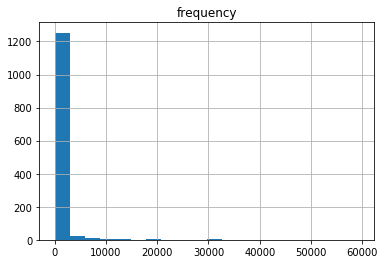

In [211]:
hist=df.hist(bins=20)

## Use NLTK and Wordnet to cluster synonym words

In [1]:
import nltk
from nltk.corpus import wordnet

In [14]:
synonyms = []
for syn in wordnet.synsets('car'):
        for lemma in syn.lemmas():
            synonyms.append(lemma.name())

In [15]:
print(synonyms)

['car', 'auto', 'automobile', 'machine', 'motorcar', 'car', 'railcar', 'railway_car', 'railroad_car', 'car', 'gondola', 'car', 'elevator_car', 'cable_car', 'car']


## Quickview on review.json dataset 

In [53]:
# note that this json file contain multiple json objects, therefore it needs to decode it
with open('dataset/review.json') as f:data = [json.loads(line) for line in f]

In [54]:
rv = pd.DataFrame.from_dict(data)

In [55]:
rv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6685900 entries, 0 to 6685899
Data columns (total 9 columns):
business_id    object
cool           int64
date           object
funny          int64
review_id      object
stars          float64
text           object
useful         int64
user_id        object
dtypes: float64(1), int64(3), object(5)
memory usage: 459.1+ MB


In [56]:
rv.head()

,business_id,cool,date,funny,review_id,stars,text,useful,user_id
0,ujmEBvifdJM6h6RLv4wQIg,0,2013-05-07 04:34:36,1,Q1sbwvVQXV2734tPgoKj4Q,1.0,Total bill for this horrible service? Over $8G...,6,hG7b0MtEbXx5QzbzE6C_VA
1,NZnhc2sEQy3RmzKTZnqtwQ,0,2017-01-14 21:30:33,0,GJXCdrto3ASJOqKeVWPi6Q,5.0,I *adore* Travis at the Hard Rock's new Kelly ...,0,yXQM5uF2jS6es16SJzNHfg
2,WTqjgwHlXbSFevF32_DJVw,0,2016-11-09 20:09:03,0,2TzJjDVDEuAW6MR5Vuc1ug,5.0,I have to say that this office really has it t...,3,n6-Gk65cPZL6Uz8qRm3NYw
3,ikCg8xy5JIg_NGPx-MSIDA,0,2018-01-09 20:56:38,0,yi0R0Ugj_xUx_Nek0-_Qig,5.0,Went in for a lunch. Steak sandwich was delici...,0,dacAIZ6fTM6mqwW5uxkskg
4,b1b1eb3uo-w561D0ZfCEiQ,0,2018-01-30 23:07:38,0,11a8sVPMUFtaC7_ABRkmtw,1.0,Today was my second out of three sessions I ha...,7,ssoyf2_x0EQMed6fgHeMyQ


## Quickview on tip.json dataset

In [61]:
# note that this json file contain multiple json objects, therefore it needs to decode it
with open('dataset/tip.json') as f:tip = [json.loads(line) for line in f]

In [62]:
tp = pd.DataFrame.from_dict(tip)

In [63]:
tp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1223094 entries, 0 to 1223093
Data columns (total 5 columns):
business_id         1223094 non-null object
compliment_count    1223094 non-null int64
date                1223094 non-null object
text                1223094 non-null object
user_id             1223094 non-null object
dtypes: int64(1), object(4)
memory usage: 46.7+ MB


In [64]:
tp.head()

,business_id,compliment_count,date,text,user_id
0,VaKXUpmWTTWDKbpJ3aQdMw,0,2014-03-27 03:51:24,"Great for watching games, ufc, and whatever el...",UPw5DWs_b-e2JRBS-t37Ag
1,OPiPeoJiv92rENwbq76orA,0,2013-05-25 06:00:56,Happy Hour 2-4 daily with 1/2 price drinks and...,Ocha4kZBHb4JK0lOWvE0sg
2,5KheTjYPu1HcQzQFtm4_vw,0,2011-12-26 01:46:17,Good chips and salsa. Loud at times. Good serv...,jRyO2V1pA4CdVVqCIOPc1Q
3,TkoyGi8J7YFjA6SbaRzrxg,0,2014-03-23 21:32:49,The setting and decoration here is amazing. Co...,FuTJWFYm4UKqewaosss1KA
4,AkL6Ous6A1atZejfZXn1Bg,0,2012-10-06 00:19:27,Molly is definately taking a picture with Sant...,LUlKtaM3nXd-E4N4uOk_fQ
